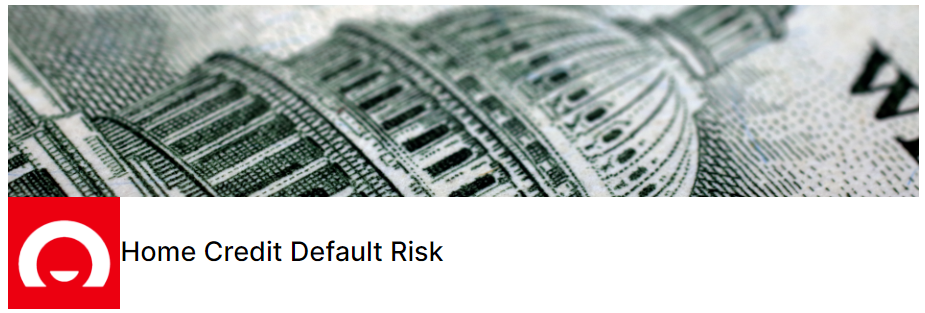

##**Import Libraries**

In [ ]:
import numpy as np
import pandas as pd

# -----------------------------------------------------
import scipy
import sklearn
import statsmodels.api as sm

# -----------------------------------------------------
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go

# -----------------------------------------------------
from scipy.stats import shapiro
from plotly.offline import iplot
from matplotlib.pyplot import figure
from pandas.api.types import is_string_dtype 
from pandas.api.types import is_numeric_dtype

# -----------------------------------------------------
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder

# -----------------------------------------------------
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

# -----------------------------------------------------
from sklearn.metrics import auc, roc_curve
from sklearn.metrics import roc_auc_score, f1_score
from sklearn.metrics import confusion_matrix

# -----------------------------------------------------
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# -----------------------------------------------------
from sklearn.decomposition import PCA

# -----------------------------------------------------
from collections import Counter

# -----------------------------------------------------
import warnings
warnings.filterwarnings('ignore')

##**Define Functions**

In [ ]:
# обнаружение выбросов
def outlier_detect(df, col):
    q1_col = Q1[col]
    iqr_col = IQR[col]
    q3_col = Q3[col]
    
    return df[((df[col] < (q1_col - 1.5 * iqr_col)) 
           | (df[col] > (q3_col + 1.5 * iqr_col)))]

# ------------------------------------------------------------------------

# вычисление нижних выбросов
def lower_outlier(df, col):
    q1_col = Q1[col]
    iqr_col = IQR[col]
    q3_col = Q3[col]
    lower = df[(df[col] < (q1_col - 1.5 * iqr_col))]
    
    return lower

# ------------------------------------------------------------------------

# вычисление верхних выбросов
def upper_outlier(df, col):
    q1_col = Q1[col]
    iqr_col = IQR[col]
    q3_col = Q3[col]
    upper = df[(df[col] > (q3_col + 1.5 * iqr_col))]
    
    return upper

# ------------------------------------------------------------------------

# визуализация выбросов и плотности распределения для числовых признаков
def preprocess(df, col):
    print(f'**************** {col} ****************\n')
    print(f'lower outlier: {lower_outlier(df,col).shape[0]}\
            upper outlier: {upper_outlier(df,col).shape[0]}\n')
    plt.figure(figsize=(10,8))
    plt.subplot(2,1,1)
    df[col].plot(kind='box', subplots=True, sharex=False, vert=False)
    plt.subplot(2,1,2)
    df[col].plot(kind='density', subplots=True, sharex=False)
    plt.show()

# ------------------------------------------------------------------------

# визуализация распределения для категориальных признаков
def preprocess_cat(df, col):
    print(f'**************** {col} ****************\n')
    df[col].value_counts().plot(kind='bar')
    plt.xticks(rotation='vertical')
    plt.show()

# ------------------------------------------------------------------------

# замена нижних выбросов
def replace_lower(df, col):
    q1_col = Q1[col]
    iqr_col = IQR[col]
    q3_col = Q3[col]
    tmp = 1111111
    lower = q1_col - 1.5 * iqr_col
    df[col] = df[col].where(lambda x: (x > (lower)), tmp)
    df[col] = df[col].replace(tmp, lower)

# ------------------------------------------------------------------------

# замена верхних выбросов
def replace_upper(df, col):
    q1_col = Q1[col]
    iqr_col = IQR[col]
    q3_col = Q3[col]
    tmp = 9999999
    upper = q3_col + 1.5 * iqr_col
    df[col] = df[col].where(lambda x: (x < (upper)), tmp)
    df[col] = df[col].replace(tmp, upper)

# ------------------------------------------------------------------------

# замена пропущенных значений на моду
def replace_mode(df, col):
    df[col] = df[col].fillna(df[col].mode()[0])
    print(f'NaN in {col} raplaced with {df[col].mode()[0]}')

# ------------------------------------------------------------------------

# замена пропущенных значений на среднее
def replace_mean(df, col):
    df[col] = df[col].fillna(df[col].mean())
    print(f'NaN in {col} raplaced with {df[col].mean()}')
    
# ------------------------------------------------------------------------

# замена пропущенных значений на медиану
def replace_median(df, col):
    df[col] = df[col].fillna(df[col].median())
    print(f'NaN in {col} raplaced with {df[col].median()}')

# ------------------------------------------------------------------------

# деление признаков на числовые и категориальные
def separation_features(df):
    numeric_features=[]
    categorical_features=[]

    for col in df.columns:
        if is_numeric_dtype(df[col]):
            numeric_features.append(col)
        if is_string_dtype(df[col]):
            categorical_features.append(col)
      
    return numeric_features, categorical_features

# ----------------------------------------------------------

# вычисление показателей перекрестной проверки

kfold = StratifiedKFold(n_splits=5, random_state=100, shuffle=True)

def cross_validation(x, y, model):
    result= cross_val_score(model,
                            x,
                            y,
                            cv=kfold,
                            scoring='roc_auc',
                            n_jobs=-1)
    print(f'Score: {result.mean()}')
    
# ----------------------------------------------------------

# подбор оптимальных гиперпараметров

def RndSrch_Tune(model, X, y, params):
    clf = RandomizedSearchCV(model,
                             params,
                             scoring='roc_auc',
                             cv=kfold,
                             n_jobs=-1,
                             random_state=100)
    clf.fit(X, y)
    print('Best score is :' , clf.best_score_)
    print('Best estimator is :' , clf.best_estimator_)
    print('Best Params is :' , clf.best_params_)
    
    return (clf.best_score_)

##**Data Understanding**

###Loading Data

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving application_train.csv to application_train.csv


In [ ]:
data = pd.read_csv('application_train.csv')

###Overview Information

In [ ]:
# Сброс ограничений на число столбцов
pd.set_option('display.max_columns', None)

# Сброс ограничений на число строк до 200
pd.set_option('display.max_rows', 200)

In [ ]:
data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [ ]:
data.tail()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,Unaccompanied,Working,Secondary / secondary special,Separated,With parents,0.032561,-9327,-236,-8456.0,-1982,NaN,1,1,0,1,0,0,Sales staff,1.0,1,1,THURSDAY,15,0,0,0,0,0,0,Services,0.145570,0.681632,NaN,0.2021,0.0887,0.9876,0.8300,0.0202,0.22,0.1034,0.6042,0.2708,0.0594,0.1484,0.1965,0.0753,0.1095,0.1008,0.0172,0.9782,0.7125,0.0172,0.0806,0.0345,0.4583,0.0417,0.0094,0.0882,0.0853,0.0,0.0125,0.2040,0.0887,0.9876,0.8323,0.0203,0.22,0.1034,0.6042,0.2708,0.0605,0.1509,0.2001,0.0757,0.1118,reg oper account,block of flats,0.2898,"Stone, brick",No,0.0,0.0,0.0,0.0,-273.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,Unaccompanied,Pensioner,Secondary / secondary special,Widow,House / apartment,0.025164,-20775,365243,-4388.0,-4090,NaN,1,0,0,1,1,0,NaN,1.0,2,2,MONDAY,8,0,0,0,0,0,0,XNA,NaN,0.115992,NaN,0.0247,0.0435,0.9727,0.6260,0.0022,0.00,0.1034,0.0833,0.1250,0.0579,0.0202,0.0257,0.0000,0.0000,0.0252,0.0451,0.9727,0.6406,0.0022,0.0000,0.1034,0.0833,0.1250,0.0592,0.0220,0.0267,0.0,0.0000,0.0250,0.0435,0.9727,0.6310,0.0022,0.00,0.1034,0.0833,0.1250,0.0589,0.0205,0.0261,0.0000,0.0000,reg oper account,block of flats,0.0214,"Stone, brick",No,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,Unaccompanied,Working,Higher education,Separated,House / apartment,0.005002,-14966,-7921,-6737.0,-5150,NaN,1,1,0,1,0,1,Managers,1.0,3,3,THURSDAY,9,0,0,0,0,1,1,School,0.744026,0.535722,0.218859,0.1031,0.0862,0.9816,0.7484,0.0123,0.00,0.2069,0.1667,0.2083,NaN,0.0841,0.9279,0.0000,0.0000,0.1050,0.0894,0.9816,0.7583,0.0124,0.0000,0.2069,0.1667,0.2

In [ ]:
data.shape

(307511, 122)

In [ ]:
data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

In [ ]:
# verbose - печатать полное резюме
# show_counts - показывать ненулевые значения

data.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

###Feature Engineering

In [ ]:
# Исходная размерность

data.shape

(307511, 122)

In [ ]:
# Добавим новые признаки


# LTV   >>>   кредит к стоимости
# Имеет решающее значение в процессе одобрения кредита
# Соотношение = Кредит ('AMT_CREDIT') / Стоимость залога ('AMT_GOODS_PRICE')
data['LTV'] = data['AMT_CREDIT'] / data['AMT_GOODS_PRICE']

# DTI   >>>   долг к доходу
# Имеет решающее значение в процессе одобрения кредита
# Соотношение = Сумма всех ежемесячных платежей по долгу ('AMT_ANNUITY') / 
# Валовой ежемесячный доход ('AMT_INCOME_TOTAL')
data['DTI'] = data['AMT_ANNUITY'] / data['AMT_INCOME_TOTAL']

# Employed/Birth   >>>   Занятость/Рождение
# Представляет собой процент отработанных дней
data['Employed/Birth'] = data['DAYS_EMPLOYED'] / data['DAYS_BIRTH']

# Flag_Greater_30   >>>   Флаг
# Показывает, превышает ли возраст клиента 30 лет
data['Flag_Greater_30'] = (data['DAYS_BIRTH'] / -365.25)\
                          .apply(lambda x: 1 if x > 30 else 0)

# Flag_Employment_Greater_5   >>>   Флаг
# Показывает, превышает ли стаж работы клиента 5 лет
data['Flag_Employment_Greater_5'] = (data['DAYS_EMPLOYED'] / -365.25)\
                                    .apply(lambda x: 1 if x > 5 else 0)

In [ ]:
# Проверим

data.shape

(307511, 127)

###Separation of Numerical & Categorical Features

In [ ]:
# Разделим признаки на числовые и категориальные

numeric_features, categorical_features = separation_features(data)

In [ ]:
# Количество числовых признаков

len(numeric_features)

111

In [ ]:
# Числовые признаки

numeric_features

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAR

In [ ]:
# Количество категориальных признаков

len(categorical_features)

16

In [ ]:
# Категориальные признаки

categorical_features

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

##**Visual Analysis**

In [ ]:
# Унакальные значения 'TARGET'
data['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

In [ ]:
# Распределение клиентов по классам TARGET
# Видим дисбаланс классов

sum_counts = data['TARGET'].value_counts().sort_index()

fig = go.Figure()

fig.add_trace(go.Pie(values=sum_counts,
                     labels=sum_counts.index,
                     textinfo='label+percent',
                     pull=[0, 0.02],
                     hole=.6))

fig.update_layout(annotations=[dict(
                  text='Распределение<br>клиентов по<br>классам TARGET',
                  x=0.5,
                  y=0.5,
                  font_size=20,
                  showarrow=False)])

fig.show()

In [ ]:
# Унакальные значения 'CODE_GENDER'
data['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [ ]:
# Видим, что у признака CODE_GENDER присутствует 3 группы
# включая 4 наблюдения, имеющих значение XNA

data[data['CODE_GENDER'] == 'XNA']

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,LTV,DTI,Employed/Birth,Flag_Greater_30,Flag_Employment_Greater_5
35657,141289,0,Revolving loans,XNA,Y,Y,0,207000.0,382500.0,19125.0,337500.0,Unaccompanied,Working,Secondary / secondary special,Married,Municipal apartment,0.020713,-20232,-10044,-10024.0,-3537,13.0,1,1,1,1,1,0,NaN,2.0,3,3,TUESDAY,10,0,0,0,0,0,0,Business Entity Type 1,NaN,0.295998,0.461482,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-286.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,1.133333,0.092391,0.496441,1,1
38566,144669,0,Revolving loans,XNA,N,Y,2,157500.0,270000.0,13500.0,225000.0,Family,Working,Secondary / secondary special,Married,House / apartment,0.026392,-13717,-2797,-2241.0,-4659,NaN,1,1,1,1,1,0,Low-skill Laborers,4.0,2,2,FRIDAY,16,0,0,0,0,0,0,Industry: type 3,NaN,0.709205,0.310818,0.0165,0.0368,0.9811,NaN,NaN,0.0,0.0690,0.0417,NaN,0.0233,NaN,0.0115,NaN,0.0000,0.0168,0.0382,0.9811,NaN,NaN,0.0,0.0690,0.0417,NaN,0.0238,NaN,0.0120,NaN,0.0000,0.0167,0.0368,0.9811,NaN,NaN,0.0,0.0690,0.0417,NaN,0.0237,NaN,0.0117,NaN,0.000,NaN,block of flats,0.0090,"Stone, brick",No,0.0,0.0,0.0,0.0,-493.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,3.0,0.0,4.0,1.200000,0.085714,0.203908,1,1
83382,196708,0,Revolving loans,XNA,N,Y,1,135000.0,405000.0,20250.0,225000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.035792,-10647,-1228,-183.0,-1671,NaN,1,1,1,1,1,0,Core staff,3.0,2,2,THURSDAY,15,0,0,0,0,0,0,Kindergarten,0.404970,0.659185,0.076984,0.0773,0.1353,0.9921,0.8912,NaN,0.0,0.1379,0.1667,0.0417,NaN,0.0630,0.0621,0.0000,NaN,0.0788,0.1404,0.9921,0.8955,NaN,0.0,0.1379,0.1667,0.0417,NaN,0.0689,0.0647,0.0000,NaN,0

In [ ]:
# Для устранения излишней информации на графиках удалим эти наблюдения

data.drop(data.index[data['CODE_GENDER'] == 'XNA'], inplace = True)

In [ ]:
# Проверим

data['CODE_GENDER'].value_counts()

F    202448
M    105059
Name: CODE_GENDER, dtype: int64

In [ ]:
# Распределение клиентов по полу
# Женщины значительно чаще берут кредиты

sum_counts = data['CODE_GENDER'].value_counts().sort_index()

fig = go.Figure()

fig.add_trace(go.Pie(values=sum_counts,
                     labels=sum_counts.index,
                     textinfo='label+percent',
                     pull=[0, 0.02],
                     hole=.6))

fig.update_layout(annotations=[dict(
                  text='Распределение<br>клиентов<br>по полу',
                  x=0.5,
                  y=0.5,
                  font_size=20,
                  showarrow=False)])

fig.show()

In [ ]:
# Унакальные значения 'NAME_CONTRACT_TYPE'

# Cash loans        >>>   Кредиты наличными
# Revolving loans   >>>   Возобновляемые кредиты

data['NAME_CONTRACT_TYPE'].value_counts()

Cash loans         278232
Revolving loans     29275
Name: NAME_CONTRACT_TYPE, dtype: int64

In [ ]:
# Распределение клиентов по типу договора
# 90.5% кредитов выдаются наличными

sum_counts = data['NAME_CONTRACT_TYPE'].value_counts().sort_index()

fig = go.Figure()

fig.add_trace(go.Pie(values=sum_counts,
                     labels=sum_counts.index,
                     textinfo='label+percent',
                     pull=[0, 0.02],
                     hole=.6))

fig.update_layout(annotations=[dict(
                  text='Распределение<br>клиентов по типу<br>договора',
                  x=0.5,
                  y=0.5,
                  font_size=20,
                  showarrow=False)])

fig.show()

In [ ]:
# Унакальные значения 'FLAG_OWN_CAR'

data['FLAG_OWN_CAR'].value_counts()

N    202922
Y    104585
Name: FLAG_OWN_CAR, dtype: int64

In [ ]:
# Распределение клиентов по наличию автомобиля
# Влвдеют автомобилем только 34% клиентов

sum_counts = data['FLAG_OWN_CAR'].value_counts().sort_index()

fig = go.Figure()

fig.add_trace(go.Pie(values=sum_counts,
                     labels=sum_counts.index,
                     textinfo='label+percent',
                     pull=[0, 0.02],
                     hole=.6))

fig.update_layout(annotations=[dict(
                  text='Распределение<br>клиентов по<br>наличию<br>автомобиля',
                  x=0.5,
                  y=0.5,
                  font_size=20,
                  showarrow=False)])

fig.show()

In [ ]:
# Унакальные значения 'FLAG_OWN_REALTY'

data['FLAG_OWN_REALTY'].value_counts()

Y    213308
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

In [ ]:
# Распределение клиентов по наличию недвижимости
# 69.4% клиентов имеют недвижимость

sum_counts = data['FLAG_OWN_REALTY'].value_counts().sort_index()

fig = go.Figure()

fig.add_trace(go.Pie(values=sum_counts,
                     labels=sum_counts.index,
                     textinfo='label+percent',
                     pull=[0, 0.02],
                     hole=.6))

fig.update_layout(annotations=[dict(
                  text='Распределение<br>клиентов по<br>наличию<br>недвижимости',
                  x=0.5,
                  y=0.5,
                  font_size=20,
                  showarrow=False)])

fig.show()

In [ ]:
# Унакальные значения 'NAME_EDUCATION_TYPE'

# Secondary / secondary special   >>>   Среднее / среднее специальное
# Higher education                >>>   Высшее образование
# Incomplete higher               >>>   Неполное высшее
# Lower secondary                 >>>   Неполное среднее
# Academic degree                 >>>   Ученая степень

data['NAME_EDUCATION_TYPE'].value_counts()

Secondary / secondary special    218389
Higher education                  74862
Incomplete higher                 10276
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64

In [ ]:
# Распределение клиентов по уровню образования
# 71% заемщиков имеют среднее / среднее специальное образование

sum_counts = data['NAME_EDUCATION_TYPE'].value_counts().sort_index()

fig = go.Figure()

fig.add_trace(go.Pie(values=sum_counts,
                     labels=sum_counts.index,
                     pull=[0, 0, 0, 0, 0.02],
                     hole=.6))

fig.update_layout(annotations=[dict(
                  text='Распределение<br>клиентов по<br>уровню<br>образования',
                  x=0.5,
                  y=0.5,
                  font_size=20,
                  showarrow=False)])

fig.show()

In [ ]:
# Унакальные значения 'CNT_CHILDREN'

data['CNT_CHILDREN'].value_counts()

0     215369
1      61118
2      26748
3       3717
4        429
5         84
6         21
7          7
14         3
8          2
9          2
12         2
10         2
19         2
11         1
Name: CNT_CHILDREN, dtype: int64

In [ ]:
# Распределение клиентов по количеству детей
# Подавляющее большинство кредитов выдано клиентам не имеющим детей

sum_counts = data['CNT_CHILDREN'].value_counts().sort_index()

fig = go.Figure()

fig.add_trace(go.Pie(values=sum_counts,
                     labels=sum_counts.index,
                     pull=[0.02],
                     hole=.6))

fig.update_layout(annotations=[dict(
                  text='Распределение<br>клиентов по<br>количеству<br>детей',
                  x=0.5,
                  y=0.5,
                  font_size=20,
                  showarrow=False)])

fig.show()

In [ ]:
# Унакальные значения 'NAME_HOUSING_TYPE'

# House / apartment     >>>   Дом / квартира
# With parents          >>>   С родителями
# Municipal apartment   >>>   Муниципальная квартира
# Rented apartment      >>>   Съемная квартира
# Office apartment      >>>   Рабочая квартира
# Co-op apartment       >>>   Кооперативная квартира

data['NAME_HOUSING_TYPE'].value_counts()

House / apartment      272865
With parents            14840
Municipal apartment     11182
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64

In [ ]:
# Распределение клиентов по типу жилья
# 88.7% клиентов проживают в доме / квартире

sum_counts = data['NAME_HOUSING_TYPE'].value_counts().sort_index()

fig = go.Figure()

fig.add_trace(go.Pie(values=sum_counts,
                     labels=sum_counts.index,
                     pull=[0, 0.02, 0, 0, 0, 0],
                     hole=.6))

fig.update_layout(annotations=[dict(
                  text='Распределение<br>клиентов по<br>типу жилья',
                  x=0.5,
                  y=0.5,
                  font_size=20,
                  showarrow=False)])

fig.show()

In [ ]:
# Унакальные значения 'NAME_INCOME_TYPE'

# Working                >>>   Работающий
# Commercial associate   >>>   Коммерческий партнер
# Pensioner              >>>   Пенсионер
# State servant          >>>   Государственный служащий
# Unemployed             >>>   Безработные
# Student                >>>   Студент
# Businessman            >>>   Бизнесмен
# Maternity leave        >>>   Декретный отпуск

data['NAME_INCOME_TYPE'].value_counts()

Working                 158771
Commercial associate     71616
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

In [ ]:
# Распределение клиентов по типу дохода
# Любопытно, что 18% заемщиков являются пенсионерами

sum_counts = data['NAME_INCOME_TYPE'].value_counts().sort_index()

fig = go.Figure()

fig.add_trace(go.Pie(values=sum_counts,
                     labels=sum_counts.index,
                     pull=[0, 0, 0, 0, 0, 0, 0, 0.02],
                     hole=.6))

fig.update_layout(annotations=[dict(
                  text='Распределение<br>клиентов по<br>типу дохода',
                  x=0.5,
                  y=0.5,
                  font_size=20,
                  showarrow=False)])

fig.show()

In [ ]:
# Унакальные значения 'NAME_FAMILY_STATUS'

# Married                >>>   Женат
# Single / not married   >>>   Холост/не замужем
# Civil marriage         >>>   Гражданский брак
# Separated              >>>   Развод
# Widow                  >>>   Вдова
# Unknown                >>>   Неизвестно

data['NAME_FAMILY_STATUS'].value_counts()

Married                 196429
Single / not married     45444
Civil marriage           29774
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

In [ ]:
# Распределение клиентов по семейному положению
# Большая часть клиентов состоят в браке

sum_counts = data['NAME_FAMILY_STATUS'].value_counts().sort_index()

fig = go.Figure()

fig.add_trace(go.Pie(values=sum_counts,
                     labels=sum_counts.index,
                     pull=[0, 0.02, 0, 0, 0, 0],
                     hole=.6))

fig.update_layout(annotations=[dict(
                  text='Распределение<br>клиентов по<br>семейному<br>положению',
                  x=0.5,
                  y=0.5,
                  font_size=20,
                  showarrow=False)])

fig.show()

In [ ]:
# Количество клиентов в каждом целевом классе по роду занятий
# Водители и сотрудники охранных предприятий чаще не выплачивают кредит

fig = px.histogram(data,
                   x='OCCUPATION_TYPE', 
                   color='TARGET',
                   barmode='group')\
                   .update_xaxes(categoryorder='total descending')

fig.update_layout(title='Количество клиентов в каждом целевом классе по роду занятий',
                  title_x=0.5,
                  title_y=0.001)

fig.show()

In [ ]:
# Количество клиентов в каждом целевом классе по типу организации
# Частные предприниматели чаще имеют проблемы с выплатами

fig = px.histogram(data,
                   x='ORGANIZATION_TYPE', 
                   color='TARGET',
                   barmode='group')\
                   .update_xaxes(categoryorder='total descending')

fig.update_layout(title='Количество клиентов в каждом целевом классе по типу организации',
                  title_x=0.5,
                  title_y=0.001)

fig.show()

In [ ]:
# Распределение клиентов по возрасту
# Большая часть клиентов находится в диапазоне 30-45 лет

fig = px.histogram(x=np.abs(data['DAYS_BIRTH'])/365,
                  barmode='group',
                  nbins=15)\
                  .update_xaxes(categoryorder='total descending')

fig.update_layout(bargap=0.05,
                  xaxis=dict(title='Age (years)'),
                  title='Распределение клиентов по возрасту',
                  title_x=0.5,
                  title_y=0.01)

fig.show()

In [ ]:
# Распределение клиентов по возрасту и классам TARGET
# С возрастом клиенты становятся более ответственными,
# молодые люди чаще имеют проблемы с выплатами, однако,
# после 41 года ситуация меняется

fig = ff.create_distplot([np.abs(data.loc[data['TARGET'] == 0, 'DAYS_BIRTH']) / 365, 
                          np.abs(data.loc[data['TARGET'] == 1, 'DAYS_BIRTH']) / 365], 
                         ['target = 0', 'target = 1'],
                          bin_size=[2, 2],
                          show_rug=False,
                          show_hist=False,
                          show_curve=True)

fig.update_layout(xaxis=dict(title='Age (years)'),
                  yaxis=dict(title='Density'),
                  barmode='overlay',
                  title='Распределение клиентов по возрасту и классам TARGET',
                  title_x=0.5,
                  title_y=0.01)

fig.show()

In [ ]:
# Распределение EXT_SOURCE_1 по классам TARGET
# Внешний источник (не уточняется какой именно),
# данный признак имеет очень высокую важность

# Распределение похоже на распределение по возрасту
# можно сделать косвенный вывод о том, что с возрастом клиенты
# становятся более ответственными и надежными

fig = ff.create_distplot([data[data['TARGET']==0]['EXT_SOURCE_1'].dropna(), 
                          data[data['TARGET']==1]['EXT_SOURCE_1'].dropna()], 
                         ['target = 0', 'target = 1'],
                         bin_size=[2, 2],
                         show_rug=False,
                         show_hist=False,
                         show_curve=True)

fig.update_layout(xaxis=dict(title='EXT_SOURCE_1'),
                  yaxis=dict(title='Density'),
                  barmode='overlay',
                  title='Распределение EXT_SOURCE_1 по классам TARGET',
                  title_x=0.5,
                  title_y=0.01)
fig.show()

In [ ]:
# Распределение EXT_SOURCE_2 по классам TARGET
# Внешний источник (не уточняется какой именно),
# данный признак имеет очень высокую важность

# Распределение похоже на распределение по возрасту
# можно сделать косвенный вывод о том, что с возрастом клиенты
# становятся более ответственными и надежными

fig = ff.create_distplot([data[data['TARGET']==0]['EXT_SOURCE_2'].dropna(), 
                          data[data['TARGET']==1]['EXT_SOURCE_2'].dropna()], 
                         ['target = 0', 'target = 1'],
                         bin_size=[2, 2],
                         show_rug=False,
                         show_hist=False,
                         show_curve=True)

fig.update_layout(xaxis=dict(title='EXT_SOURCE_2'),
                  yaxis=dict(title='Density'),
                  barmode='overlay',
                  title='Распределение EXT_SOURCE_2 по классам TARGET',
                  title_x=0.5,
                  title_y=0.01)
fig.show()

In [ ]:
# Распределение EXT_SOURCE_3 по классам TARGET
# Внешний источник (не уточняется какой именно),
# данный признак имеет очень высокую важность

# Распределение похоже на распределение по возрасту
# можно сделать косвенный вывод о том, что с возрастом клиенты
# становятся более ответственными и надежными

fig = ff.create_distplot([data[data['TARGET']==0]['EXT_SOURCE_3'].dropna(), 
                          data[data['TARGET']==1]['EXT_SOURCE_3'].dropna()], 
                         ['target = 0', 'target = 1'],
                         bin_size=[2, 2],
                         show_rug=False,
                         show_hist=False,
                         show_curve=True)

fig.update_layout(xaxis=dict(title='EXT_SOURCE_3'),
                  yaxis=dict(title='Density'),
                  barmode='overlay',
                  title='Распределение EXT_SOURCE_3 по классам TARGET',
                  title_x=0.5,
                  title_y=0.01)
fig.show()

##**Preprocessing**

###Duplicate Analysis

In [ ]:
# Дублирующиеся строки отсутствуют

data.duplicated().sum()

0

###Missing Value Analysis

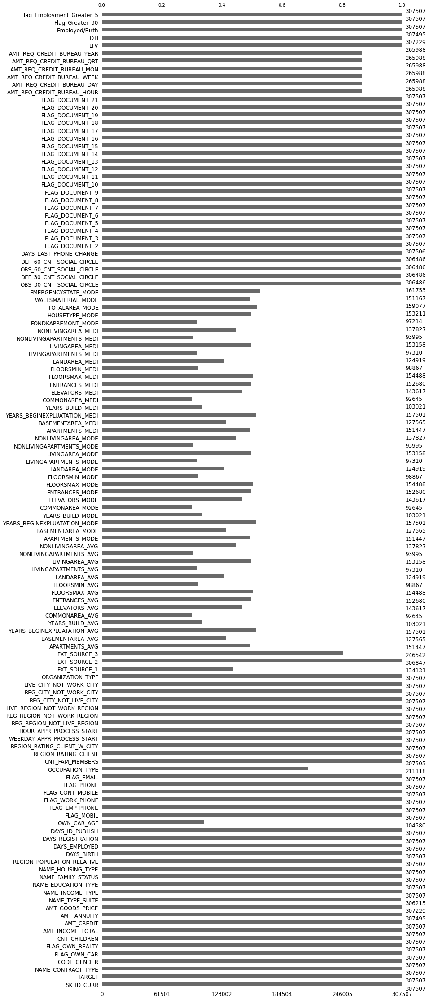

In [ ]:
# Пропущенные значения

msno.bar(data, figsize=(12,40), fontsize=12)

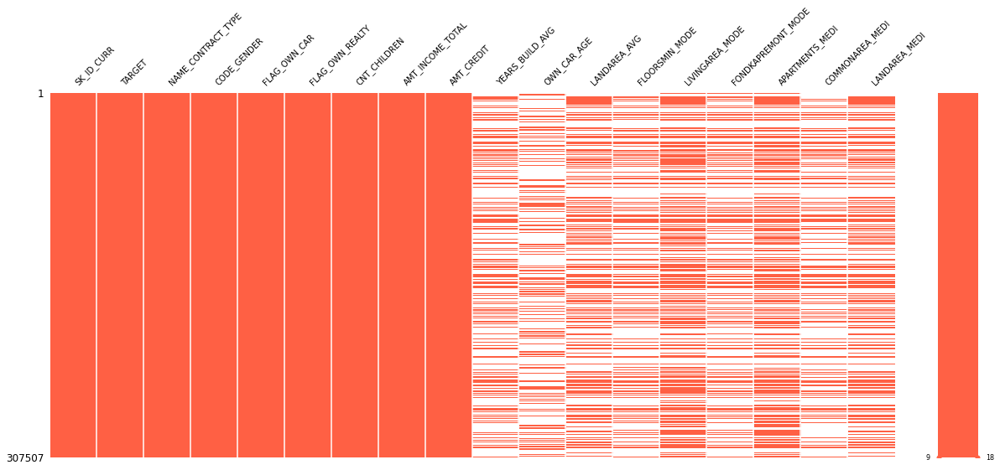

In [ ]:
# Информационно
# распределение пропущенных значений для некоторых признаков

msno.matrix(data[['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE',
                  'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
                  'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
                  'YEARS_BUILD_AVG', 'OWN_CAR_AGE', 'LANDAREA_AVG',
                  'FLOORSMIN_MODE', 'LIVINGAREA_MODE',
                  'FONDKAPREMONT_MODE', 'APARTMENTS_MEDI',
                  'COMMONAREA_MEDI', 'LANDAREA_MEDI']],
            figsize=(20, 8),
            fontsize=10,
            color=(1, 0.38, 0.27))

In [ ]:
# Сумма пропущенных значений
data.isna().sum().sort_values(ascending=False)

COMMONAREA_AVG                  214862
COMMONAREA_MEDI                 214862
COMMONAREA_MODE                 214862
NONLIVINGAPARTMENTS_MEDI        213512
NONLIVINGAPARTMENTS_AVG         213512
NONLIVINGAPARTMENTS_MODE        213512
FONDKAPREMONT_MODE              210293
LIVINGAPARTMENTS_MODE           210197
LIVINGAPARTMENTS_MEDI           210197
LIVINGAPARTMENTS_AVG            210197
FLOORSMIN_MODE                  208640
FLOORSMIN_AVG                   208640
FLOORSMIN_MEDI                  208640
YEARS_BUILD_MODE                204486
YEARS_BUILD_AVG                 204486
YEARS_BUILD_MEDI                204486
OWN_CAR_AGE                     202927
LANDAREA_MODE                   182588
LANDAREA_AVG                    182588
LANDAREA_MEDI                   182588
BASEMENTAREA_MEDI               179942
BASEMENTAREA_MODE               179942
BASEMENTAREA_AVG                179942
EXT_SOURCE_1                    173376
NONLIVINGAREA_MODE              169680
NONLIVINGAREA_AVG        

In [ ]:
# Процент пропущенных значений
(data.isna().sum().sort_values(ascending=False) / len(data)).round(4) * 100

COMMONAREA_AVG                  69.87
COMMONAREA_MEDI                 69.87
COMMONAREA_MODE                 69.87
NONLIVINGAPARTMENTS_MEDI        69.43
NONLIVINGAPARTMENTS_AVG         69.43
NONLIVINGAPARTMENTS_MODE        69.43
FONDKAPREMONT_MODE              68.39
LIVINGAPARTMENTS_MODE           68.36
LIVINGAPARTMENTS_MEDI           68.36
LIVINGAPARTMENTS_AVG            68.36
FLOORSMIN_MODE                  67.85
FLOORSMIN_AVG                   67.85
FLOORSMIN_MEDI                  67.85
YEARS_BUILD_MODE                66.50
YEARS_BUILD_AVG                 66.50
YEARS_BUILD_MEDI                66.50
OWN_CAR_AGE                     65.99
LANDAREA_MODE                   59.38
LANDAREA_AVG                    59.38
LANDAREA_MEDI                   59.38
BASEMENTAREA_MEDI               58.52
BASEMENTAREA_MODE               58.52
BASEMENTAREA_AVG                58.52
EXT_SOURCE_1                    56.38
NONLIVINGAREA_MODE              55.18
NONLIVINGAREA_AVG               55.18
NONLIVINGARE

In [ ]:
# Количество пропущенных значений с указанием типа данных

concat_application_train = pd.concat([data.isnull().sum()
                             .reset_index(name='sum_of_nulls'), 
                              data.dtypes.reset_index(name='dtypes')],
                              axis=1).T.drop_duplicates().T

concat_application_train.sort_values('sum_of_nulls', ascending=False)

,index,sum_of_nulls,dtypes
48,COMMONAREA_AVG,214862,float64
76,COMMONAREA_MEDI,214862,float64
62,COMMONAREA_MODE,214862,float64
84,NONLIVINGAPARTMENTS_MEDI,213512,float64
56,NONLIVINGAPARTMENTS_AVG,213512,float64
70,NONLIVINGAPARTMENTS_MODE,213512,float64
86,FONDKAPREMONT_MODE,210293,object
68,LIVINGAPARTMENTS_MODE,210197,float64
82,LIVINGAPARTMENTS_MEDI,210197,float64
54,LIVINGAPARTMENTS_AVG,210197,float64


###Outlier Analysis

In [ ]:
# Числовые признаки

numeric = data[numeric_features]
numeric_col = numeric.columns

In [ ]:
# IQR

Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1

**************** SK_ID_CURR ****************

lower outlier: 0            upper outlier: 0



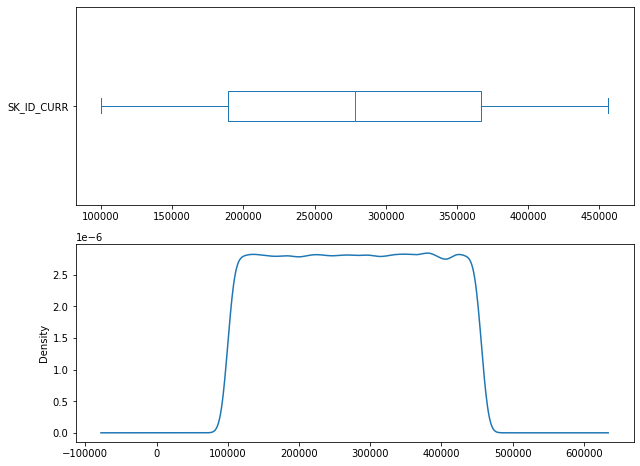

**************** TARGET ****************

lower outlier: 0            upper outlier: 24825



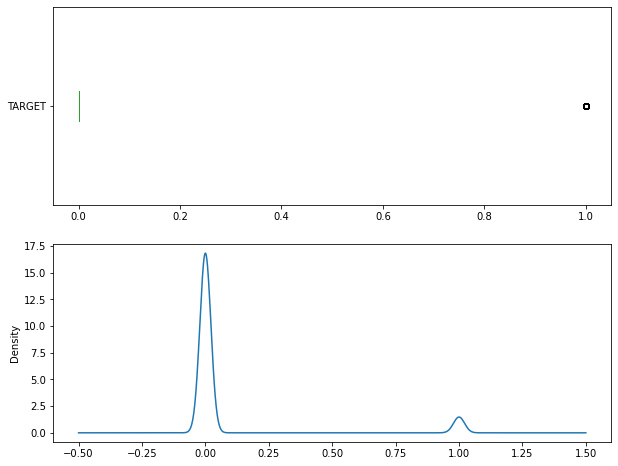

**************** CNT_CHILDREN ****************

lower outlier: 0            upper outlier: 4272



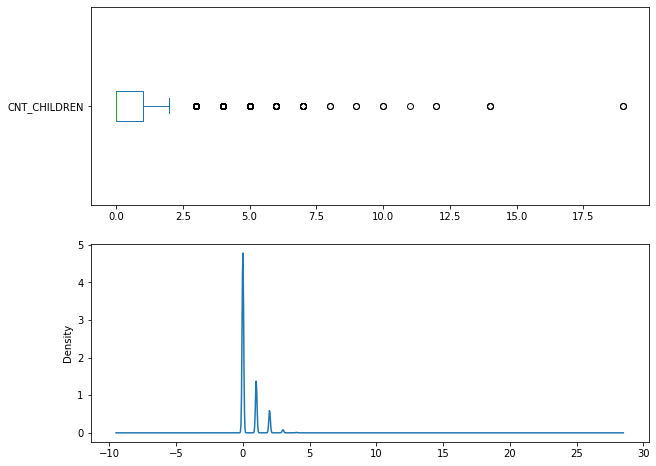

**************** AMT_INCOME_TOTAL ****************

lower outlier: 0            upper outlier: 14035



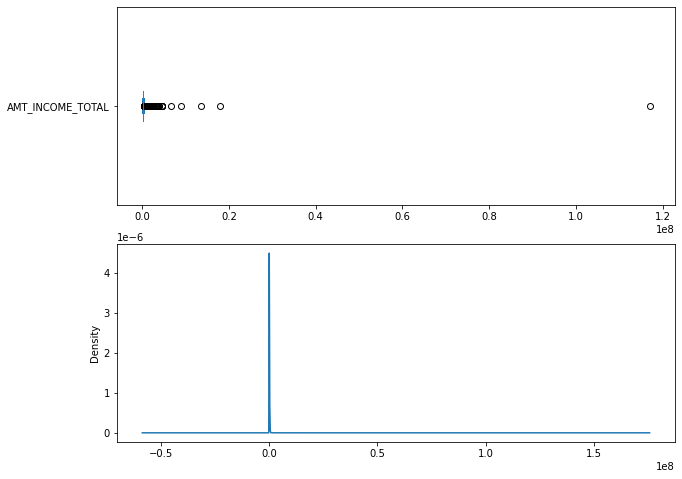

**************** AMT_CREDIT ****************

lower outlier: 0            upper outlier: 6562



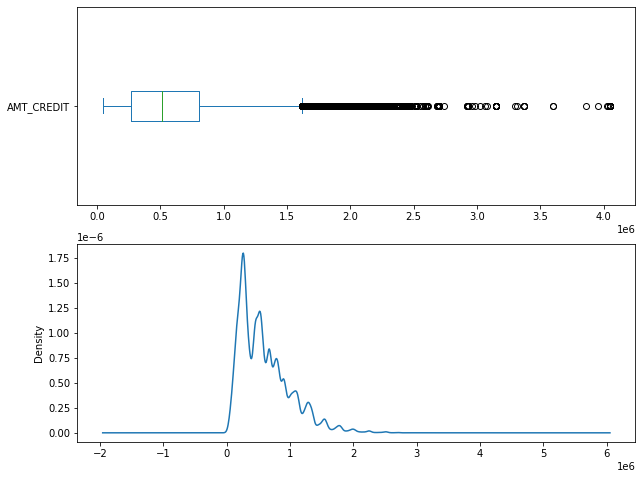

**************** AMT_ANNUITY ****************

lower outlier: 0            upper outlier: 7504



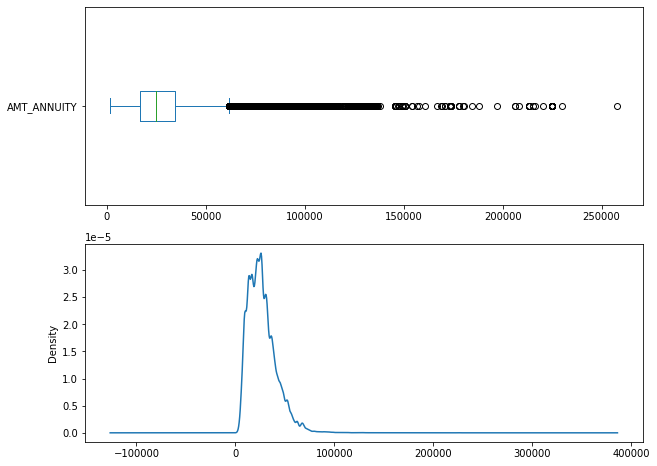

**************** AMT_GOODS_PRICE ****************

lower outlier: 0            upper outlier: 14728



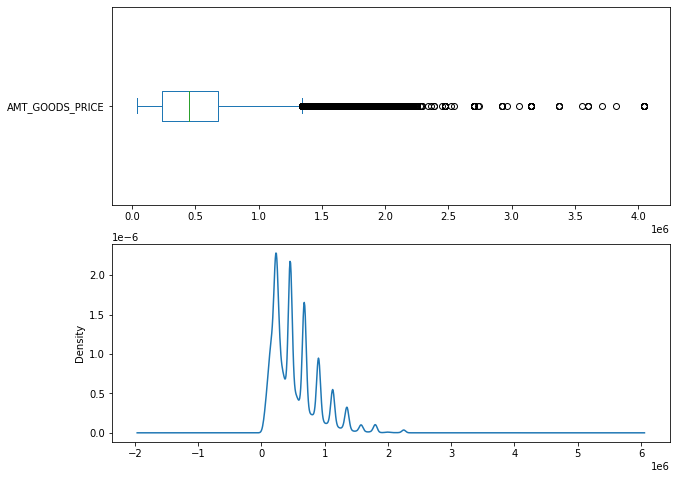

**************** REGION_POPULATION_RELATIVE ****************

lower outlier: 0            upper outlier: 8412



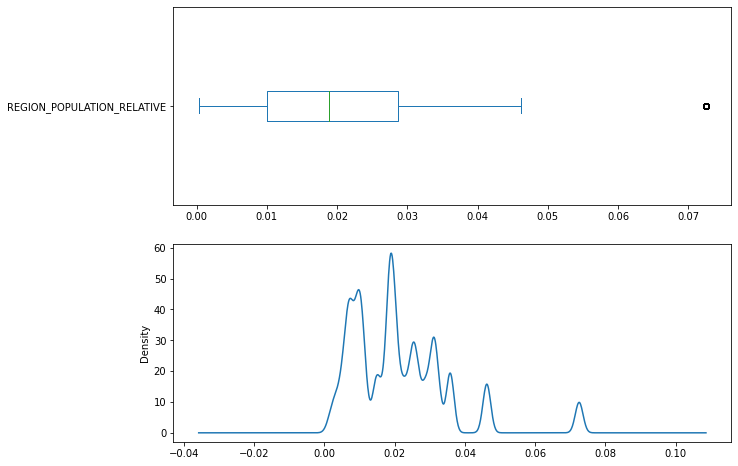

**************** DAYS_BIRTH ****************

lower outlier: 0            upper outlier: 0



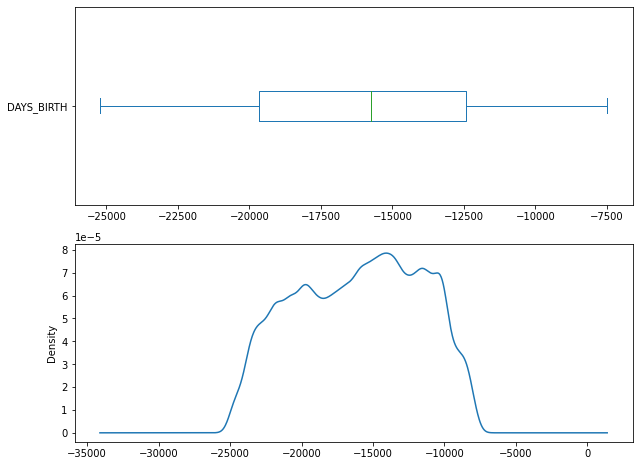

**************** DAYS_EMPLOYED ****************

lower outlier: 16842            upper outlier: 55374



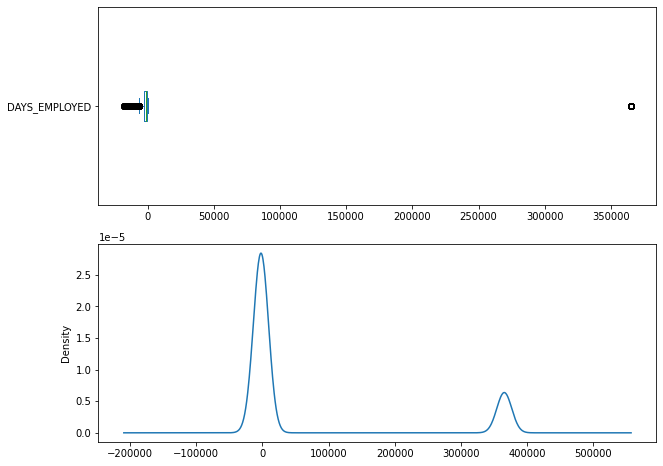

**************** DAYS_REGISTRATION ****************

lower outlier: 659            upper outlier: 0



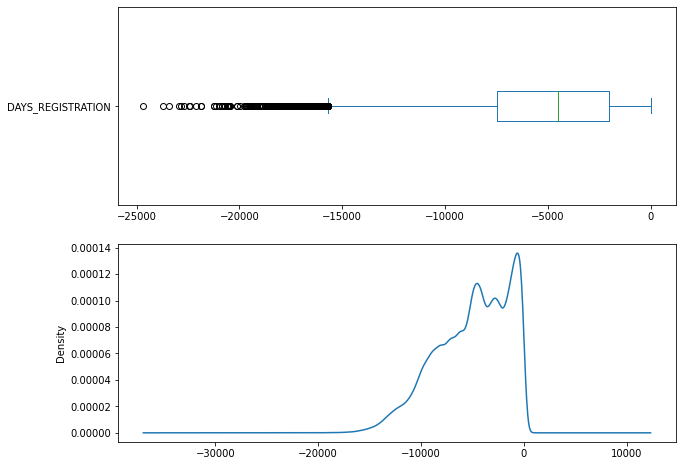

**************** DAYS_ID_PUBLISH ****************

lower outlier: 0            upper outlier: 0



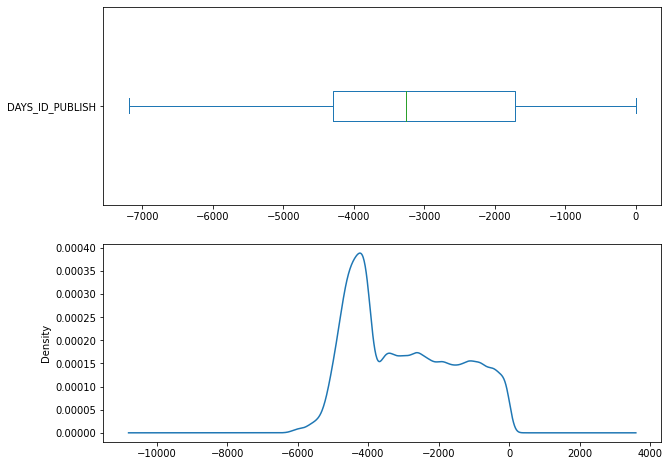

**************** OWN_CAR_AGE ****************

lower outlier: 0            upper outlier: 4932



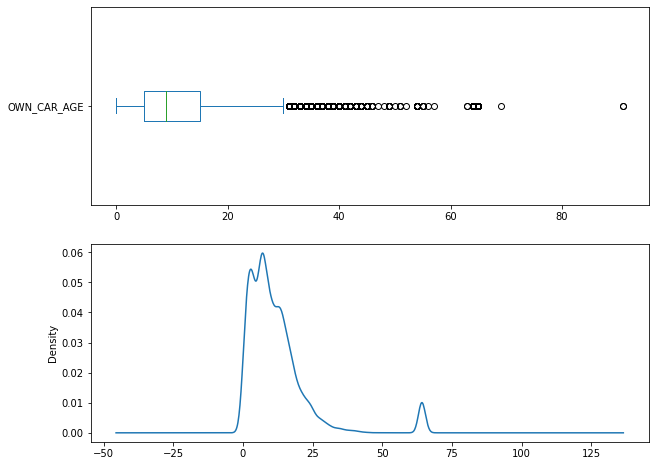

**************** FLAG_MOBIL ****************

lower outlier: 1            upper outlier: 0



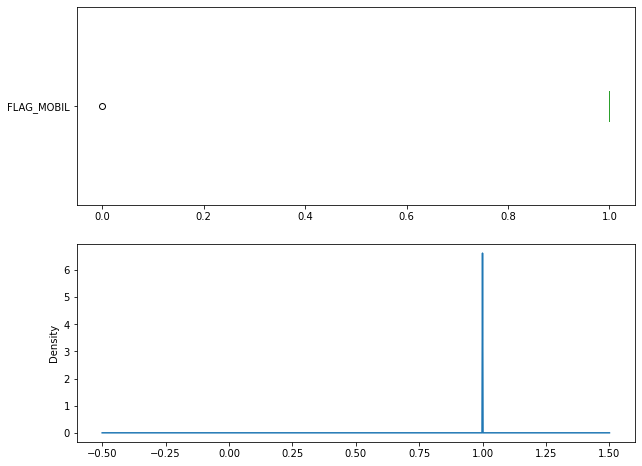

**************** FLAG_EMP_PHONE ****************

lower outlier: 55386            upper outlier: 0



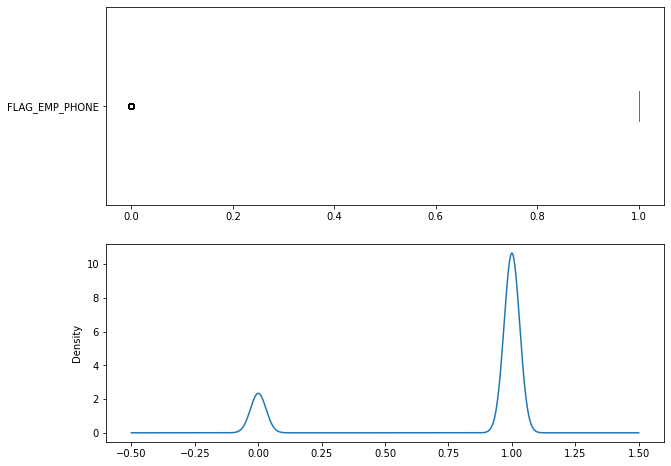

**************** FLAG_WORK_PHONE ****************

lower outlier: 0            upper outlier: 61304



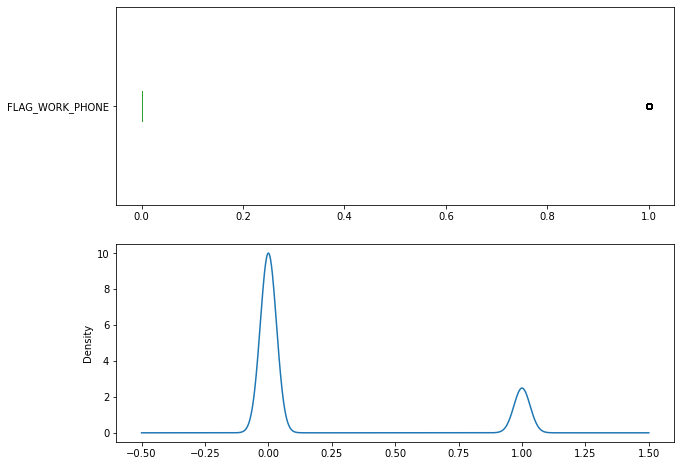

**************** FLAG_CONT_MOBILE ****************

lower outlier: 574            upper outlier: 0



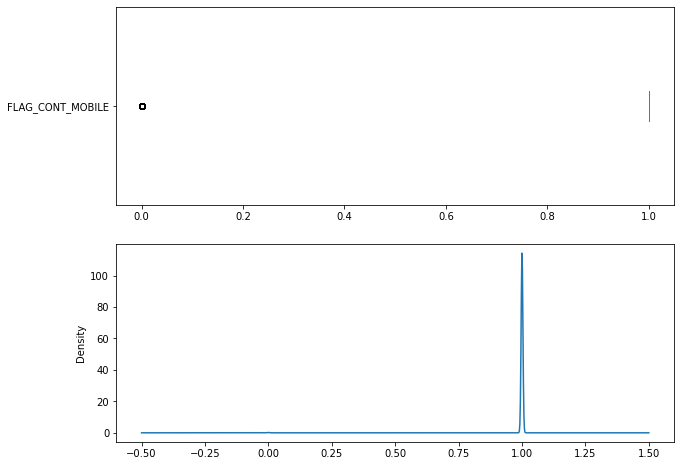

**************** FLAG_PHONE ****************

lower outlier: 0            upper outlier: 0



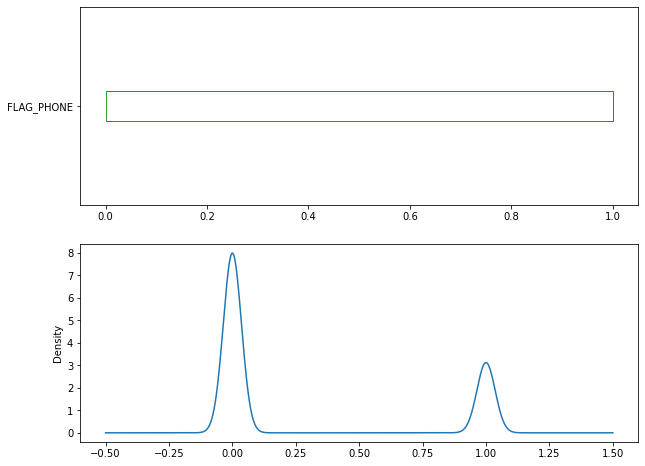

**************** FLAG_EMAIL ****************

lower outlier: 0            upper outlier: 17442



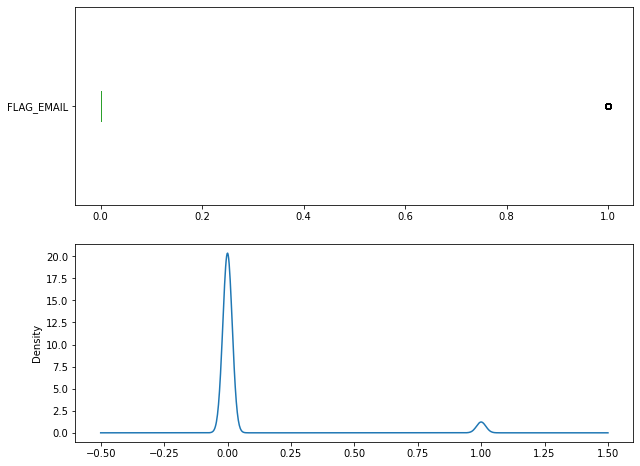

**************** CNT_FAM_MEMBERS ****************

lower outlier: 0            upper outlier: 4007



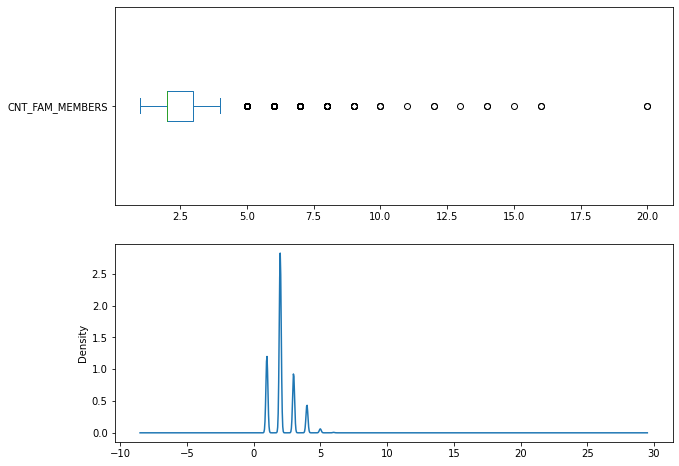

**************** REGION_RATING_CLIENT ****************

lower outlier: 32197            upper outlier: 48329



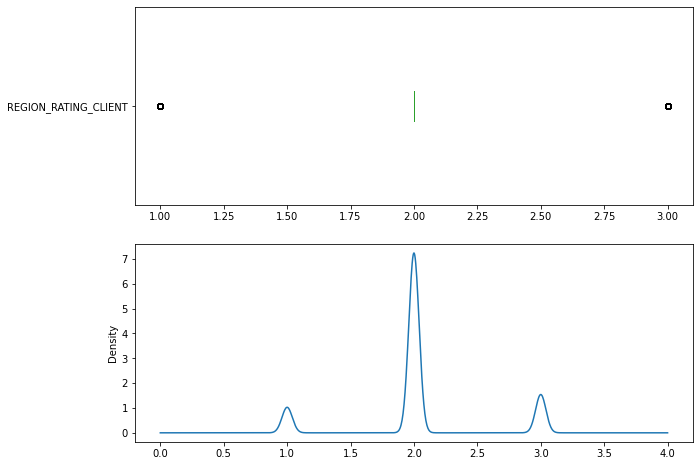

**************** REGION_RATING_CLIENT_W_CITY ****************

lower outlier: 34167            upper outlier: 43859



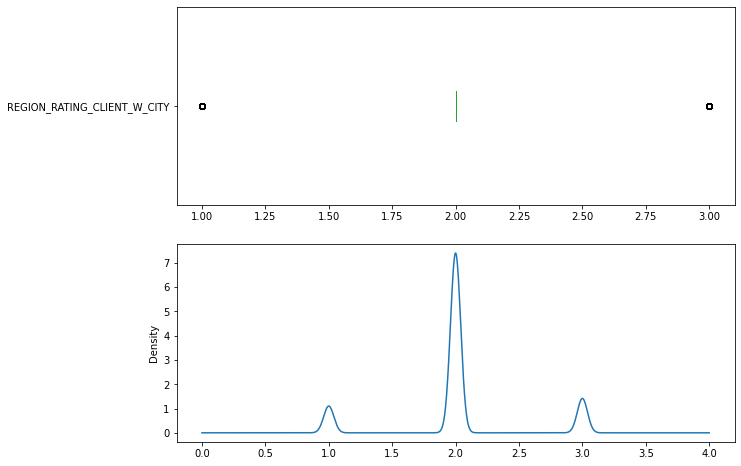

**************** HOUR_APPR_PROCESS_START ****************

lower outlier: 1661            upper outlier: 596



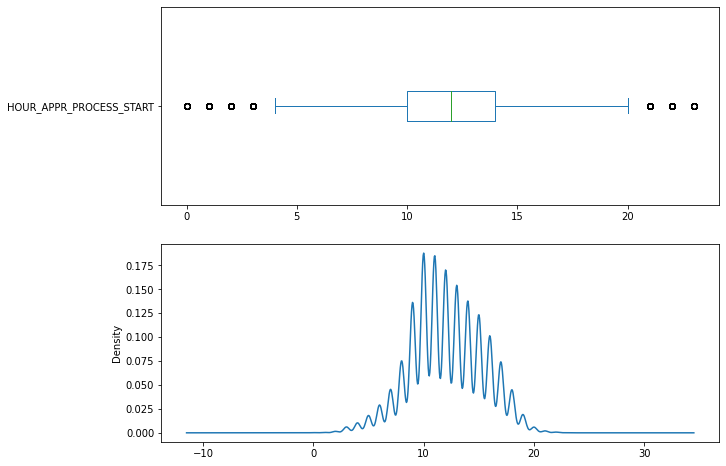

**************** REG_REGION_NOT_LIVE_REGION ****************

lower outlier: 0            upper outlier: 4657



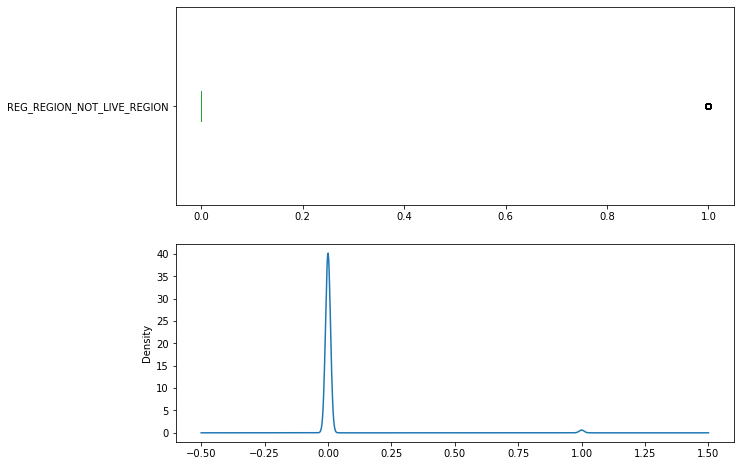

**************** REG_REGION_NOT_WORK_REGION ****************

lower outlier: 0            upper outlier: 15612



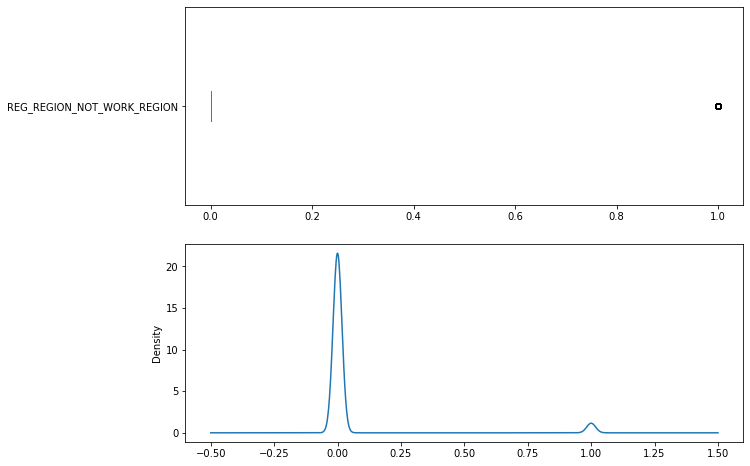

**************** LIVE_REGION_NOT_WORK_REGION ****************

lower outlier: 0            upper outlier: 12503



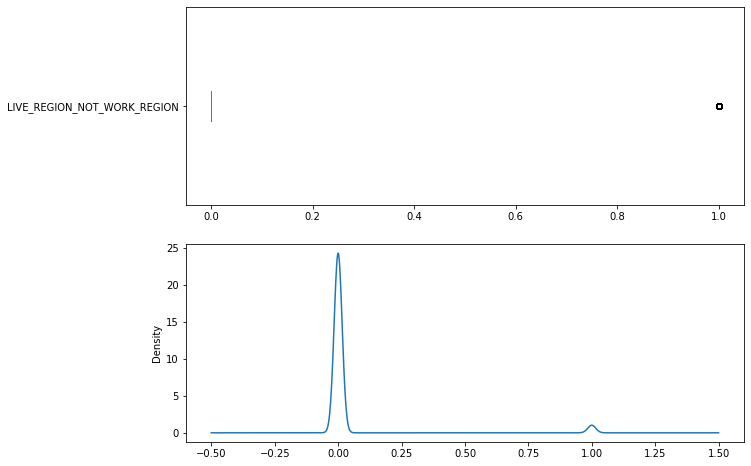

**************** REG_CITY_NOT_LIVE_CITY ****************

lower outlier: 0            upper outlier: 24039



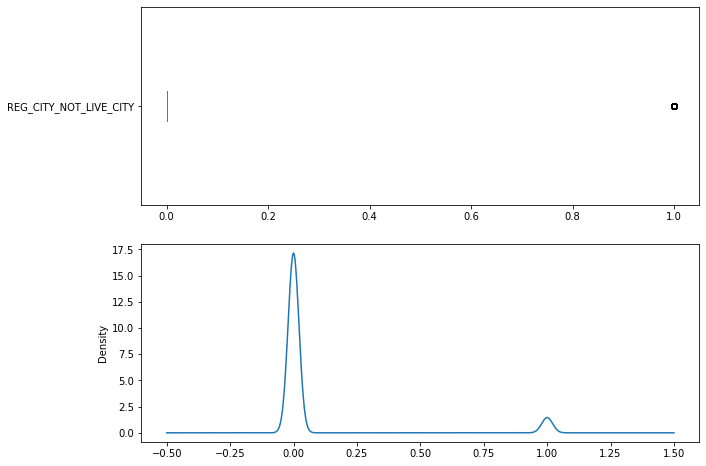

**************** REG_CITY_NOT_WORK_CITY ****************

lower outlier: 0            upper outlier: 70867



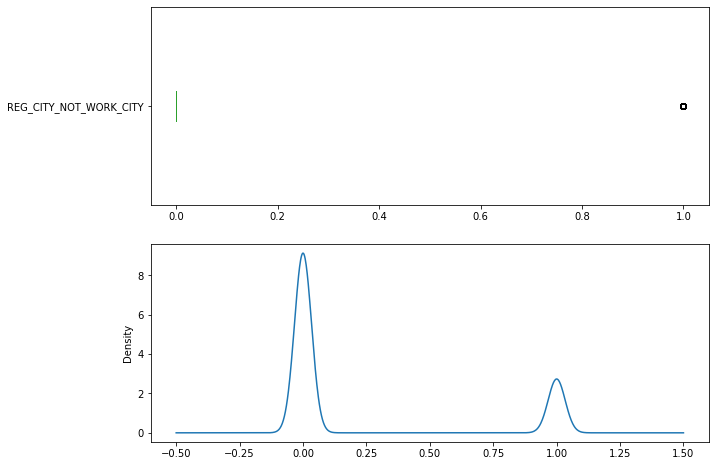

**************** LIVE_CITY_NOT_WORK_CITY ****************

lower outlier: 0            upper outlier: 55215



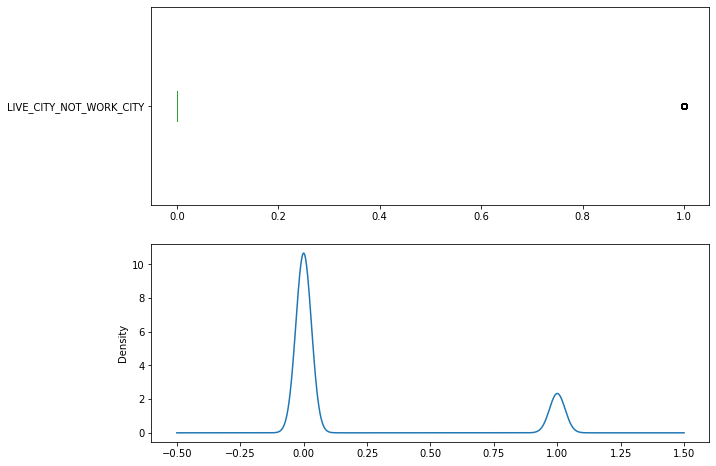

**************** EXT_SOURCE_1 ****************

lower outlier: 0            upper outlier: 0



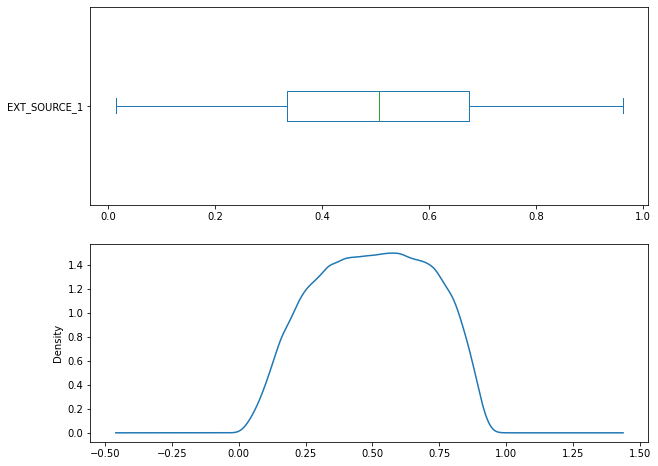

**************** EXT_SOURCE_2 ****************

lower outlier: 0            upper outlier: 0



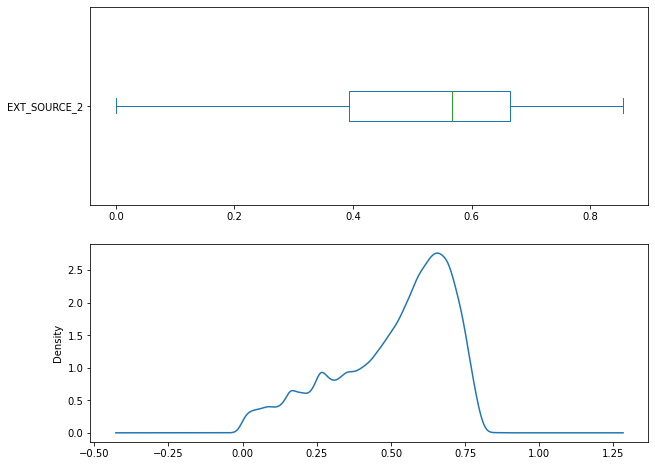

**************** EXT_SOURCE_3 ****************

lower outlier: 0            upper outlier: 0



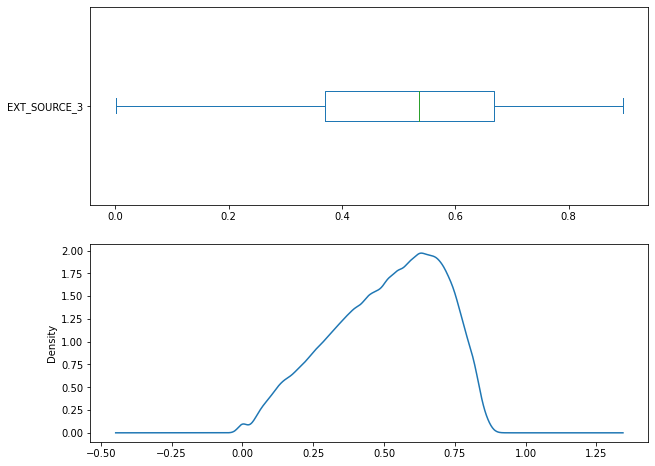

**************** APARTMENTS_AVG ****************

lower outlier: 0            upper outlier: 10655



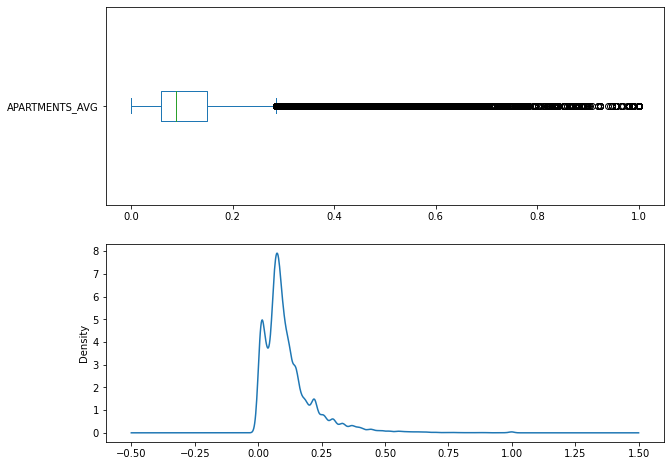

**************** BASEMENTAREA_AVG ****************

lower outlier: 0            upper outlier: 7190



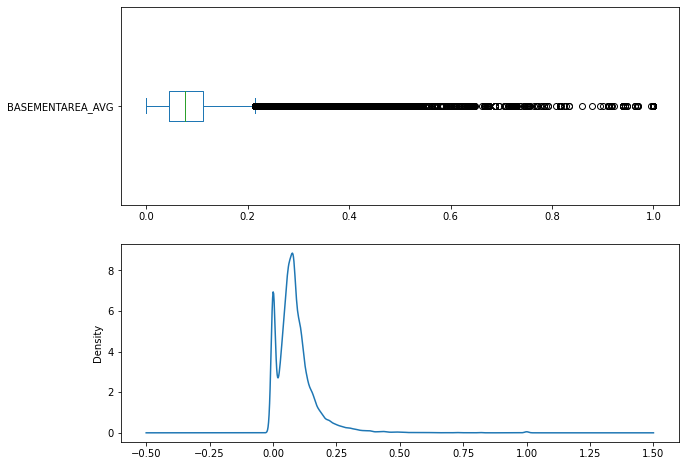

**************** YEARS_BEGINEXPLUATATION_AVG ****************

lower outlier: 4784            upper outlier: 0



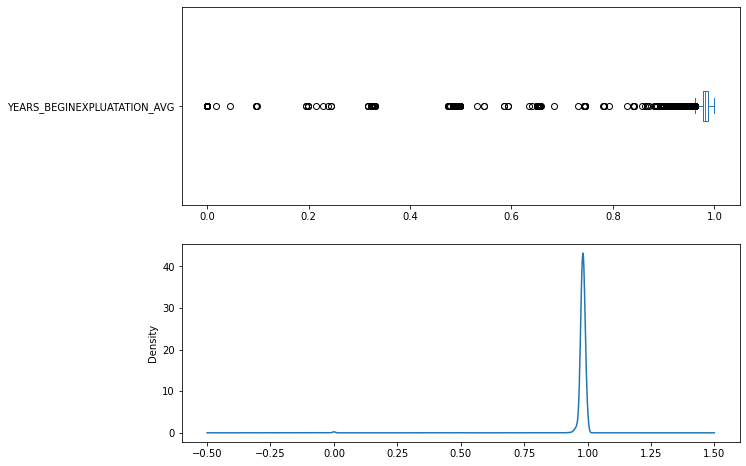

**************** YEARS_BUILD_AVG ****************

lower outlier: 2154            upper outlier: 0



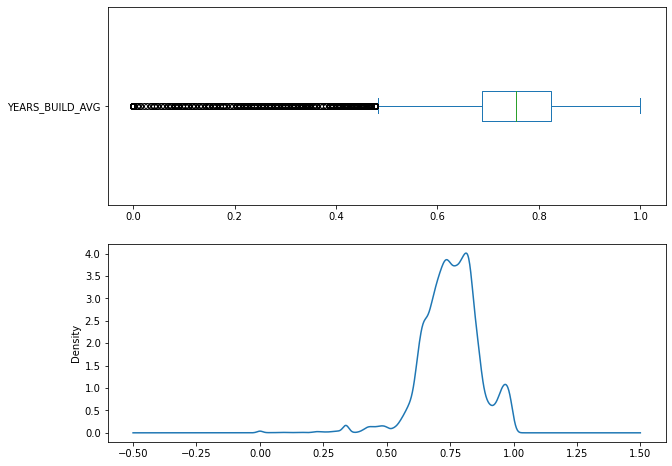

**************** COMMONAREA_AVG ****************

lower outlier: 0            upper outlier: 7942



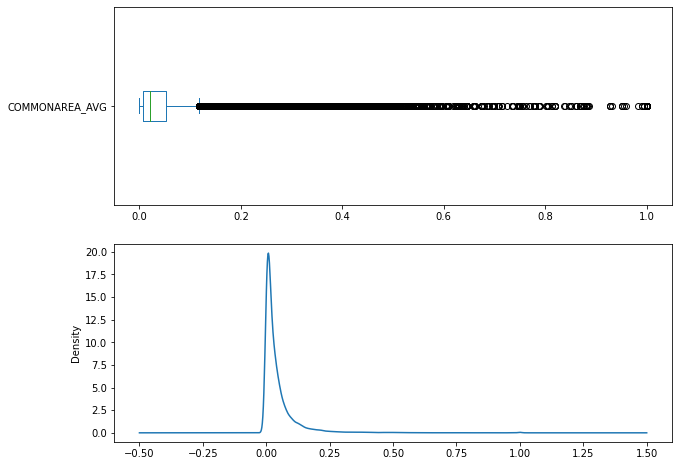

**************** ELEVATORS_AVG ****************

lower outlier: 0            upper outlier: 10420



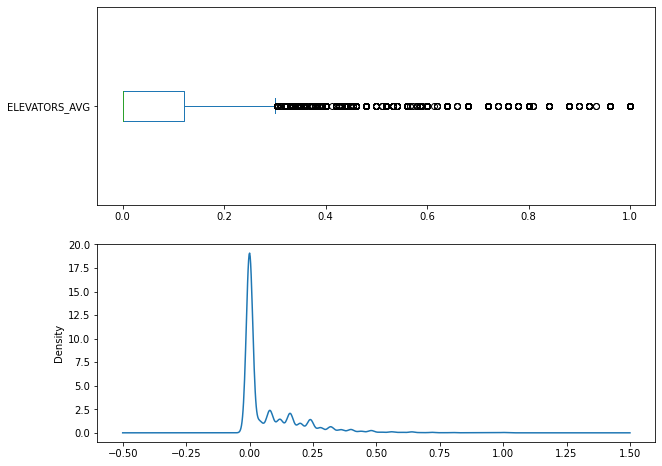

**************** ENTRANCES_AVG ****************

lower outlier: 0            upper outlier: 3882



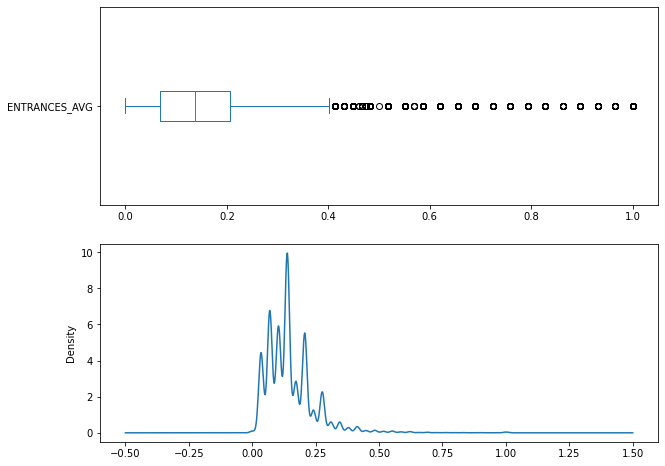

**************** FLOORSMAX_AVG ****************

lower outlier: 0            upper outlier: 5215



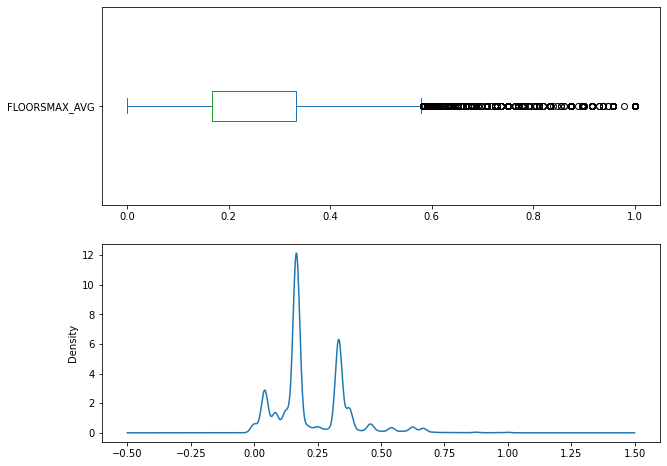

**************** FLOORSMIN_AVG ****************

lower outlier: 0            upper outlier: 343



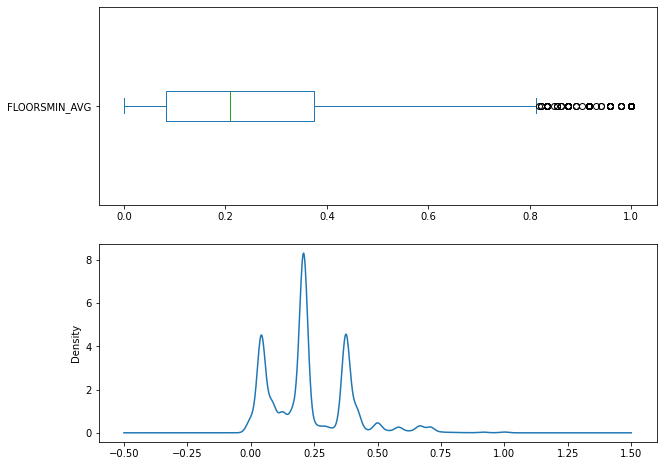

**************** LANDAREA_AVG ****************

lower outlier: 0            upper outlier: 6888



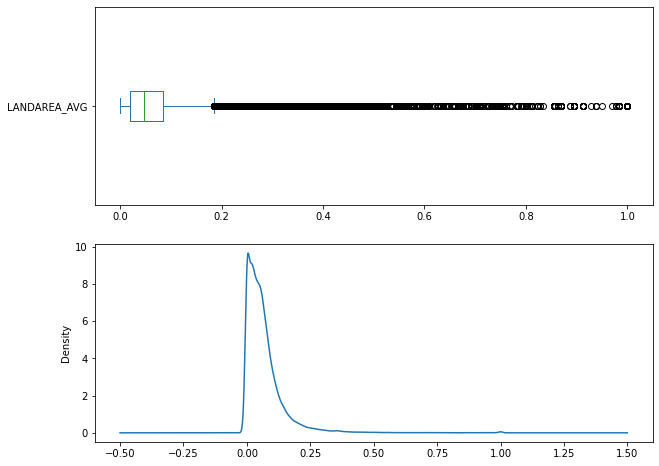

**************** LIVINGAPARTMENTS_AVG ****************

lower outlier: 0            upper outlier: 7881



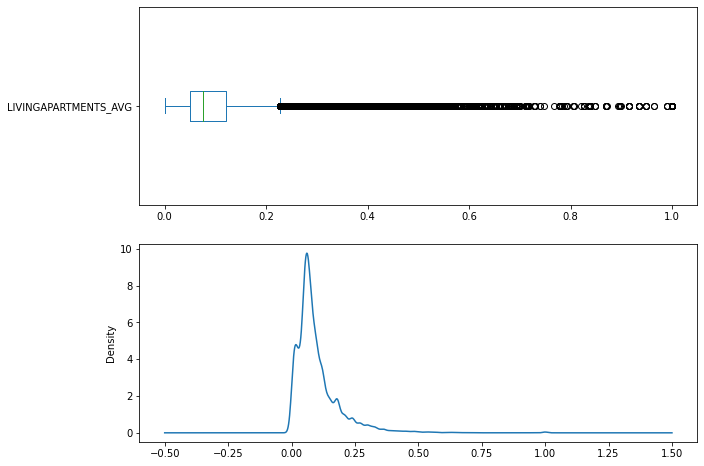

**************** LIVINGAREA_AVG ****************

lower outlier: 0            upper outlier: 12517



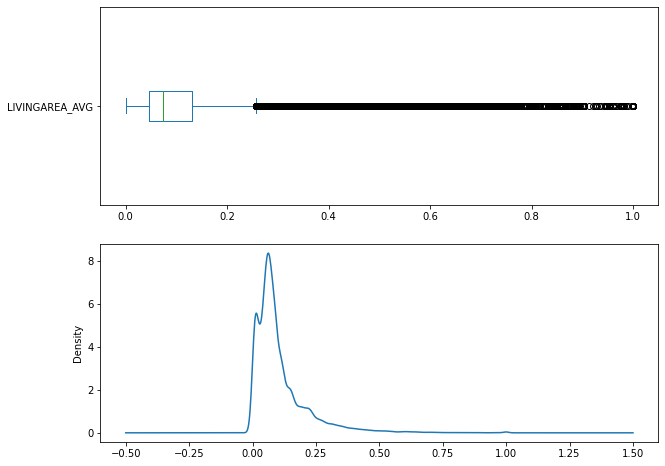

**************** NONLIVINGAPARTMENTS_AVG ****************

lower outlier: 0            upper outlier: 15580



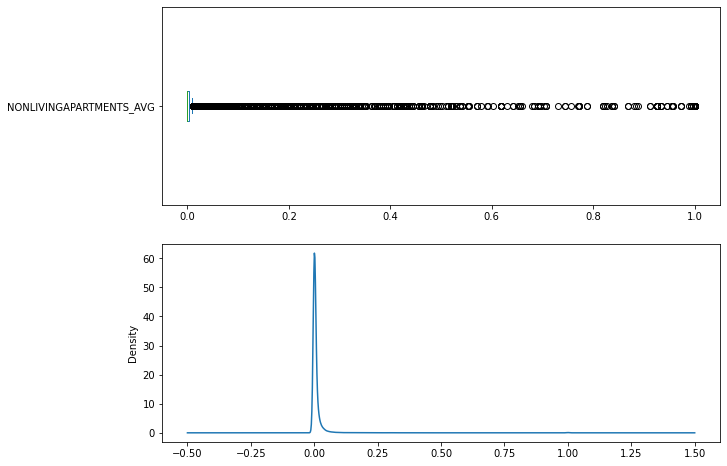

**************** NONLIVINGAREA_AVG ****************

lower outlier: 0            upper outlier: 16546



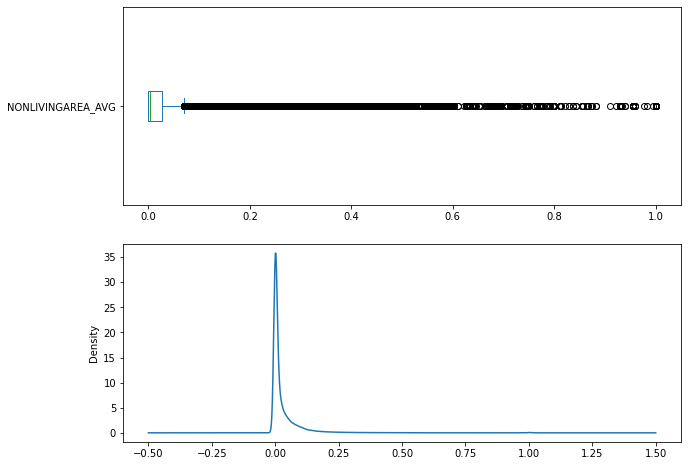

**************** APARTMENTS_MODE ****************

lower outlier: 0            upper outlier: 10338



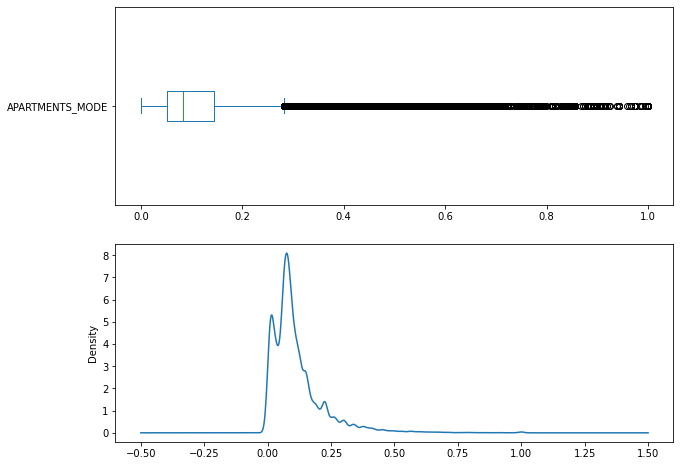

**************** BASEMENTAREA_MODE ****************

lower outlier: 0            upper outlier: 6910



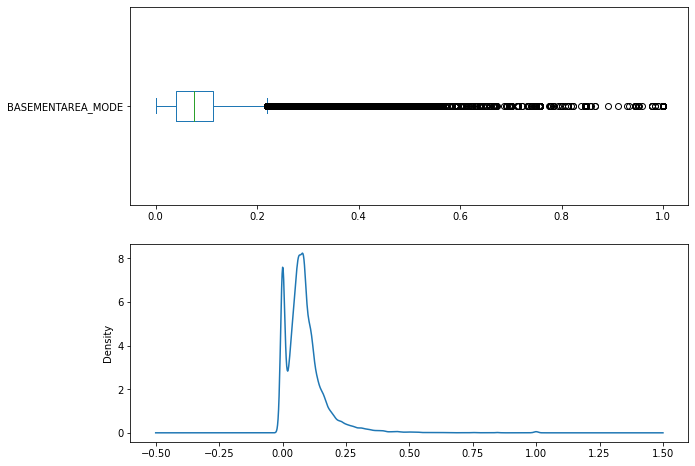

**************** YEARS_BEGINEXPLUATATION_MODE ****************

lower outlier: 5074            upper outlier: 0



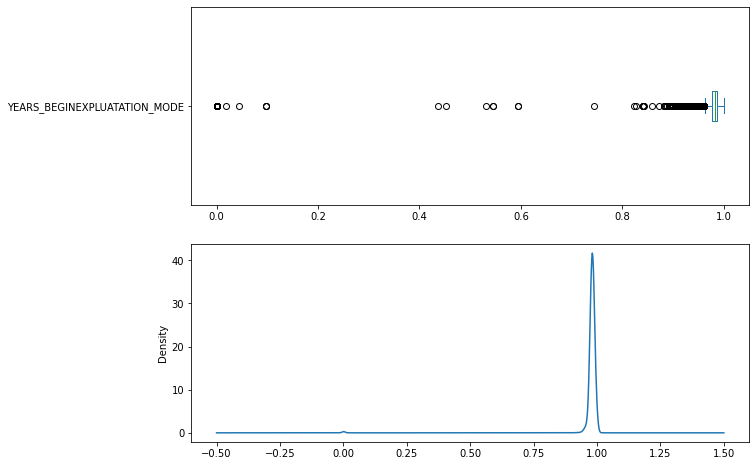

**************** YEARS_BUILD_MODE ****************

lower outlier: 2537            upper outlier: 0



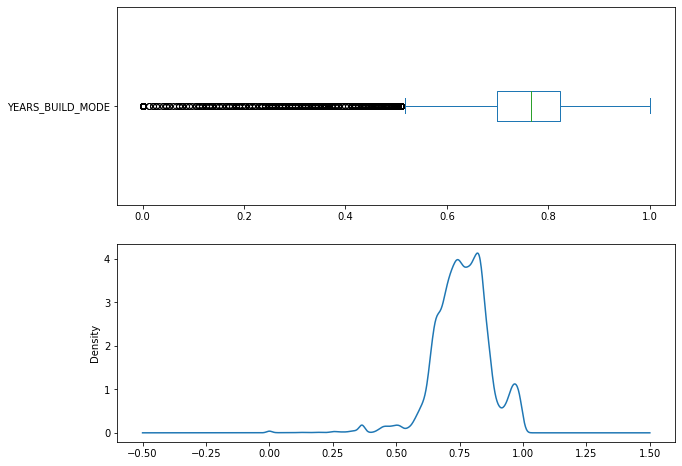

**************** COMMONAREA_MODE ****************

lower outlier: 0            upper outlier: 7938



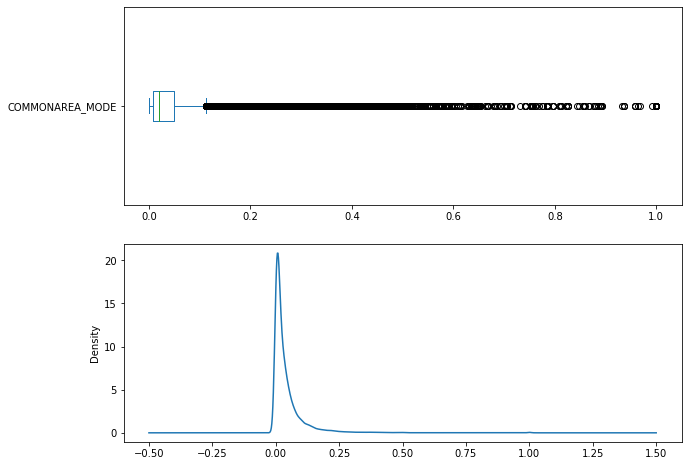

**************** ELEVATORS_MODE ****************

lower outlier: 0            upper outlier: 9732



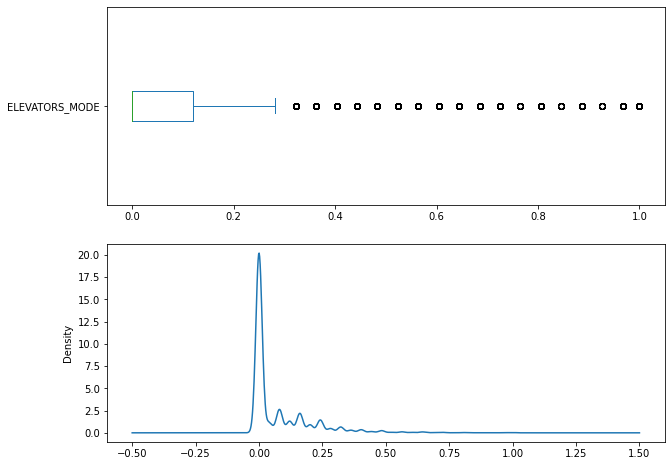

**************** ENTRANCES_MODE ****************

lower outlier: 0            upper outlier: 3840



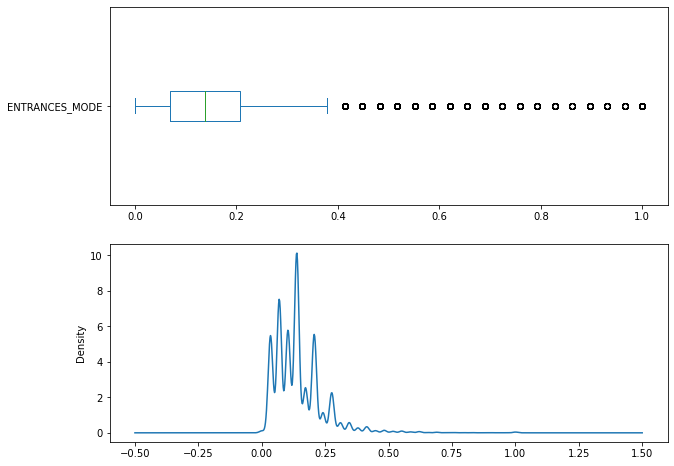

**************** FLOORSMAX_MODE ****************

lower outlier: 0            upper outlier: 5104



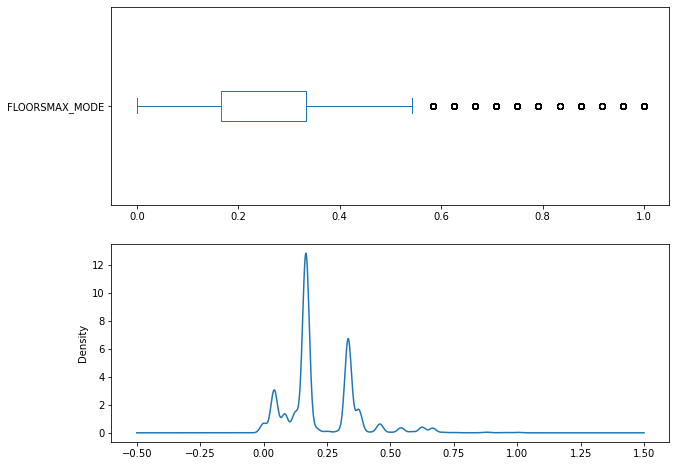

**************** FLOORSMIN_MODE ****************

lower outlier: 0            upper outlier: 320



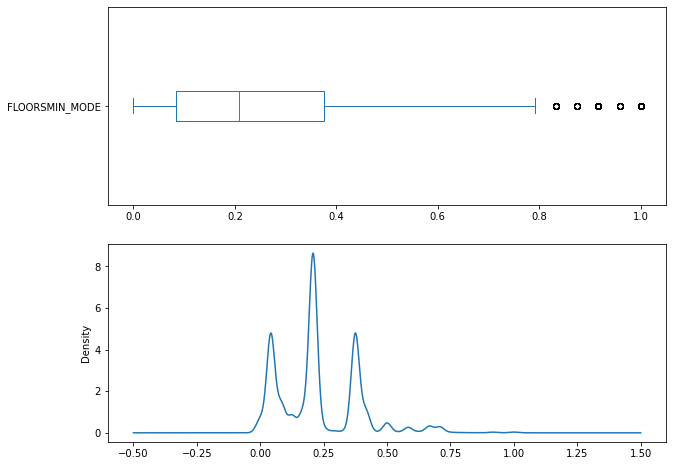

**************** LANDAREA_MODE ****************

lower outlier: 0            upper outlier: 7033



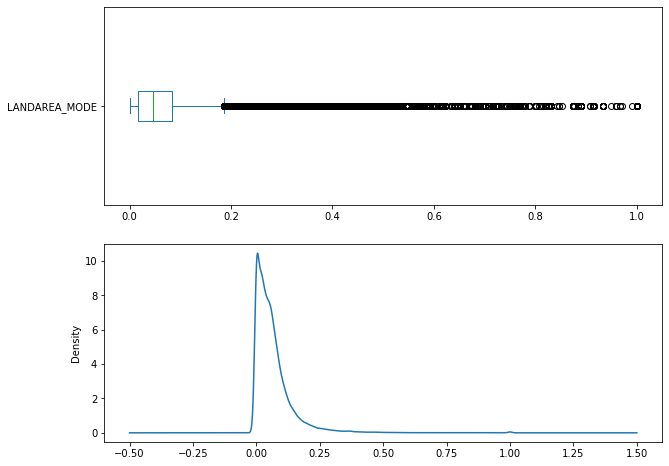

**************** LIVINGAPARTMENTS_MODE ****************

lower outlier: 0            upper outlier: 7469



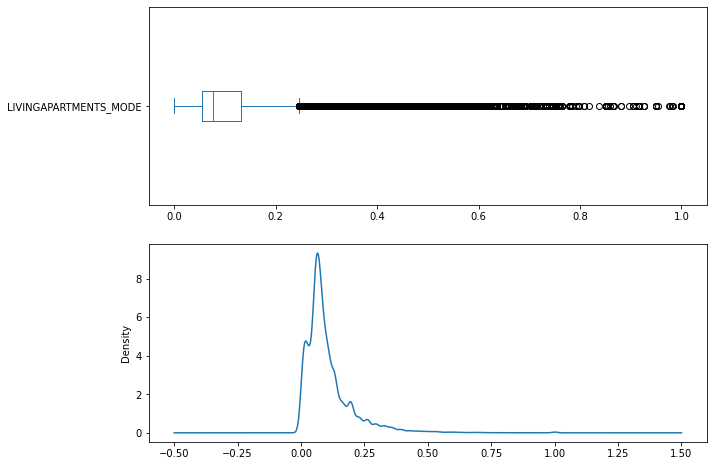

**************** LIVINGAREA_MODE ****************

lower outlier: 0            upper outlier: 13105



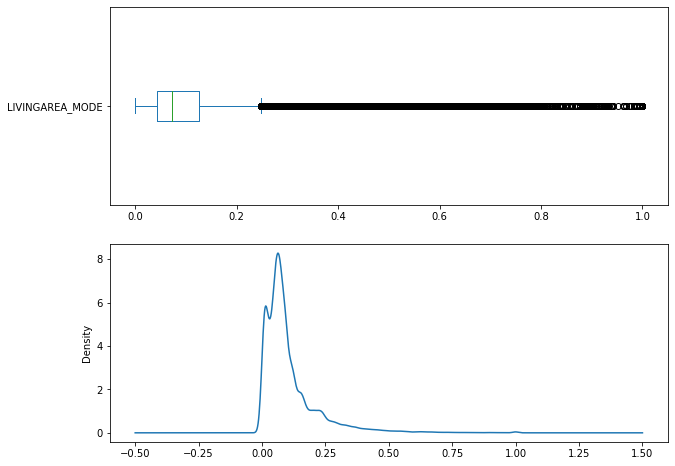

**************** NONLIVINGAPARTMENTS_MODE ****************

lower outlier: 0            upper outlier: 14224



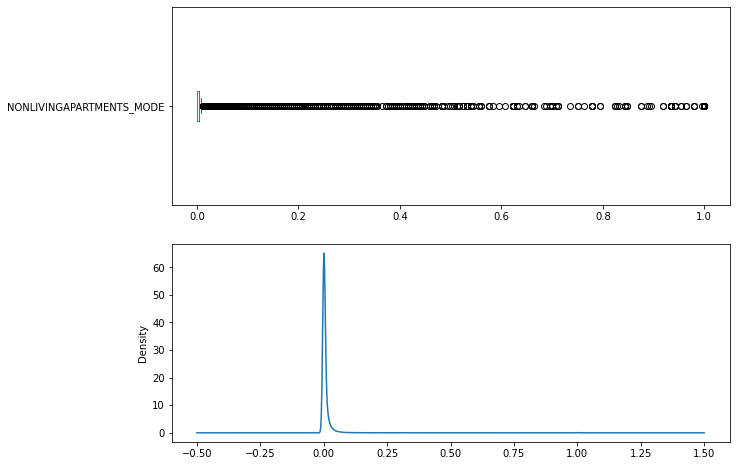

**************** NONLIVINGAREA_MODE ****************

lower outlier: 0            upper outlier: 18817



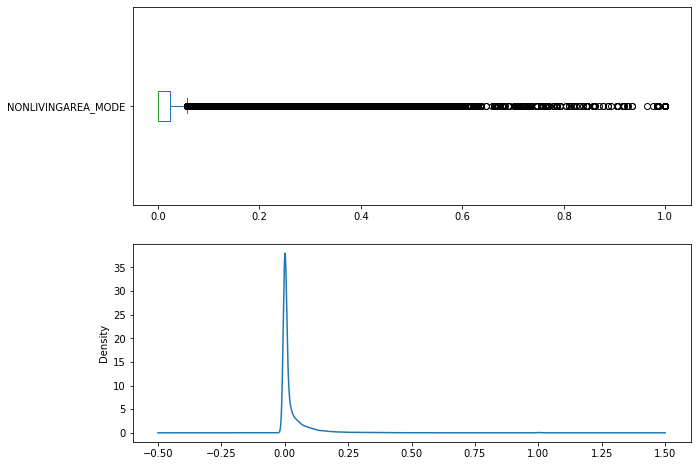

**************** APARTMENTS_MEDI ****************

lower outlier: 0            upper outlier: 10728



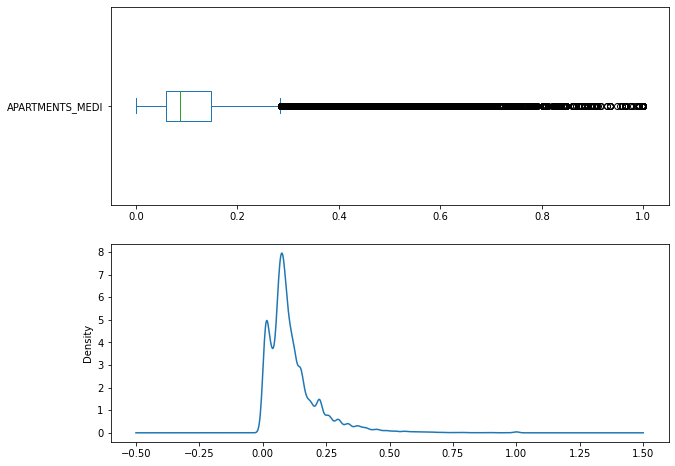

**************** BASEMENTAREA_MEDI ****************

lower outlier: 0            upper outlier: 7188



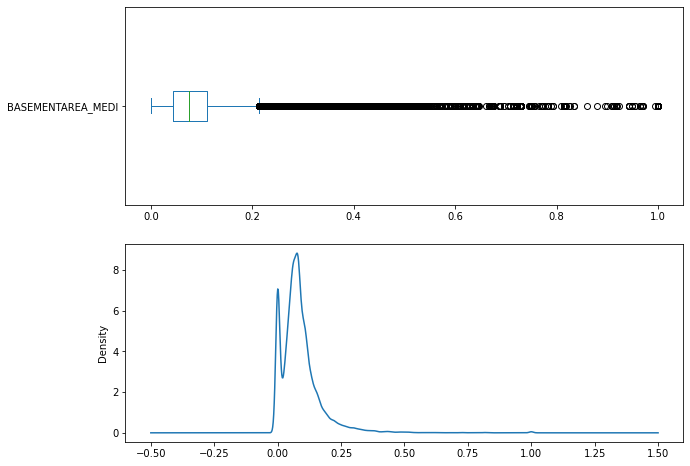

**************** YEARS_BEGINEXPLUATATION_MEDI ****************

lower outlier: 4762            upper outlier: 0



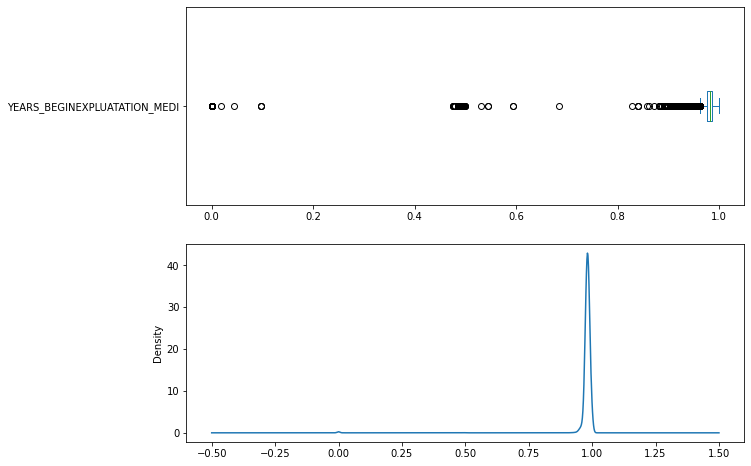

**************** YEARS_BUILD_MEDI ****************

lower outlier: 2274            upper outlier: 0



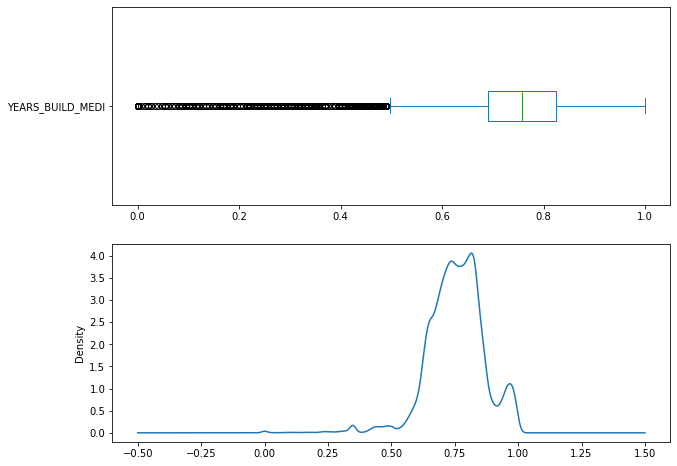

**************** COMMONAREA_MEDI ****************

lower outlier: 0            upper outlier: 8004



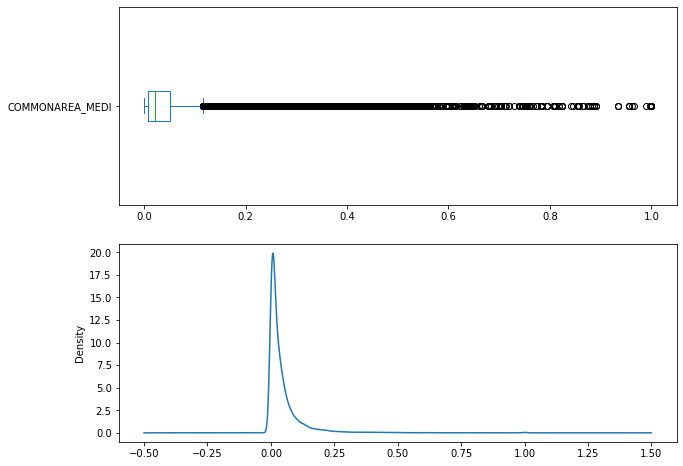

**************** ELEVATORS_MEDI ****************

lower outlier: 0            upper outlier: 10383



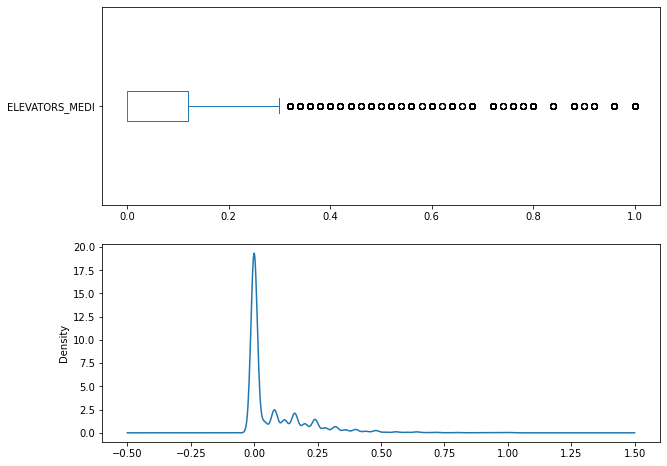

**************** ENTRANCES_MEDI ****************

lower outlier: 0            upper outlier: 3893



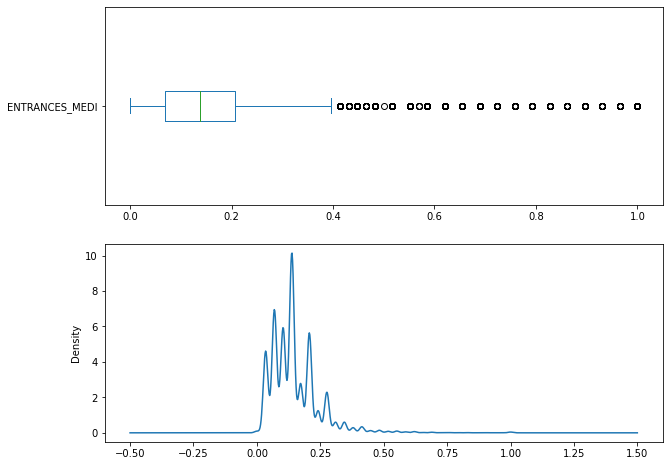

**************** FLOORSMAX_MEDI ****************

lower outlier: 0            upper outlier: 5360



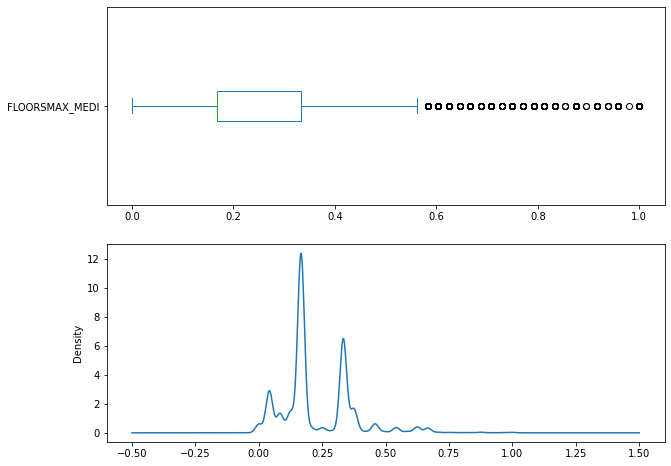

**************** FLOORSMIN_MEDI ****************

lower outlier: 0            upper outlier: 344



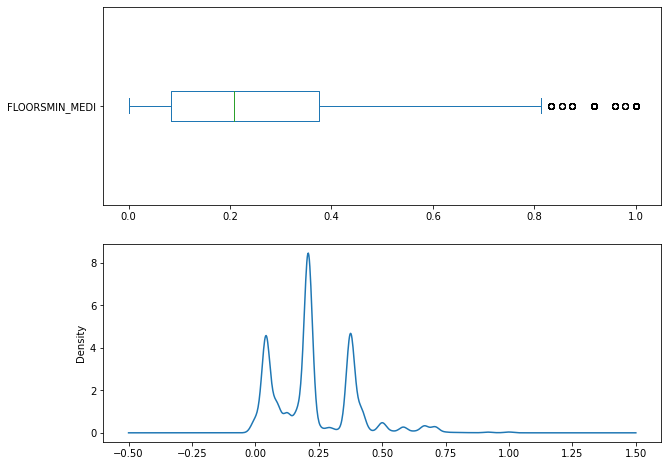

**************** LANDAREA_MEDI ****************

lower outlier: 0            upper outlier: 6873



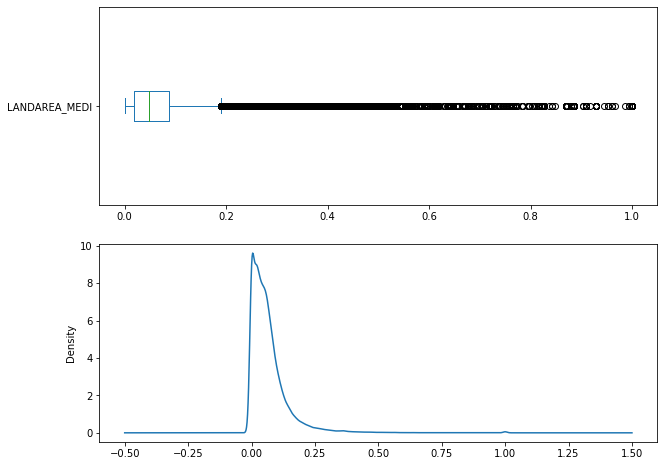

**************** LIVINGAPARTMENTS_MEDI ****************

lower outlier: 0            upper outlier: 7927



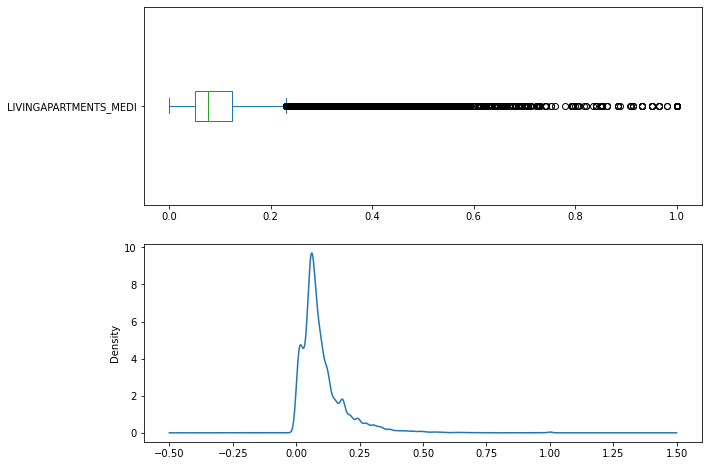

**************** LIVINGAREA_MEDI ****************

lower outlier: 0            upper outlier: 12896



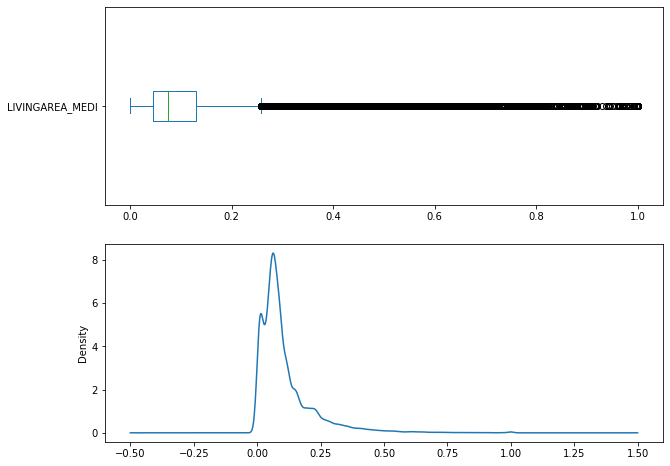

**************** NONLIVINGAPARTMENTS_MEDI ****************

lower outlier: 0            upper outlier: 15215



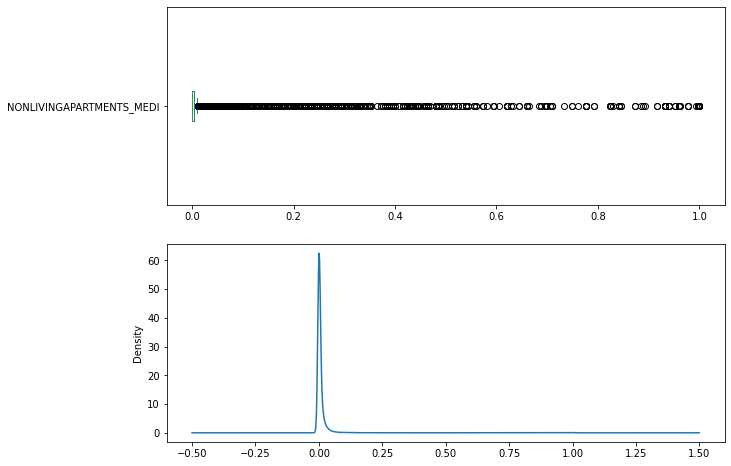

**************** NONLIVINGAREA_MEDI ****************

lower outlier: 0            upper outlier: 17254



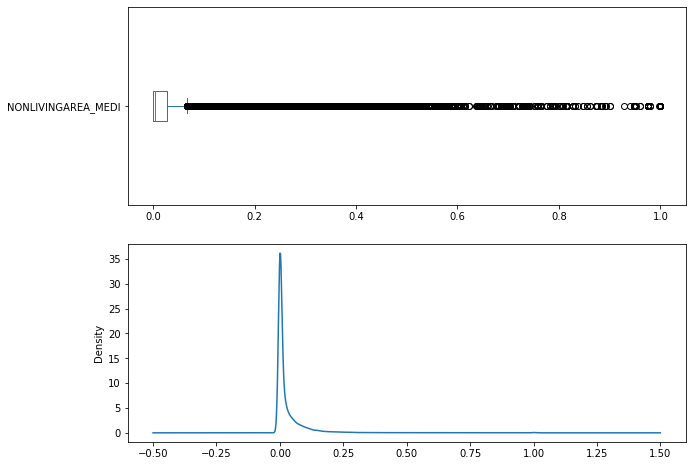

**************** TOTALAREA_MODE ****************

lower outlier: 0            upper outlier: 12091



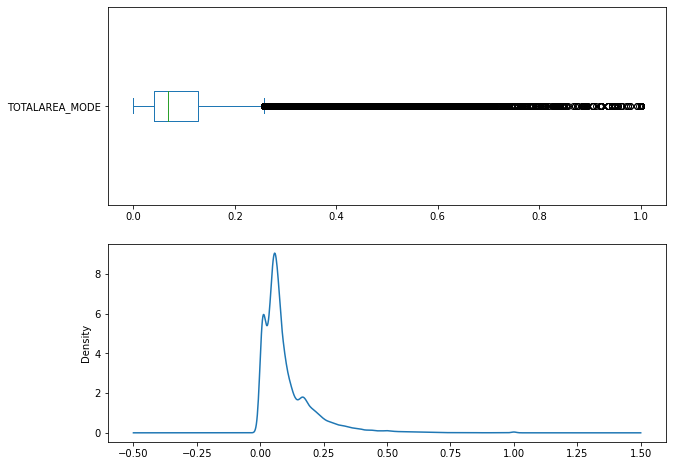

**************** OBS_30_CNT_SOCIAL_CIRCLE ****************

lower outlier: 0            upper outlier: 19969



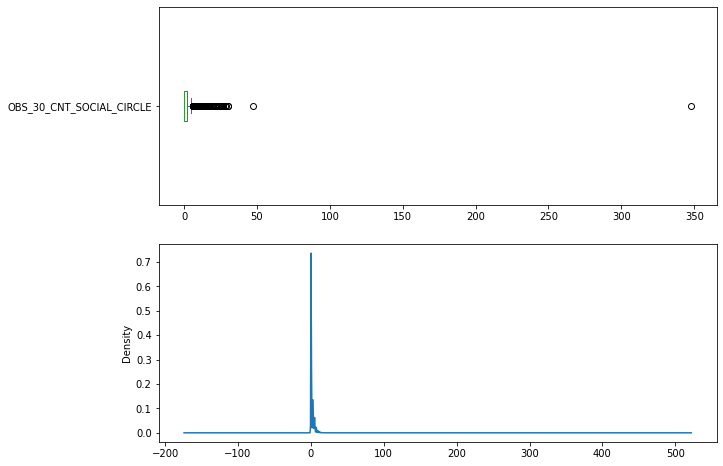

**************** DEF_30_CNT_SOCIAL_CIRCLE ****************

lower outlier: 0            upper outlier: 35164



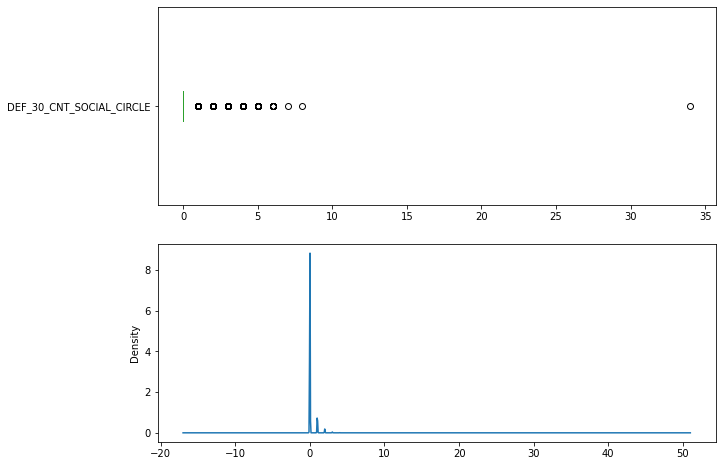

**************** OBS_60_CNT_SOCIAL_CIRCLE ****************

lower outlier: 0            upper outlier: 19562



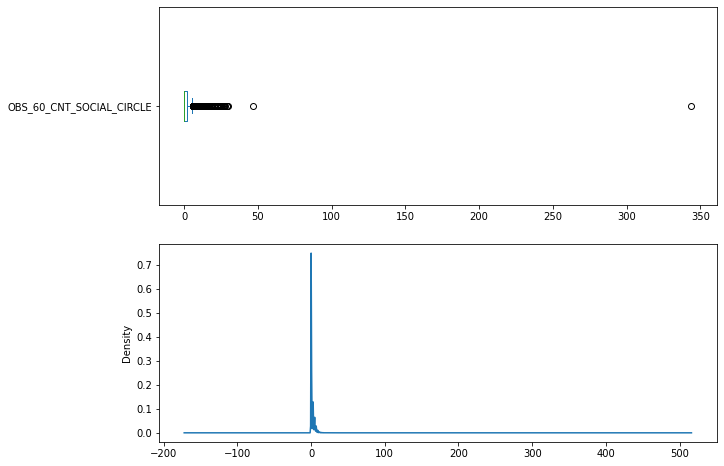

**************** DEF_60_CNT_SOCIAL_CIRCLE ****************

lower outlier: 0            upper outlier: 25767



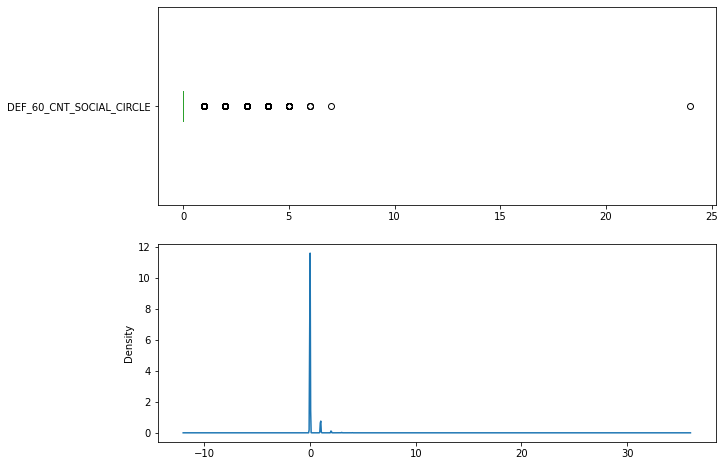

**************** DAYS_LAST_PHONE_CHANGE ****************

lower outlier: 435            upper outlier: 0



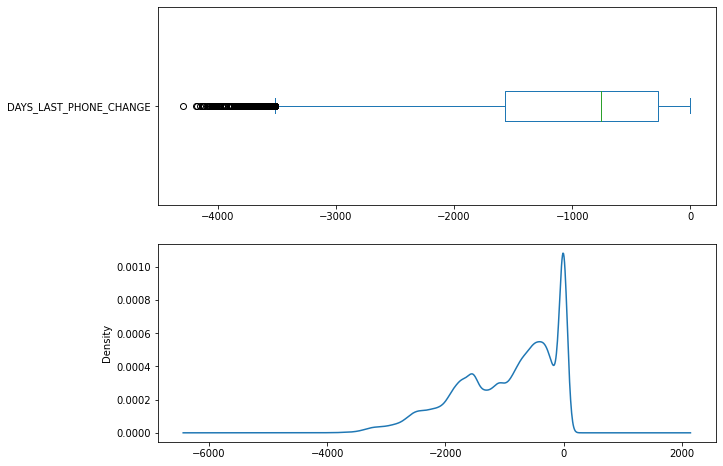

**************** FLAG_DOCUMENT_2 ****************

lower outlier: 0            upper outlier: 13



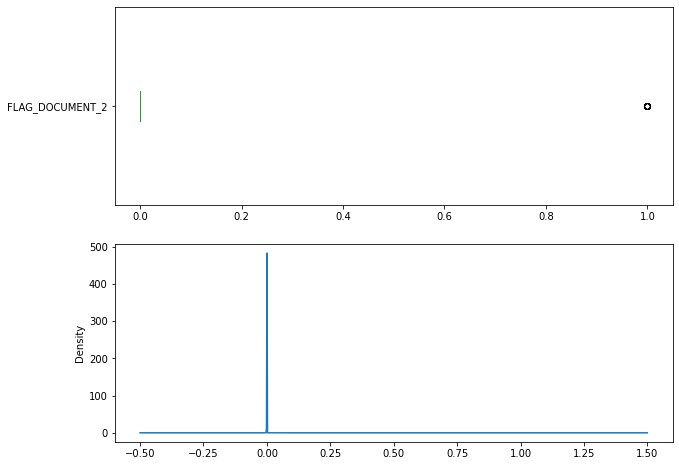

**************** FLAG_DOCUMENT_3 ****************

lower outlier: 0            upper outlier: 0



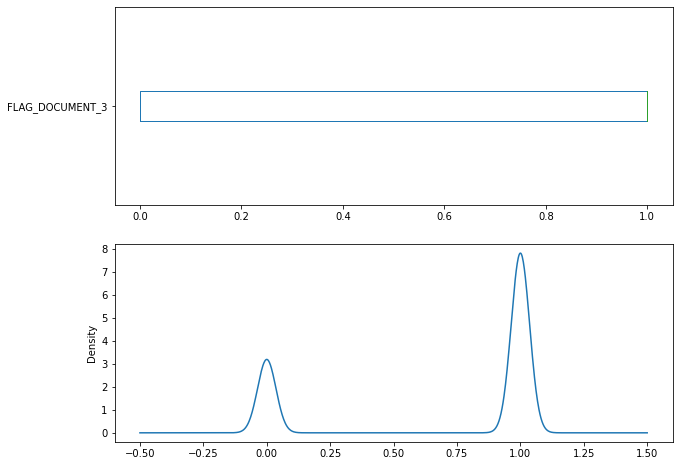

**************** FLAG_DOCUMENT_4 ****************

lower outlier: 0            upper outlier: 25



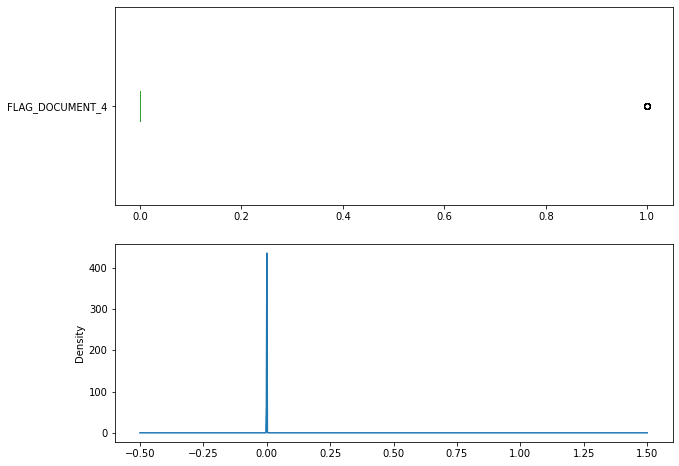

**************** FLAG_DOCUMENT_5 ****************

lower outlier: 0            upper outlier: 4648



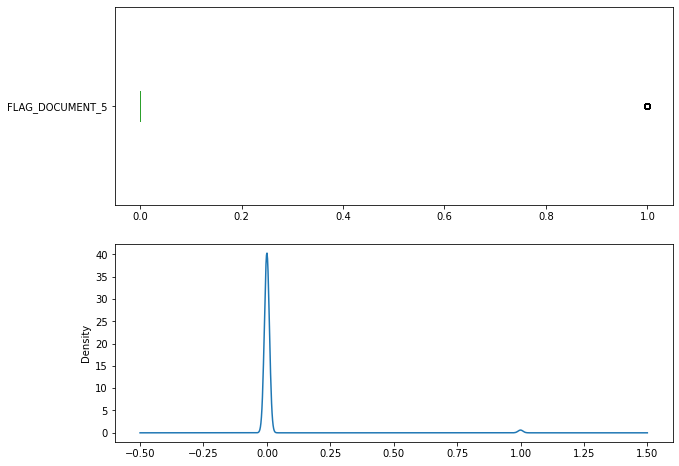

**************** FLAG_DOCUMENT_6 ****************

lower outlier: 0            upper outlier: 27078



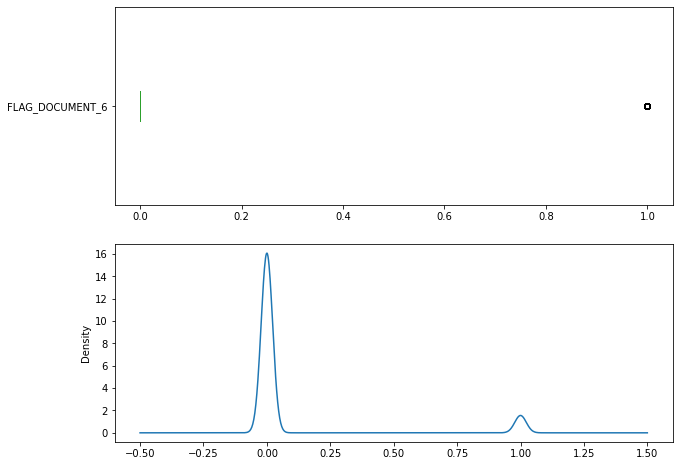

**************** FLAG_DOCUMENT_7 ****************

lower outlier: 0            upper outlier: 59



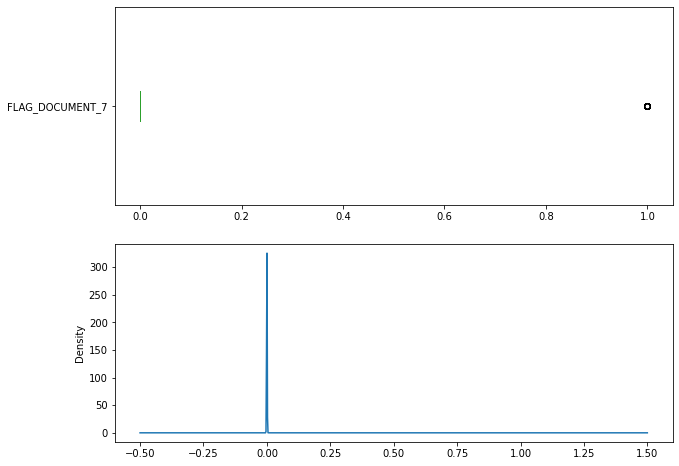

**************** FLAG_DOCUMENT_8 ****************

lower outlier: 0            upper outlier: 25024



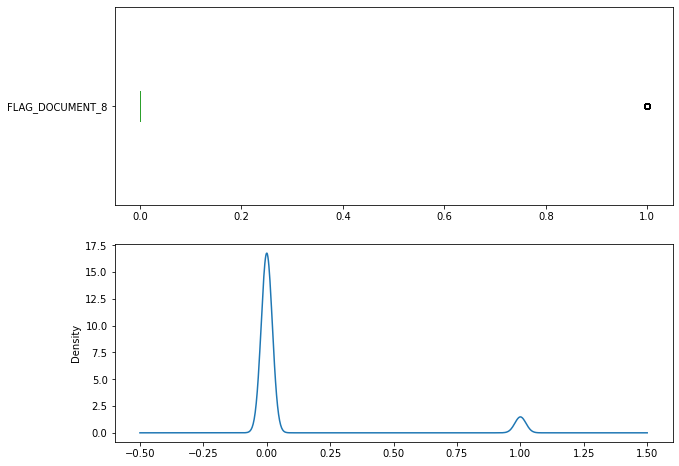

**************** FLAG_DOCUMENT_9 ****************

lower outlier: 0            upper outlier: 1198



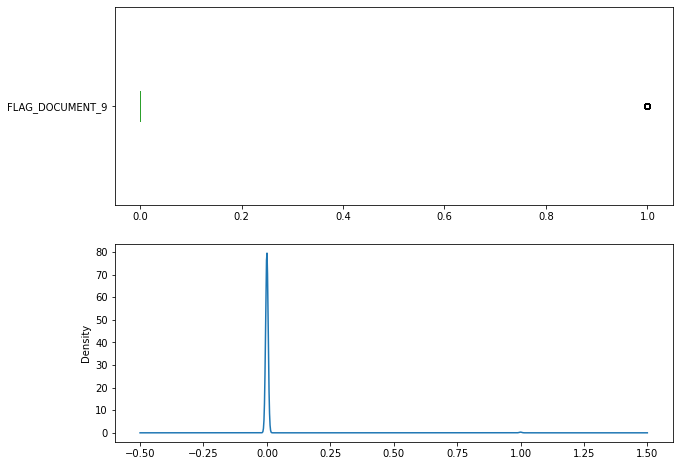

**************** FLAG_DOCUMENT_10 ****************

lower outlier: 0            upper outlier: 7



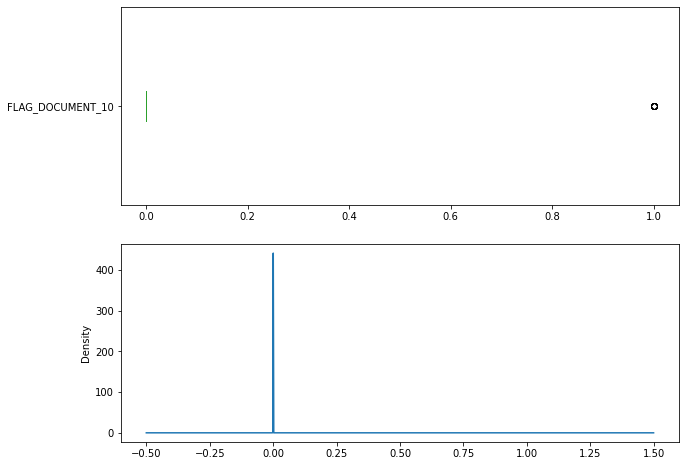

**************** FLAG_DOCUMENT_11 ****************

lower outlier: 0            upper outlier: 1203



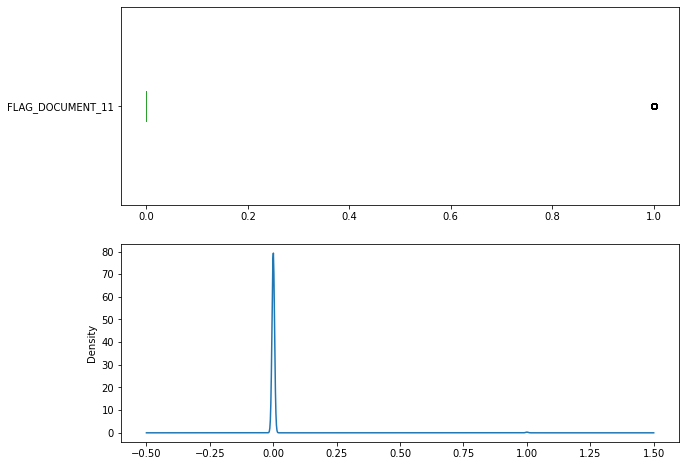

**************** FLAG_DOCUMENT_12 ****************

lower outlier: 0            upper outlier: 2



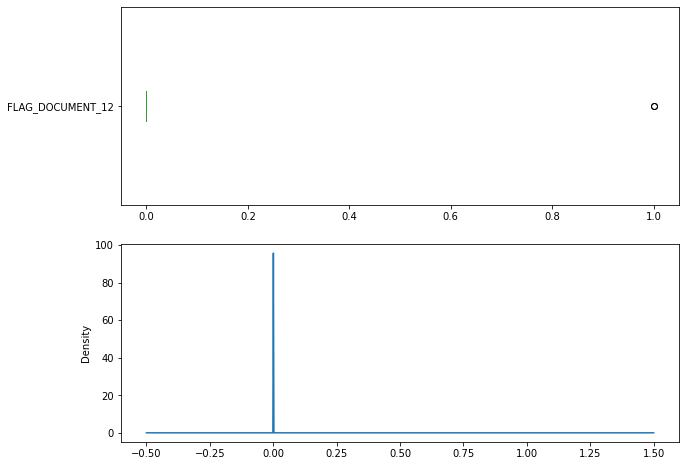

**************** FLAG_DOCUMENT_13 ****************

lower outlier: 0            upper outlier: 1084



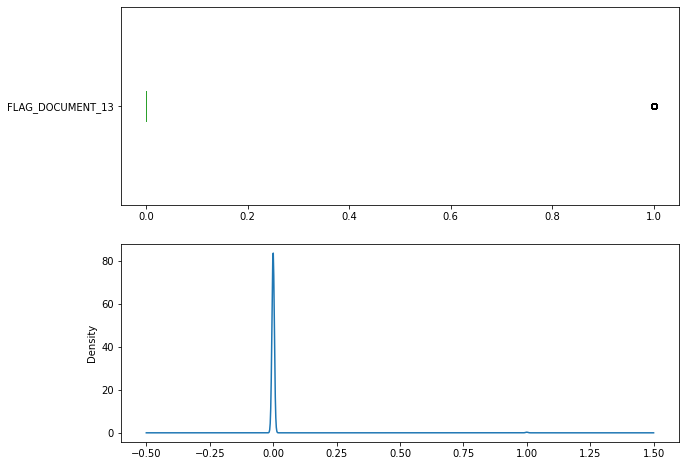

**************** FLAG_DOCUMENT_14 ****************

lower outlier: 0            upper outlier: 903



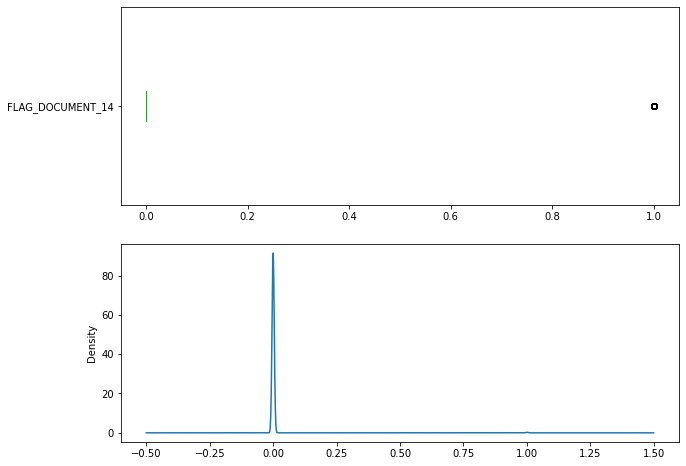

**************** FLAG_DOCUMENT_15 ****************

lower outlier: 0            upper outlier: 372



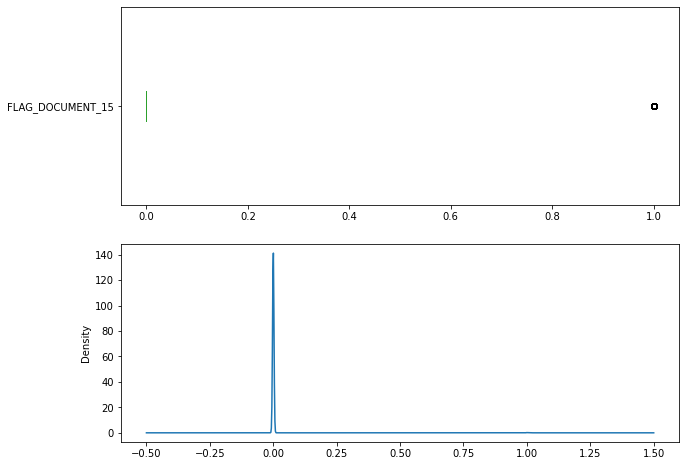

**************** FLAG_DOCUMENT_16 ****************

lower outlier: 0            upper outlier: 3053



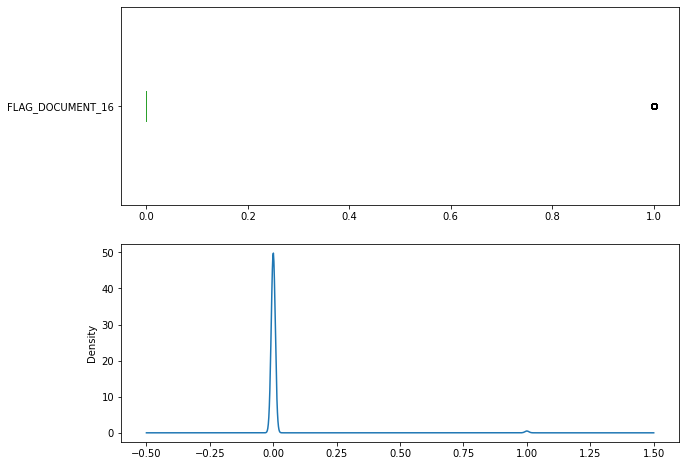

**************** FLAG_DOCUMENT_17 ****************

lower outlier: 0            upper outlier: 82



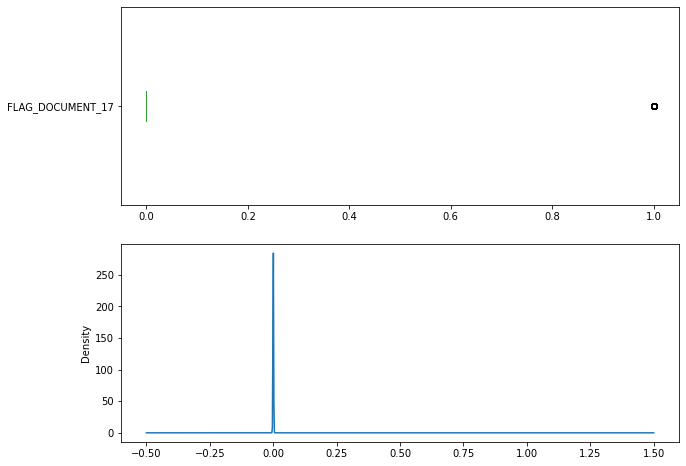

**************** FLAG_DOCUMENT_18 ****************

lower outlier: 0            upper outlier: 2500



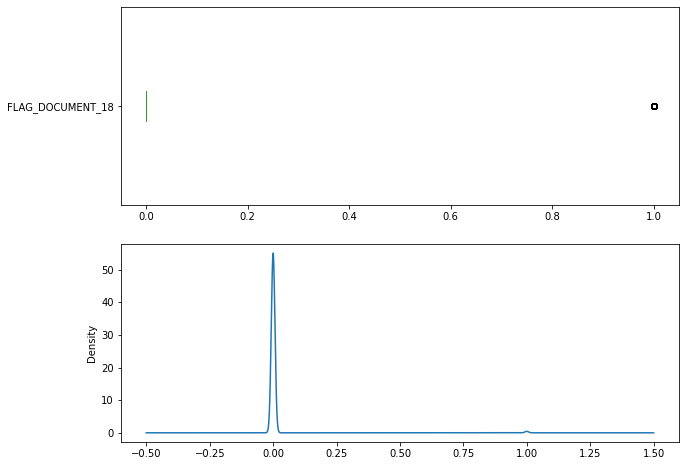

**************** FLAG_DOCUMENT_19 ****************

lower outlier: 0            upper outlier: 183



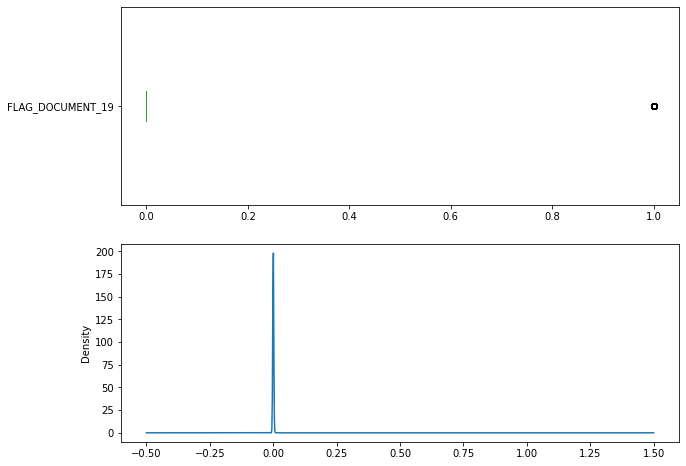

**************** FLAG_DOCUMENT_20 ****************

lower outlier: 0            upper outlier: 156



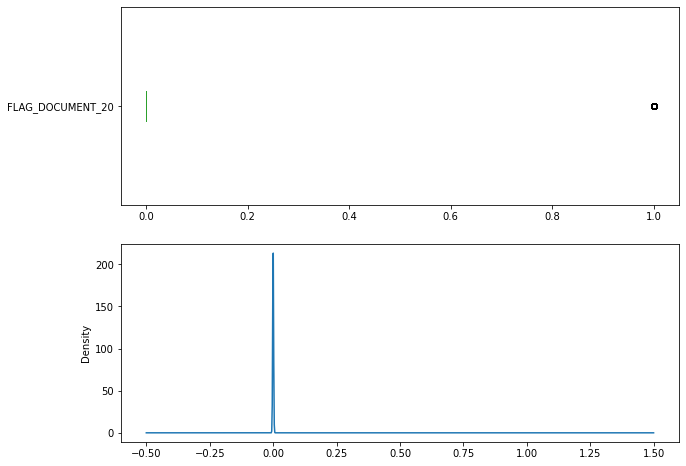

**************** FLAG_DOCUMENT_21 ****************

lower outlier: 0            upper outlier: 103



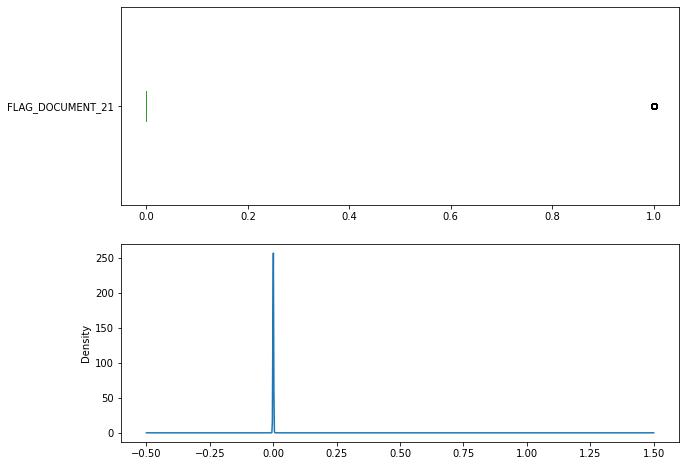

**************** AMT_REQ_CREDIT_BUREAU_HOUR ****************

lower outlier: 0            upper outlier: 1626



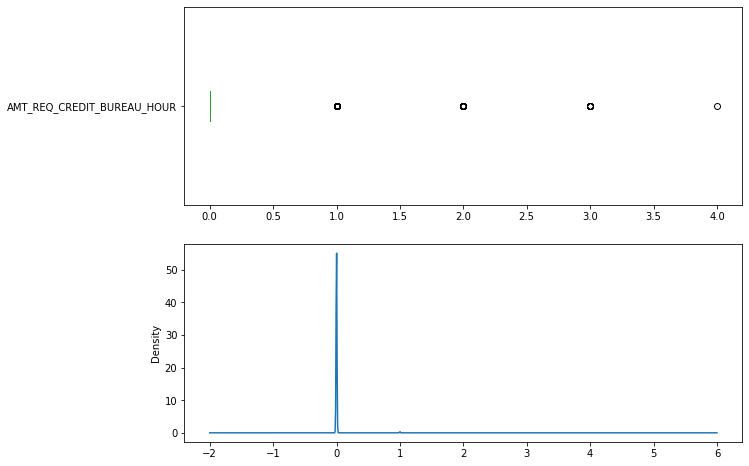

**************** AMT_REQ_CREDIT_BUREAU_DAY ****************

lower outlier: 0            upper outlier: 1489



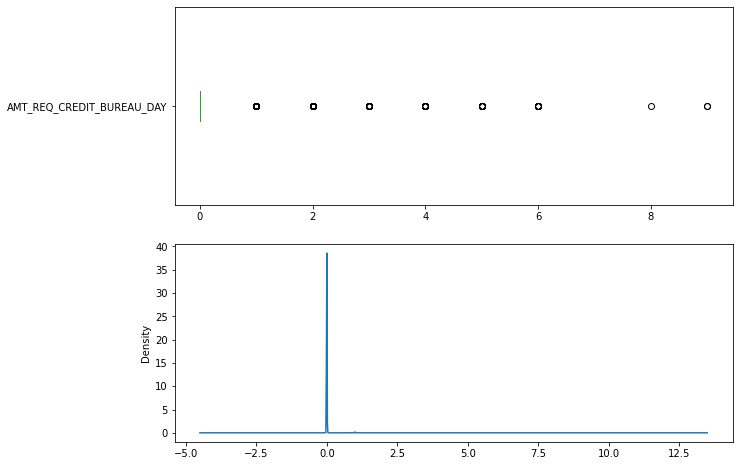

**************** AMT_REQ_CREDIT_BUREAU_WEEK ****************

lower outlier: 0            upper outlier: 8536



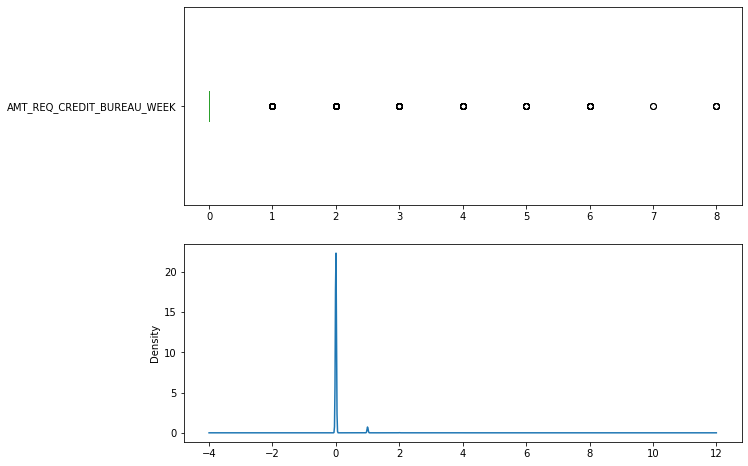

**************** AMT_REQ_CREDIT_BUREAU_MON ****************

lower outlier: 0            upper outlier: 43758



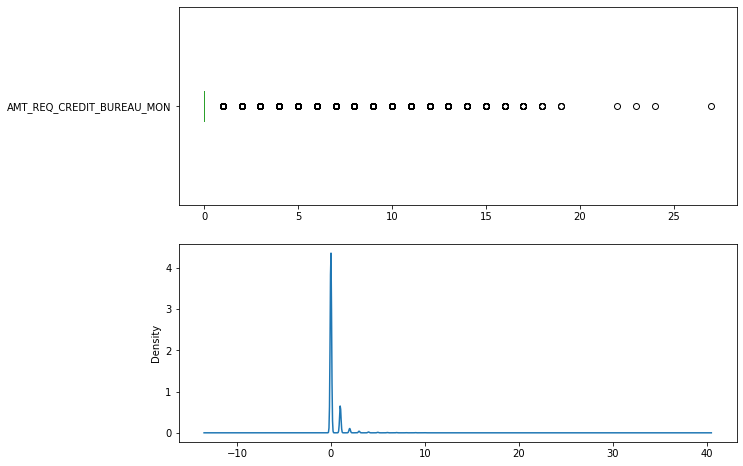

**************** AMT_REQ_CREDIT_BUREAU_QRT ****************

lower outlier: 0            upper outlier: 50574



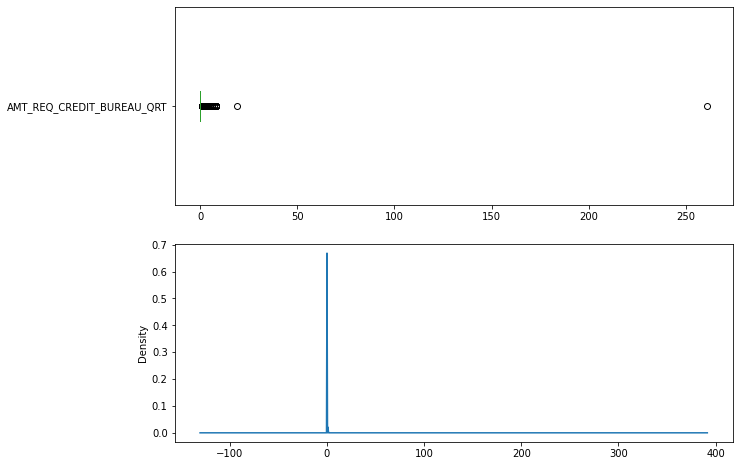

**************** AMT_REQ_CREDIT_BUREAU_YEAR ****************

lower outlier: 0            upper outlier: 3364



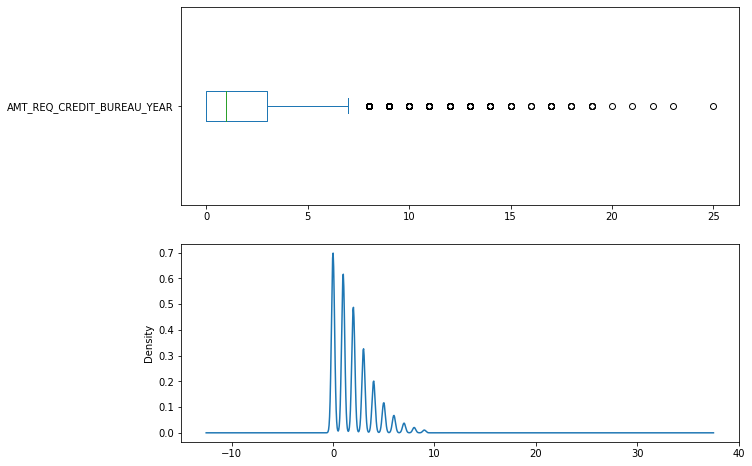

**************** LTV ****************

lower outlier: 168            upper outlier: 2574



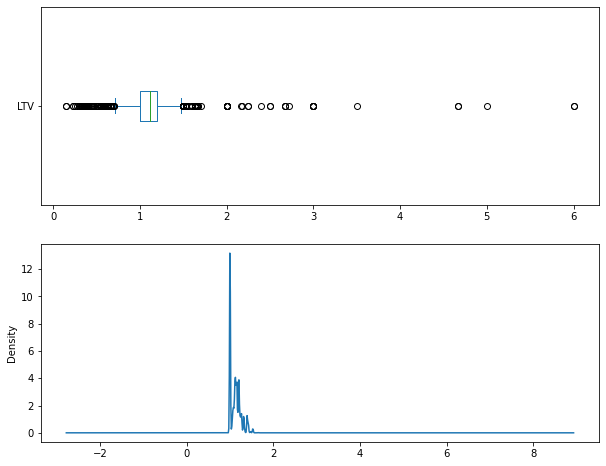

**************** DTI ****************

lower outlier: 0            upper outlier: 7878



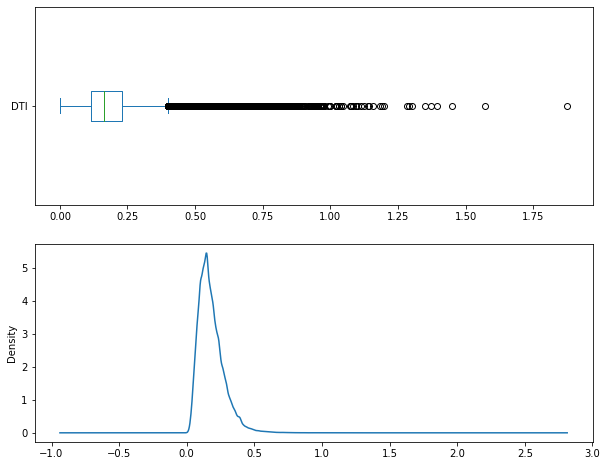

**************** Employed/Birth ****************

lower outlier: 55374            upper outlier: 12352



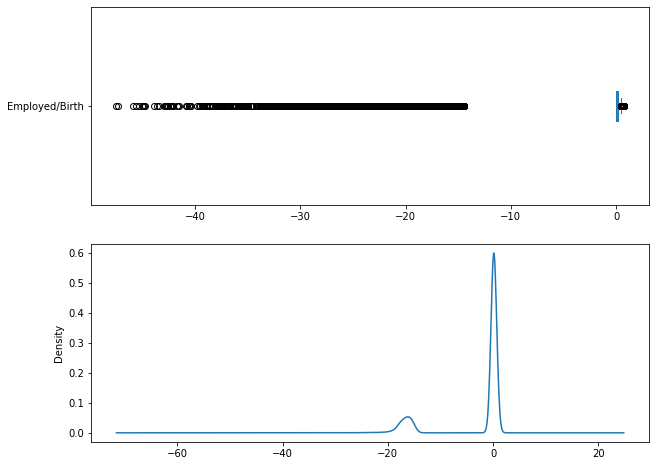

**************** Flag_Greater_30 ****************

lower outlier: 45184            upper outlier: 0



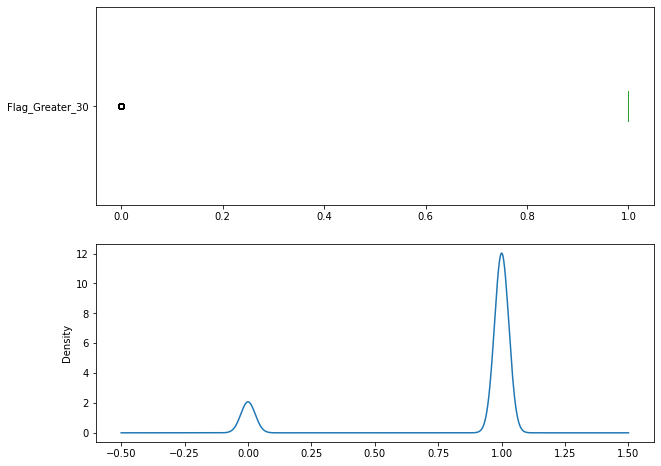

**************** Flag_Employment_Greater_5 ****************

lower outlier: 0            upper outlier: 0



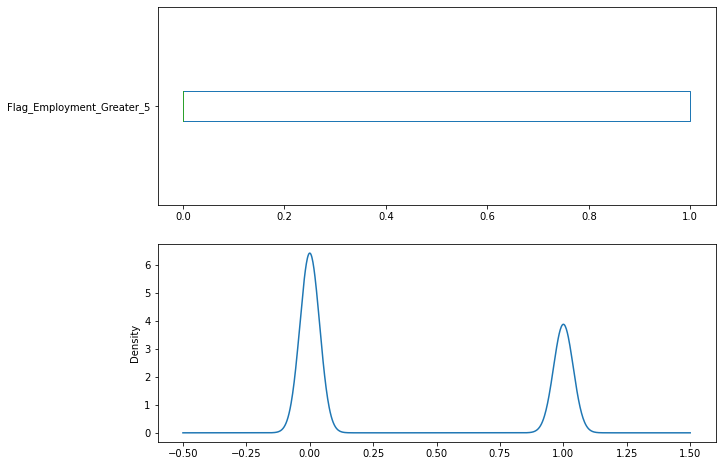

In [ ]:
# Визуализация выбросов и плотности распределения числовых признаков

for i in range(len(numeric_col)):
    preprocess(numeric[numeric_col], numeric_col[i])

###Feature Selector Usage

In [ ]:
# Воспользуемся FeatureSelector
# для отбора признаков и их последующего удаления

# FeatureSelector имеет 5 методов поиска
# >>> находит признаки с долей отсутствующих значений,
#     превышающей заданный порог
# >>> находит признаки имеющие только 1 уникальное значение
# >>> находит коллинеарные объекты, определенные по коэффициенту корреляции, 
#     превышающему указанное значение
# >>> находит признаки с важностью 0
# >>> находят признаки не влияющие на указанную совокупную важность

# ! Внимание
# Автор не публиковал feature_selector в pypi, поэтому для его установки 
# нельзя использовать pip и conda, можно только скачать вручную с github, 
# а затем поместить файл feature_selector.py в текущую рабочую директорию, 
# после чего сделать импорт

from feature_selector import FeatureSelector

In [ ]:
# Информационно:

# FeatureSelector обработает категориальные переменные,
# используя one-hot encoding при использовании методов, 
# основанных на важности признаков

In [ ]:
# Разделим данные, так как в FeatureSelector необходимо передать 
# структурированный набор

data_fs_labels = data['TARGET']
data_fs = data.drop(columns=['TARGET'])

In [ ]:
# Создадим объект класса FeatureSelector

fs = FeatureSelector(data=data_fs, labels=data_fs_labels)

####1. Missing Values

In [ ]:
# Будем использовать порог 0,6, что соответствует обнаружению признаков 
# с более чем 60% пропущенных значений

# (Этот метод не выполняет one-hot encoding)

fs.identify_missing(missing_threshold=0.6)

17 features with greater than 0.60 missing values.



In [ ]:
# Доступ к признакам, определенным для удаления,
# можно получить через словарь ops объекта FeatureSelector

missing_features = fs.ops['missing']
missing_features

['OWN_CAR_AGE',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'FLOORSMIN_AVG',
 'LIVINGAPARTMENTS_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'FLOORSMIN_MODE',
 'LIVINGAPARTMENTS_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'FLOORSMIN_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'FONDKAPREMONT_MODE']

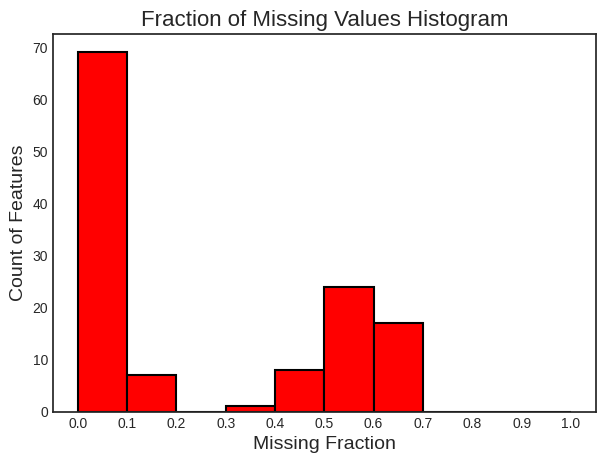

In [ ]:
# Построим гистограмму доли отсутствующих значений 
# для всех столбцов в наборе данных

fs.plot_missing()

In [ ]:
# Атрибут missing_stats для доступа к подробной информации

fs.missing_stats.head(10)

,missing_fraction
COMMONAREA_AVG,0.698722
COMMONAREA_MEDI,0.698722
COMMONAREA_MODE,0.698722
NONLIVINGAPARTMENTS_AVG,0.694332
NONLIVINGAPARTMENTS_MEDI,0.694332
NONLIVINGAPARTMENTS_MODE,0.694332
FONDKAPREMONT_MODE,0.683864
LIVINGAPARTMENTS_AVG,0.683552
LIVINGAPARTMENTS_MODE,0.683552
LIVINGAPARTMENTS_MEDI,0.683552


####2. Single Unique Value

In [ ]:
# Найдем признаки, которые имеют только одно уникальное значение

# (Этот метод не выполняет one-hot encoding)

fs.identify_single_unique()

0 features with a single unique value.



In [ ]:
# В нашем случае признаков с одним уникальным значением нет

single_unique = fs.ops['single_unique']
single_unique

[]

####3. Collinear (highly correlated) Features

In [ ]:
# Этот метод находит пары коллинеарных объектов на основе
# коэффициента корреляции Пирсона. Для каждой пары,
# превышающей указанный порог (по абсолютному значению),
# он идентифицирует одну из переменных, подлежащих удалению.
# В метод передаем порог

# Этот метод не выполняет one-hot encoding заранее, если one_hot=True
# Поэтому корреляции рассчитываются только между числовыми столбцами

fs.identify_collinear(correlation_threshold=0.97)

30 features with a correlation magnitude greater than 0.97.



In [ ]:
# Доступ к признакам, определенным для удаления

correlated_features = fs.ops['collinear']
correlated_features

['AMT_GOODS_PRICE',
 'FLAG_EMP_PHONE',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'Employed/Birth']

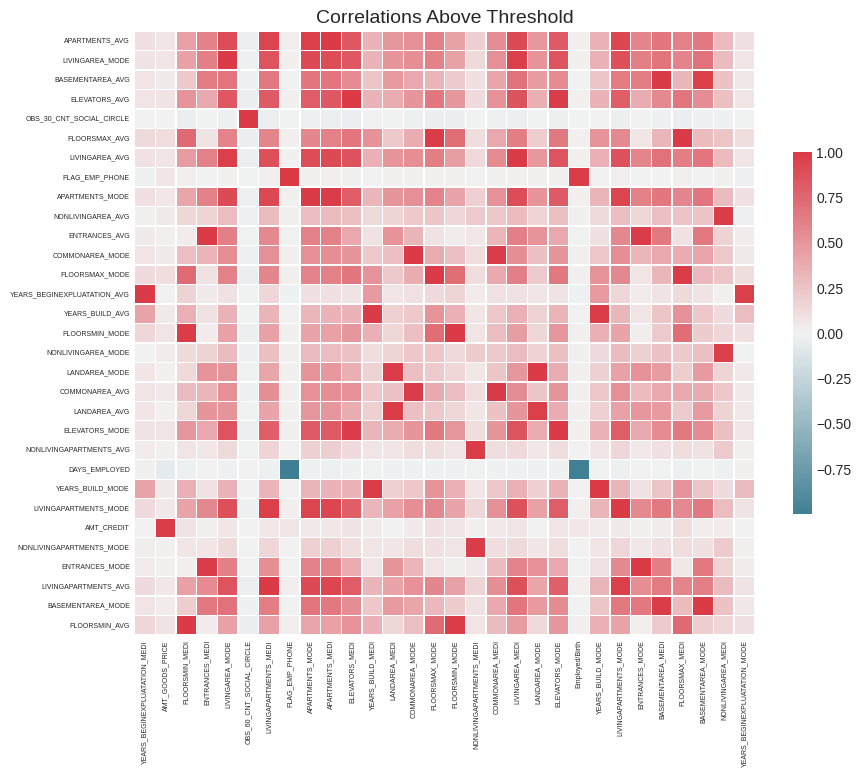

In [ ]:
# Посмотрим тепловую карту корреляций выше порога.
# Признаки, которые будут удалены, находятся на оси x

fs.plot_collinear()

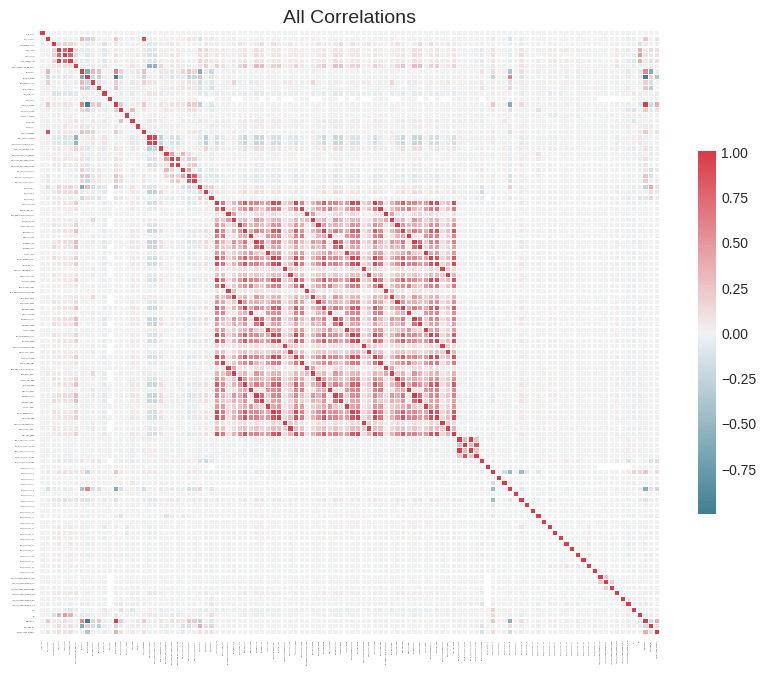

In [ ]:
# Чтобы построить все корреляции в данных,
# мы можем передать plot_all=True функции plot_collinear

fs.plot_collinear(plot_all=True)

In [ ]:
# Чтобы просмотреть детали корреляций выше порогового значения,
# мы обращаемся к атрибуту record_collinear, который является фреймом данных. 
# Признак drop_feature будет удален, и для каждого признака,
# который будет удален, может быть несколько корреляций, которые он имеет с corr_feature

fs.record_collinear

,drop_feature,corr_feature,corr_value
0,AMT_GOODS_PRICE,AMT_CREDIT,0.986971
1,FLAG_EMP_PHONE,DAYS_EMPLOYED,-0.999755
2,APARTMENTS_MODE,APARTMENTS_AVG,0.973259
3,BASEMENTAREA_MODE,BASEMENTAREA_AVG,0.973496
4,YEARS_BEGINEXPLUATATION_MODE,YEARS_BEGINEXPLUATATION_AVG,0.971893
5,YEARS_BUILD_MODE,YEARS_BUILD_AVG,0.989444
6,COMMONAREA_MODE,COMMONAREA_AVG,0.977147
7,ELEVATORS_MODE,ELEVATORS_AVG,0.978837
8,ENTRANCES_MODE,ENTRANCES_AVG,0.977742
9,FLOORSMAX_MODE,FLOORSMAX_AVG,0.985689


####4. Zero Importance Features

In [ ]:
# Этот метод работает путем определения важности признаков с использованием
# gradient boosting machine, реализованной в библиотеке LightGBM

# Данные сначала подвергаются one hot encoding для использования в модели.

# task            >>>  классификация либо регрессия
# eval_metric     >>>  метрика, используемая для ранней остановки
# n_iterations    >>>  количество тренировочных прогонов
# early_stopping  >>>  использовать ли раннюю остановку при обучении модели

fs.identify_zero_importance(task='classification', eval_metric='auc', 
                            n_iterations=10, early_stopping=True)

Training Gradient Boosting Model

Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[240]	valid_0's binary_logloss: 0.24576	valid_0's auc: 0.758954
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[404]	valid_0's binary_logloss: 0.245013	valid_0's auc: 0.761785
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[238]	valid_0's binary_logloss: 0.246389	valid_0's auc: 0.758378
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[269]	valid_0's binary_logloss: 0.246615	valid_0's auc: 0.757237
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[185]	valid_0's binary_logloss: 0.244296	valid_0's auc: 0.766109
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[328]	valid_0's binary_logloss: 0.245751	valid_0's auc

In [ ]:
# Для запуска модели повышения градиента требуется одно one hot encoding 
# Эти функции сохраняются в атрибуте one_hot_features
# Оригинальные функции сохраняются в base_features

one_hot_features = fs.one_hot_features
base_features = fs.base_features

print(f'Количество оригинальных признаков: {len(base_features)}')
print(f'Количество one-hot признаков: {len(one_hot_features)}')

Количество оригинальных признаков: 126
Количество one-hot признаков: 139


In [ ]:
# Атрибут data_all содержит исходные данные плюс признаки,
# закодированные one hot encoding

fs.data_all.head()

,NAME_CONTRACT_TYPE_Cash loans,NAME_CONTRACT_TYPE_Revolving loans,CODE_GENDER_F,CODE_GENDER_M,FLAG_OWN_CAR_N,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_N,FLAG_OWN_REALTY_Y,NAME_TYPE_SUITE_Children,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Group of people,NAME_TYPE_SUITE_Other_A,NAME_TYPE_SUITE_Other_B,"NAME_TYPE_SUITE_Spouse, partner",NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Businessman,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_Maternity leave,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Unemployed,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Unknown,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_Co-op apartment,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Advertising,ORGANIZATION_TYPE_Agriculture,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Cleaning,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Culture,ORGANIZATION_TYPE_Electricity,ORGANIZATION_TYPE_Emergency,ORGANIZATION_TYPE_Government,ORGANIZATION_TYPE_Hotel,ORGANIZATION_TYPE_Housing,ORGANIZATION_TYPE_Industry: type 1,ORGANIZATION_TYPE_Industry: type 10,ORGANIZATION_TYPE_Industry: type 11,ORGANIZATION_TYPE_Industry: type 12,ORGANIZATION_TYPE_Industry: type 13,ORGANIZATION_TYPE_Industry: type 2,ORGANIZATION_TYPE_Industry: type 3,ORGANIZATION_TYPE_Industry: type 4,ORGANIZATION_TYPE_Industry: type 5,ORGANIZATION_TYPE_Industry: type 6,ORGANIZATION_TYPE_Industry: type 7,ORGANIZATION_TYPE_Industry: type 8,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Insurance,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Legal Services,ORGANIZATION_TYPE_Medicine,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Mobile,ORGANIZATION_TYPE_Other,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Postal,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_Religion,ORGANIZATION_TYPE_Restaurant,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Services,ORGANIZATION_TYPE_Telecom,ORGANIZATION_TYPE_Trade: type 1,ORGANIZATION_TYPE_Trade: type 2,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,ORGANIZATION_TYPE_XNA,FONDKAPREMONT_MODE_not specified,FONDKAPREMONT_MODE_org spec account,FONDKAPREMONT_MODE_reg oper account,FONDKAPREMONT_MODE_reg oper spec account,HOUSETYPE_MODE_block of flats,HOUSETYPE_MODE_specific housing,HOUSETYPE_MODE_terraced hou

In [ ]:
# Признаки с нулевой важностью

zero_importance_features = fs.ops['zero_importance']
zero_importance_features

['FLAG_DOCUMENT_20',
 'NAME_INCOME_TYPE_Maternity leave',
 'ORGANIZATION_TYPE_Industry: type 8',
 'FLAG_MOBIL',
 'FLAG_DOCUMENT_19',
 'ORGANIZATION_TYPE_Industry: type 6',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_12',
 'FLAG_DOCUMENT_10',
 'ORGANIZATION_TYPE_Emergency',
 'FLAG_DOCUMENT_7',
 'NAME_INCOME_TYPE_Businessman',
 'NAME_TYPE_SUITE_Group of people',
 'ORGANIZATION_TYPE_Industry: type 13',
 'FLAG_DOCUMENT_4',
 'ORGANIZATION_TYPE_Transport: type 1',
 'FLAG_DOCUMENT_17',
 'ORGANIZATION_TYPE_Trade: type 5',
 'NAME_INCOME_TYPE_Student',
 'ORGANIZATION_TYPE_Religion',
 'ORGANIZATION_TYPE_Industry: type 10',
 'NAME_FAMILY_STATUS_Unknown',
 'ORGANIZATION_TYPE_XNA']

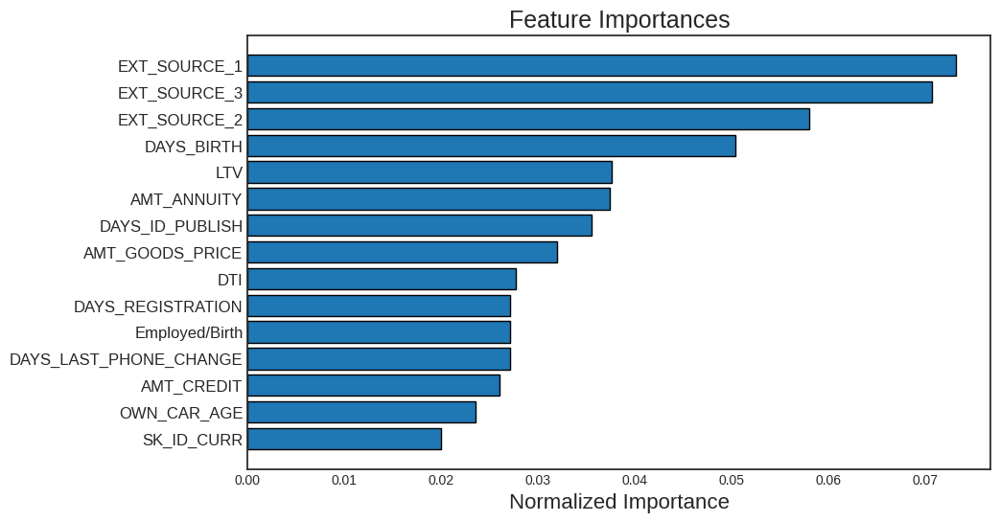

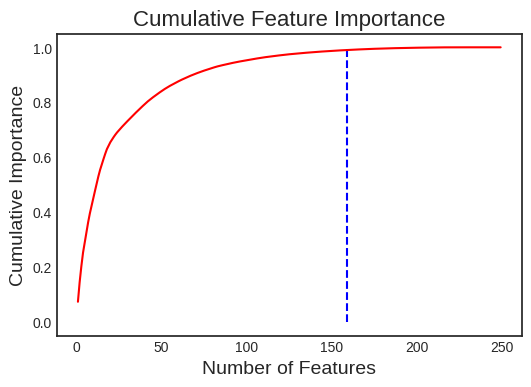

159 features required for 0.99 of cumulative importance


In [ ]:
# Plot Feature Importances

# Отражает совокупную важность признаков по сравнению
# с количеством признаков

# threshold  >>>  порог, необходимый для учета общей важности
# plot_n     >>>  количество отображаемых признаков

fs.plot_feature_importances(threshold=0.99, plot_n=15)

In [ ]:
# Все значения признака доступны в атрибуте feature_importances

fs.feature_importances.head(10)

,feature,importance,normalized_importance,cumulative_importance
0,EXT_SOURCE_1,565.3,0.073178,0.073178
1,EXT_SOURCE_3,546.2,0.070706,0.143883
2,EXT_SOURCE_2,448.6,0.058071,0.201955
3,DAYS_BIRTH,389.3,0.050395,0.252350
4,LTV,290.9,0.037657,0.290006
5,AMT_ANNUITY,289.1,0.037424,0.327430
6,DAYS_ID_PUBLISH,274.7,0.035560,0.362990
7,AMT_GOODS_PRICE,247.3,0.032013,0.395003
8,DTI,214.3,0.027741,0.422744
9,DAYS_REGISTRATION,209.5,0.027120,0.449864


In [ ]:
# Мы могли бы использовать эти результаты, чтобы выбрать только «n»
# наиболее важных признаков. Например, если нам нужны 100 наиболее 
# важных элементов, мы можем сделать следующее

one_hundred_features = list(fs.feature_importances.loc[:99, 'feature'])

len(one_hundred_features)

100

####5. Low Importance Features

In [ ]:
# Этот метод основывается на важности признаков
# из gradient boosting machine

# cumulative_importance  >>>  совокупная важность

fs.identify_low_importance(cumulative_importance=0.99)

158 features required for cumulative importance of 0.99 after one hot encoding.
91 features do not contribute to cumulative importance of 0.99.



In [ ]:
# Элементы низкой важности, которые необходимо удалить

low_importance_features = fs.ops['low_importance']
low_importance_features[:10]

['FONDKAPREMONT_MODE_reg oper account',
 'ORGANIZATION_TYPE_Trade: type 3',
 'ORGANIZATION_TYPE_Medicine',
 'NAME_HOUSING_TYPE_Co-op apartment',
 'WALLSMATERIAL_MODE_Block',
 'WALLSMATERIAL_MODE_Others',
 'ORGANIZATION_TYPE_Other',
 'ORGANIZATION_TYPE_Restaurant',
 'FONDKAPREMONT_MODE_org spec account',
 'ORGANIZATION_TYPE_Legal Services']

####Removing Features

In [ ]:
# Проверим, сколько признаков будет удалено с помощью check_removal.
# Возвращается список всех признаков,
# которые были идентифицированы для удаления

all_to_remove = fs.check_removal()
all_to_remove[:15]

Total of 128 features identified for removal


['AMT_GOODS_PRICE',
 'EMERGENCYSTATE_MODE_Yes',
 'Flag_Greater_30',
 'ORGANIZATION_TYPE_Insurance',
 'LIVINGAREA_MODE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'FLAG_DOCUMENT_17',
 'FLAG_DOCUMENT_21',
 'NAME_INCOME_TYPE_Student',
 'FLAG_EMP_PHONE',
 'APARTMENTS_MODE',
 'ORGANIZATION_TYPE_Electricity',
 'FLAG_DOCUMENT_12',
 'ORGANIZATION_TYPE_Agriculture',
 'FONDKAPREMONT_MODE_org spec account']

In [ ]:
# Удалим все выявленные признаки

data_fs_removed = fs.remove(methods='all')

['missing', 'single_unique', 'collinear', 'zero_importance', 'low_importance'] methods have been run

Removed 128 features.


In [ ]:
# Посмотрим на результат

data_fs_removed.head()

,NAME_CONTRACT_TYPE_Cash loans,CODE_GENDER_F,FLAG_OWN_REALTY_N,FLAG_OWN_REALTY_Y,NAME_TYPE_SUITE_Family,NAME_TYPE_SUITE_Other_B,NAME_TYPE_SUITE_Unaccompanied,NAME_INCOME_TYPE_Commercial associate,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Academic degree,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Civil marriage,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Accountants,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff,WEEKDAY_APPR_PROCESS_START_FRIDAY,WEEKDAY_APPR_PROCESS_START_MONDAY,WEEKDAY_APPR_PROCESS_START_SATURDAY,WEEKDAY_APPR_PROCESS_START_SUNDAY,WEEKDAY_APPR_PROCESS_START_THURSDAY,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_WEDNESDAY,ORGANIZATION_TYPE_Bank,ORGANIZATION_TYPE_Business Entity Type 1,ORGANIZATION_TYPE_Business Entity Type 2,ORGANIZATION_TYPE_Business Entity Type 3,ORGANIZATION_TYPE_Construction,ORGANIZATION_TYPE_Industry: type 9,ORGANIZATION_TYPE_Kindergarten,ORGANIZATION_TYPE_Military,ORGANIZATION_TYPE_Police,ORGANIZATION_TYPE_Realtor,ORGANIZATION_TYPE_School,ORGANIZATION_TYPE_Security,ORGANIZATION_TYPE_Security Ministries,ORGANIZATION_TYPE_Self-employed,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University,FONDKAPREMONT_MODE_not specified,FONDKAPREMONT_MODE_reg oper spec account,HOUSETYPE_MODE_specific housing,WALLSMATERIAL_MODE_Panel,"WALLSMATERIAL_MODE_Stone, brick",SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,NONLIVINGAREA_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_5,FLAG_DOCUMENT_8,FLAG_DOCUMENT_11,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,FLAG_DOCUMENT_18,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,LTV,DTI
0,1,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,100002,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,0,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.00,0.0690,0.0833,0.0369,0.0190,0.0000,0.0,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,-1134.0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,1.158397,0.121978
1,1,1,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,

In [ ]:
# Дополнительно удалим one-hot признаки

data_after_fs = fs.remove(methods='all', keep_one_hot=False)

['missing', 'single_unique', 'collinear', 'zero_importance', 'low_importance'] methods have been run

Removed 194 features including one-hot features.


In [ ]:
print(f'Количество оригинальных признаков: {data_fs.shape[1]}')
print(f'Финальное количество признаков: {data_after_fs.shape[1]}')

Количество оригинальных признаков: 126
Финальное количество признаков: 71


In [ ]:
# Посмотрим на результат

data_after_fs.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,NONLIVINGAREA_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_5,FLAG_DOCUMENT_8,FLAG_DOCUMENT_11,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,FLAG_DOCUMENT_18,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,LTV,DTI
0,100002,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,0,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.00,0.0690,0.0833,0.0369,0.0190,0.0000,0.0,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,-1134.0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,1.158397,0.121978
1,100003,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,0,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.08,0.0345,0.2917,0.0130,0.0549,0.0098,0.0,block of flats,0.0714,Block,No,1.0,0.0,0.0,-828.0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.145199,0.132217
2,100004,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.100000
3,100006,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,0,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0,-617.0,1,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,1.052803,0.219900
4,100007,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,0,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,1,1,Religion,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,-1106.0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.179963


###Manage Missing Numerical Features

In [ ]:
# Разделим признаки на числовые и категориальные

numeric_features, categorical_features = separation_features(data_after_fs)

numeric = data_after_fs[numeric_features]
categorical = data_after_fs[categorical_features]

In [ ]:
# Числовые признаки

numeric.head()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,NONLIVINGAREA_MODE,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_5,FLAG_DOCUMENT_8,FLAG_DOCUMENT_11,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,FLAG_DOCUMENT_18,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,LTV,DTI
0,100002,0,202500.0,406597.5,24700.5,0.018801,-9461,-637,-3648.0,-2120,0,1,0,1.0,2,2,10,0,0,0,0,0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.00,0.0690,0.0833,0.0369,0.0190,0.0000,0.0,0.0149,2.0,2.0,2.0,-1134.0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,1.158397,0.121978
1,100003,0,270000.0,1293502.5,35698.5,0.003541,-16765,-1188,-1186.0,-291,0,1,0,2.0,1,1,11,0,0,0,0,0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.08,0.0345,0.2917,0.0130,0.0549,0.0098,0.0,0.0714,1.0,0.0,0.0,-828.0,1,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.145199,0.132217
2,100004,0,67500.0,135000.0,6750.0,0.010032,-19046,-225,-4260.0,-2531,1,1,0,1.0,2,2,9,0,0,0,0,0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.100000
3,100006,0,135000.0,312682.5,29686.5,0.008019,-19005,-3039,-9833.0,-2437,0,0,0,2.0,2,2,17,0,0,0,0,0,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,0.0,-617.0,1,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,1.052803,0.219900
4,100007,0,121500.0,513000.0,21865.5,0.028663,-19932,-3038,-4311.0,-3458,0,0,0,1.0,2,2,11,0,0,0,1,1,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,-1106.0,0,0,1,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.179963


In [ ]:
# Сумма пропущенных значений в числовых признаках

pd.DataFrame(numeric.isna().sum().sort_values(ascending=False))

,0
LANDAREA_AVG,182588
BASEMENTAREA_AVG,179942
EXT_SOURCE_1,173376
NONLIVINGAREA_MODE,169680
NONLIVINGAREA_AVG,169680
ELEVATORS_AVG,163890
APARTMENTS_AVG,156060
ENTRANCES_AVG,154827
LIVINGAREA_AVG,154349
FLOORSMAX_AVG,153019


In [ ]:
# Выделим числовые признаки, в которых есть пропущенные значения

numeric_is_null = numeric.isna().sum() != 0
final_numeric_feature = numeric.columns[numeric_is_null].tolist()
final_numeric_feature

['AMT_ANNUITY',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'LANDAREA_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAREA_AVG',
 'NONLIVINGAREA_MODE',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'LTV',
 'DTI']

In [ ]:
# Заполним пропущенные значения средними для каждого признака отдельно

for i in range(len(final_numeric_feature)):
    replace_mean(numeric, final_numeric_feature[i])

NaN in AMT_ANNUITY raplaced with 27108.666786451813
NaN in CNT_FAM_MEMBERS raplaced with 2.1526576803629207
NaN in EXT_SOURCE_1 raplaced with 0.5021294049626644
NaN in EXT_SOURCE_2 raplaced with 0.5143918090831213
NaN in EXT_SOURCE_3 raplaced with 0.5108562869992338
NaN in APARTMENTS_AVG raplaced with 0.11744202262177529
NaN in BASEMENTAREA_AVG raplaced with 0.08844251479637835
NaN in YEARS_BEGINEXPLUATATION_AVG raplaced with 0.9777347870807167
NaN in ELEVATORS_AVG raplaced with 0.07894316132491279
NaN in ENTRANCES_AVG raplaced with 0.14972580495153262
NaN in FLOORSMAX_AVG raplaced with 0.22628441302884367
NaN in LANDAREA_AVG raplaced with 0.06633385073527645
NaN in LIVINGAREA_AVG raplaced with 0.10740045182099534
NaN in NONLIVINGAREA_AVG raplaced with 0.028358118510886838
NaN in NONLIVINGAREA_MODE raplaced with 0.027022658840430393
NaN in TOTALAREA_MODE raplaced with 0.10254790258805485
NaN in OBS_30_CNT_SOCIAL_CIRCLE raplaced with 1.4222085184967663
NaN in DEF_30_CNT_SOCIAL_CIRCLE ra

In [ ]:
# Проверим

pd.DataFrame(numeric.isna().sum().sort_values(ascending=False))

,0
SK_ID_CURR,0
CNT_CHILDREN,0
FLOORSMAX_AVG,0
LANDAREA_AVG,0
LIVINGAREA_AVG,0
NONLIVINGAREA_AVG,0
NONLIVINGAREA_MODE,0
TOTALAREA_MODE,0
OBS_30_CNT_SOCIAL_CIRCLE,0
DEF_30_CNT_SOCIAL_CIRCLE,0


###Manage Outlier

In [ ]:
# Наименования числовых признаков

col_names = numeric.columns
col_names

Index(['SK_ID_CURR', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH',
       'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG',
       'YEARS_BEGINEXPLUATATION_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG',
       'FLOORSMAX_AVG', 'LANDAREA_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAREA_AVG',
       'NONLIVINGAREA_MODE', 'TOTALAREA_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_5',
       'FLAG_DOCUMENT_8

In [ ]:
# Детектируем выбросы

for i in range(len(col_names)):
    print(f'{col_names[i]}: {outlier_detect(numeric,col_names[i]).shape[0]}')

SK_ID_CURR: 0
CNT_CHILDREN: 4272
AMT_INCOME_TOTAL: 14035
AMT_CREDIT: 6562
AMT_ANNUITY: 7504
REGION_POPULATION_RELATIVE: 8412
DAYS_BIRTH: 0
DAYS_EMPLOYED: 72216
DAYS_REGISTRATION: 659
DAYS_ID_PUBLISH: 0
FLAG_WORK_PHONE: 61304
FLAG_PHONE: 0
FLAG_EMAIL: 17442
CNT_FAM_MEMBERS: 4007
REGION_RATING_CLIENT: 80526
REGION_RATING_CLIENT_W_CITY: 78026
HOUR_APPR_PROCESS_START: 2257
REG_REGION_NOT_WORK_REGION: 15612
LIVE_REGION_NOT_WORK_REGION: 12503
REG_CITY_NOT_LIVE_CITY: 24039
REG_CITY_NOT_WORK_CITY: 70867
LIVE_CITY_NOT_WORK_CITY: 55215
EXT_SOURCE_1: 0
EXT_SOURCE_2: 0
EXT_SOURCE_3: 0
APARTMENTS_AVG: 10655
BASEMENTAREA_AVG: 7190
YEARS_BEGINEXPLUATATION_AVG: 4784
ELEVATORS_AVG: 10420
ENTRANCES_AVG: 3882
FLOORSMAX_AVG: 5215
LANDAREA_AVG: 6888
LIVINGAREA_AVG: 12517
NONLIVINGAREA_AVG: 16546
NONLIVINGAREA_MODE: 18817
TOTALAREA_MODE: 12091
OBS_30_CNT_SOCIAL_CIRCLE: 19969
DEF_30_CNT_SOCIAL_CIRCLE: 36185
DEF_60_CNT_SOCIAL_CIRCLE: 26788
DAYS_LAST_PHONE_CHANGE: 435
FLAG_DOCUMENT_3: 0
FLAG_DOCUMENT_5: 4648
F

In [ ]:
# Отберем признаки, в которых были детектированы выбросы

outlier = []
for i in range(len(final_numeric_feature)):
    if outlier_detect(numeric[final_numeric_feature],final_numeric_feature[i]).shape[0] !=0:
        outlier.append(final_numeric_feature[i])

In [ ]:
col_names = outlier

In [ ]:
# Выделим верхние выбросы

for i in range(len(col_names)):
    print(f'{col_names[i]}: {upper_outlier(numeric,col_names[i]).shape[0]}')

AMT_ANNUITY: 7504
CNT_FAM_MEMBERS: 4007
APARTMENTS_AVG: 10655
BASEMENTAREA_AVG: 7190
YEARS_BEGINEXPLUATATION_AVG: 0
ELEVATORS_AVG: 10420
ENTRANCES_AVG: 3882
FLOORSMAX_AVG: 5215
LANDAREA_AVG: 6888
LIVINGAREA_AVG: 12517
NONLIVINGAREA_AVG: 16546
NONLIVINGAREA_MODE: 18817
TOTALAREA_MODE: 12091
OBS_30_CNT_SOCIAL_CIRCLE: 19969
DEF_30_CNT_SOCIAL_CIRCLE: 36185
DEF_60_CNT_SOCIAL_CIRCLE: 26788
DAYS_LAST_PHONE_CHANGE: 0
AMT_REQ_CREDIT_BUREAU_HOUR: 43145
AMT_REQ_CREDIT_BUREAU_DAY: 43008
AMT_REQ_CREDIT_BUREAU_WEEK: 50055
AMT_REQ_CREDIT_BUREAU_MON: 85277
AMT_REQ_CREDIT_BUREAU_QRT: 92093
AMT_REQ_CREDIT_BUREAU_YEAR: 3364
LTV: 2574
DTI: 7878


In [ ]:
# Заменим верхние выбросы

for i in range(len(col_names)):
    replace_upper(numeric, col_names[i])

In [ ]:
# Проверим

for i in range(len(col_names)):
    print(f'{col_names[i]}: {upper_outlier(numeric,col_names[i]).shape[0]}')

AMT_ANNUITY: 0
CNT_FAM_MEMBERS: 0
APARTMENTS_AVG: 0
BASEMENTAREA_AVG: 0
YEARS_BEGINEXPLUATATION_AVG: 0
ELEVATORS_AVG: 0
ENTRANCES_AVG: 0
FLOORSMAX_AVG: 0
LANDAREA_AVG: 0
LIVINGAREA_AVG: 0
NONLIVINGAREA_AVG: 0
NONLIVINGAREA_MODE: 0
TOTALAREA_MODE: 0
OBS_30_CNT_SOCIAL_CIRCLE: 0
DEF_30_CNT_SOCIAL_CIRCLE: 0
DEF_60_CNT_SOCIAL_CIRCLE: 0
DAYS_LAST_PHONE_CHANGE: 0
AMT_REQ_CREDIT_BUREAU_HOUR: 0
AMT_REQ_CREDIT_BUREAU_DAY: 0
AMT_REQ_CREDIT_BUREAU_WEEK: 0
AMT_REQ_CREDIT_BUREAU_MON: 0
AMT_REQ_CREDIT_BUREAU_QRT: 0
AMT_REQ_CREDIT_BUREAU_YEAR: 0
LTV: 0
DTI: 0


In [ ]:
# Выделим нижние выбросы

for i in range(len(col_names)):
    print(f'{col_names[i]}: {lower_outlier(numeric,col_names[i]).shape[0]}')

AMT_ANNUITY: 0
CNT_FAM_MEMBERS: 0
APARTMENTS_AVG: 0
BASEMENTAREA_AVG: 0
YEARS_BEGINEXPLUATATION_AVG: 4784
ELEVATORS_AVG: 0
ENTRANCES_AVG: 0
FLOORSMAX_AVG: 0
LANDAREA_AVG: 0
LIVINGAREA_AVG: 0
NONLIVINGAREA_AVG: 0
NONLIVINGAREA_MODE: 0
TOTALAREA_MODE: 0
OBS_30_CNT_SOCIAL_CIRCLE: 0
DEF_30_CNT_SOCIAL_CIRCLE: 0
DEF_60_CNT_SOCIAL_CIRCLE: 0
DAYS_LAST_PHONE_CHANGE: 435
AMT_REQ_CREDIT_BUREAU_HOUR: 0
AMT_REQ_CREDIT_BUREAU_DAY: 0
AMT_REQ_CREDIT_BUREAU_WEEK: 0
AMT_REQ_CREDIT_BUREAU_MON: 0
AMT_REQ_CREDIT_BUREAU_QRT: 0
AMT_REQ_CREDIT_BUREAU_YEAR: 0
LTV: 168
DTI: 0


In [ ]:
# Заменим нижние выбросы

for i in range(len(col_names)):
    replace_lower(numeric, col_names[i])

In [ ]:
# Проверим

for i in range(len(col_names)):
    print(f'{col_names[i]}: {lower_outlier(numeric,col_names[i]).shape[0]}')

AMT_ANNUITY: 0
CNT_FAM_MEMBERS: 0
APARTMENTS_AVG: 0
BASEMENTAREA_AVG: 0
YEARS_BEGINEXPLUATATION_AVG: 0
ELEVATORS_AVG: 0
ENTRANCES_AVG: 0
FLOORSMAX_AVG: 0
LANDAREA_AVG: 0
LIVINGAREA_AVG: 0
NONLIVINGAREA_AVG: 0
NONLIVINGAREA_MODE: 0
TOTALAREA_MODE: 0
OBS_30_CNT_SOCIAL_CIRCLE: 0
DEF_30_CNT_SOCIAL_CIRCLE: 0
DEF_60_CNT_SOCIAL_CIRCLE: 0
DAYS_LAST_PHONE_CHANGE: 0
AMT_REQ_CREDIT_BUREAU_HOUR: 0
AMT_REQ_CREDIT_BUREAU_DAY: 0
AMT_REQ_CREDIT_BUREAU_WEEK: 0
AMT_REQ_CREDIT_BUREAU_MON: 0
AMT_REQ_CREDIT_BUREAU_QRT: 0
AMT_REQ_CREDIT_BUREAU_YEAR: 0
LTV: 0
DTI: 0


###Manage Missing Categorical Features

In [ ]:
# Категориальные признаки

categorical.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN


In [ ]:
# Сумма пропущенных значений в категориальных признаках

pd.DataFrame(categorical.isna().sum().sort_values(ascending=False))

,0
WALLSMATERIAL_MODE,156340
HOUSETYPE_MODE,154296
EMERGENCYSTATE_MODE,145754
OCCUPATION_TYPE,96389
NAME_TYPE_SUITE,1292
NAME_CONTRACT_TYPE,0
CODE_GENDER,0
FLAG_OWN_CAR,0
FLAG_OWN_REALTY,0
NAME_INCOME_TYPE,0


**************** NAME_CONTRACT_TYPE ****************



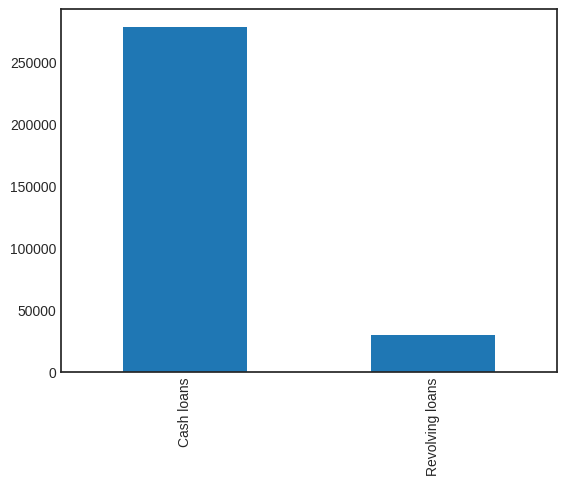

**************** CODE_GENDER ****************



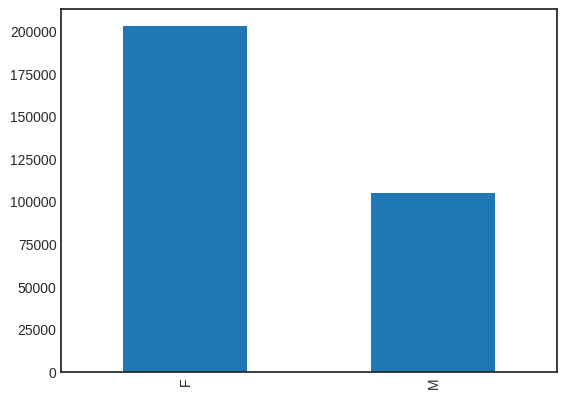

**************** FLAG_OWN_CAR ****************



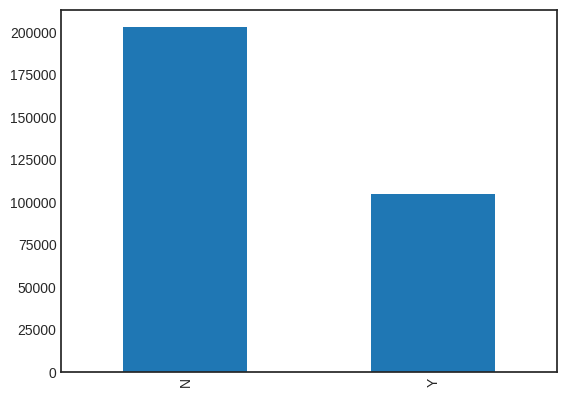

**************** FLAG_OWN_REALTY ****************



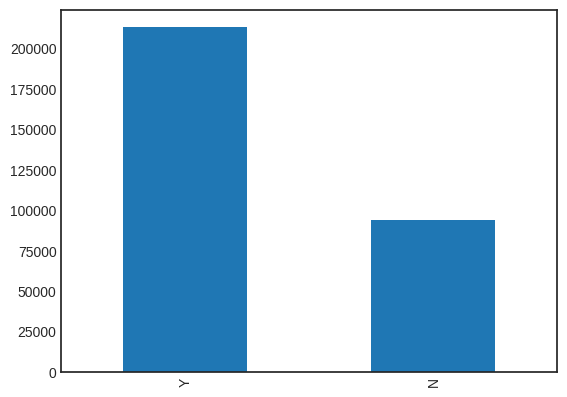

**************** NAME_TYPE_SUITE ****************



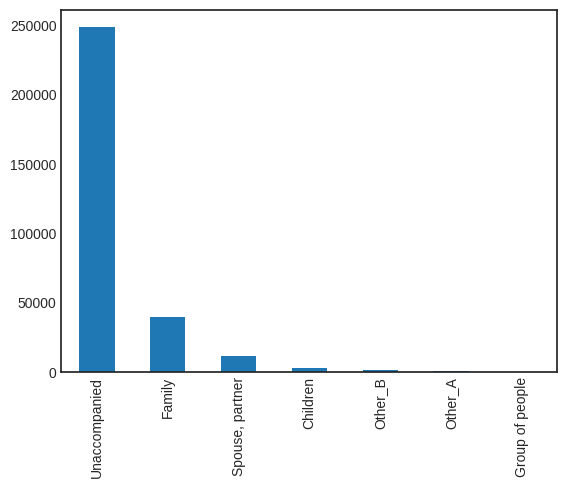

**************** NAME_INCOME_TYPE ****************



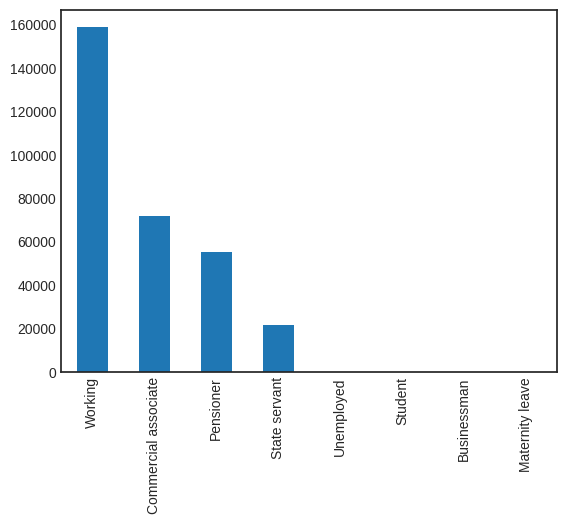

**************** NAME_EDUCATION_TYPE ****************



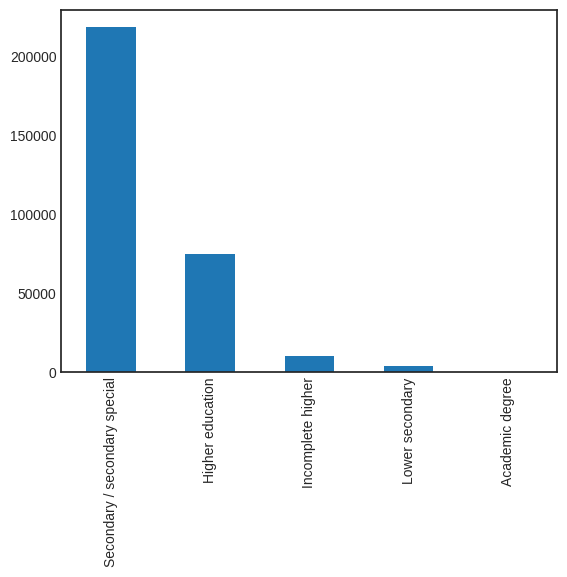

**************** NAME_FAMILY_STATUS ****************



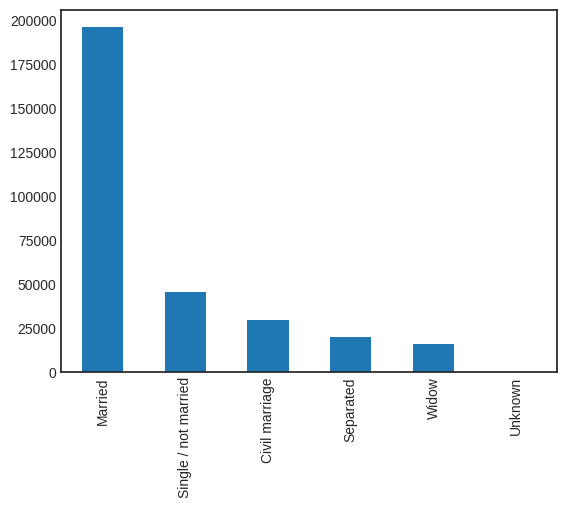

**************** NAME_HOUSING_TYPE ****************



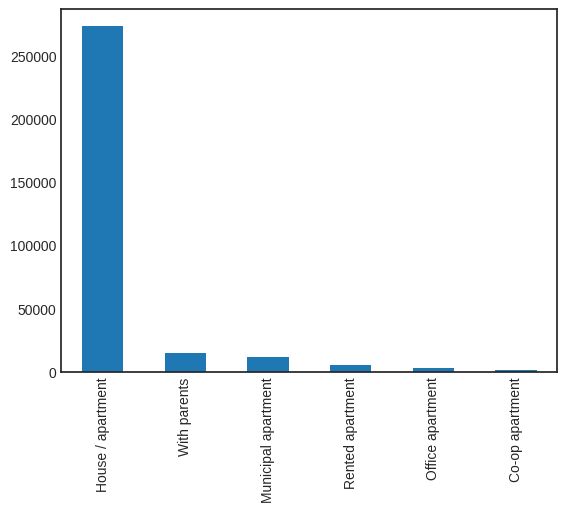

**************** OCCUPATION_TYPE ****************



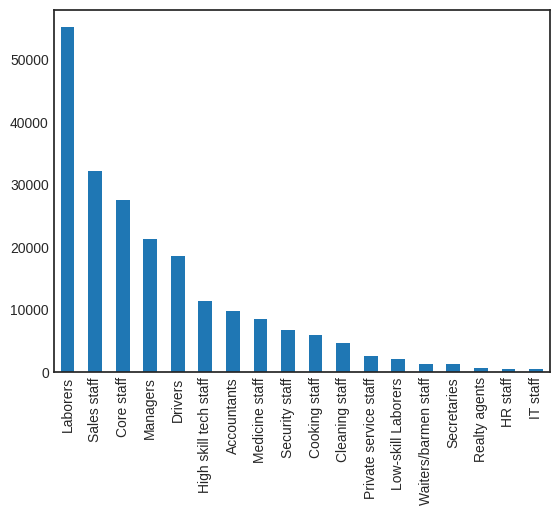

**************** WEEKDAY_APPR_PROCESS_START ****************



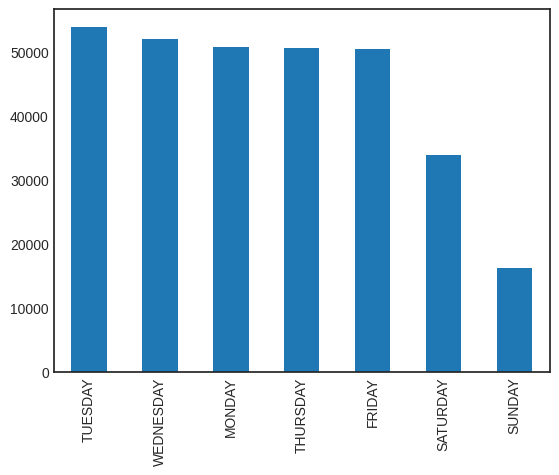

**************** ORGANIZATION_TYPE ****************



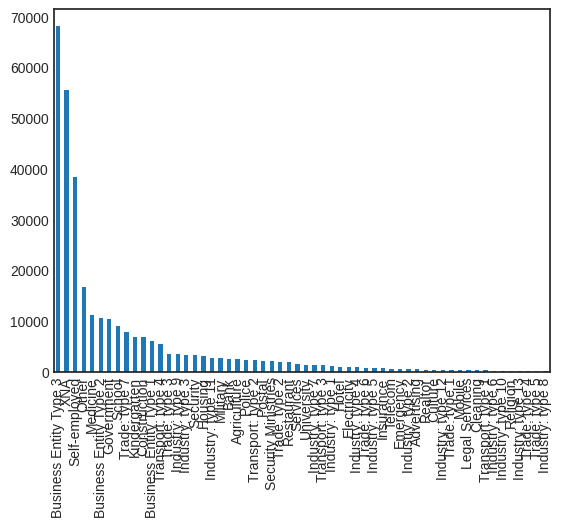

**************** HOUSETYPE_MODE ****************



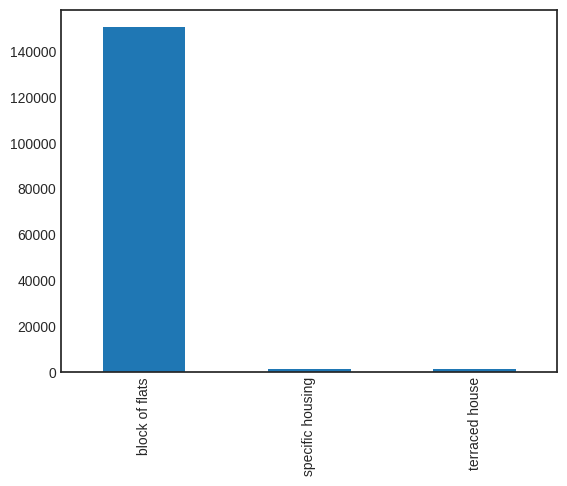

**************** WALLSMATERIAL_MODE ****************



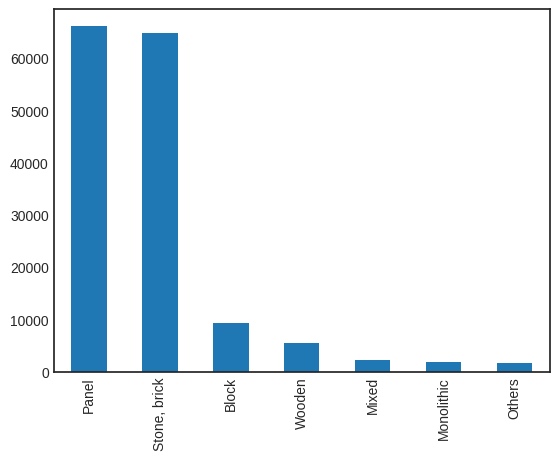

**************** EMERGENCYSTATE_MODE ****************



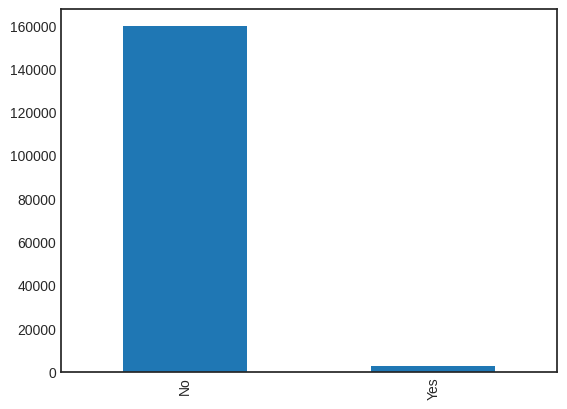

In [ ]:
# Визуализируем распределения в категориальных признаках

col_names_cat = categorical.columns

for i in range(len(col_names_cat)):
    preprocess_cat(categorical, col_names_cat[i])

In [ ]:
# У признака 'ORGANIZATION_TYPE' 58 уникальных значений,
# удалим его позже

categorical['ORGANIZATION_TYPE'].nunique()

58

In [ ]:
# У признака 'ORGANIZATION_TYPE' 18 уникальных значений,
# удалим его позже

categorical['OCCUPATION_TYPE'].nunique()

18

In [ ]:
# Заполним пропущенные значения модой для каждого признака отдельно

for i in range(len(col_names_cat)):
    replace_mode(categorical, col_names_cat[i])

NaN in NAME_CONTRACT_TYPE raplaced with Cash loans
NaN in CODE_GENDER raplaced with F
NaN in FLAG_OWN_CAR raplaced with N
NaN in FLAG_OWN_REALTY raplaced with Y
NaN in NAME_TYPE_SUITE raplaced with Unaccompanied
NaN in NAME_INCOME_TYPE raplaced with Working
NaN in NAME_EDUCATION_TYPE raplaced with Secondary / secondary special
NaN in NAME_FAMILY_STATUS raplaced with Married
NaN in NAME_HOUSING_TYPE raplaced with House / apartment
NaN in OCCUPATION_TYPE raplaced with Laborers
NaN in WEEKDAY_APPR_PROCESS_START raplaced with TUESDAY
NaN in ORGANIZATION_TYPE raplaced with Business Entity Type 3
NaN in HOUSETYPE_MODE raplaced with block of flats
NaN in WALLSMATERIAL_MODE raplaced with Panel
NaN in EMERGENCYSTATE_MODE raplaced with No


In [ ]:
# Проверим

pd.DataFrame(categorical.isna().sum().sort_values(ascending=False))

,0
NAME_CONTRACT_TYPE,0
CODE_GENDER,0
FLAG_OWN_CAR,0
FLAG_OWN_REALTY,0
NAME_TYPE_SUITE,0
NAME_INCOME_TYPE,0
NAME_EDUCATION_TYPE,0
NAME_FAMILY_STATUS,0
NAME_HOUSING_TYPE,0
OCCUPATION_TYPE,0


In [ ]:
# Удалим признаки с большим количеством уникальных значений

categorical.drop(columns=['ORGANIZATION_TYPE', 'OCCUPATION_TYPE'], inplace=True)

###Coding Categorical Features

In [ ]:
# Закодируем признаки

# Создадим объект класса LabelEncoder
le = LabelEncoder()

# Выполним кодирование
categorical = categorical.apply(lambda col_names_cat: le.fit_transform(col_names_cat)) 

In [ ]:
# Посмотрим на результат

categorical.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,WEEKDAY_APPR_PROCESS_START,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,0,1,0,1,6,7,4,3,1,6,0,5,0
1,0,0,0,0,1,4,1,1,1,1,0,0,0
2,1,1,1,1,6,7,4,3,1,1,0,4,0
3,0,0,0,1,6,7,4,0,1,6,0,4,0
4,0,1,0,1,6,7,4,3,1,4,0,4,0


In [ ]:
col_names_cat = categorical.columns
col_names = numeric.columns

In [ ]:
# Соберем все признаки в исходный датасет

data_after_fs[col_names_cat] = categorical[col_names_cat]
data_after_fs[col_names] = numeric[col_names]

In [ ]:
# Размерность

data_after_fs.shape

(307507, 71)

In [ ]:
# Удалим признаки с большим количеством уникальных значений
# 'ORGANIZATION_TYPE'   >>>   количество уникальных значений = 58
# 'OCCUPATION_TYPE'     >>>   количество уникальных значений = 18

data_after_fs.drop(columns=['ORGANIZATION_TYPE', 'OCCUPATION_TYPE'], inplace=True)

In [ ]:
# Проверим

data_after_fs.shape

(307507, 69)

##**Normalization**

In [ ]:
# Убедимся в отсутствии пропущенных значений

data_after_fs.isna().sum()

SK_ID_CURR                     0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
FLAG_WORK_PHONE                0
FLAG_PHONE                     0
FLAG_EMAIL                     0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RATING_CLIENT_W_CITY    0
WEEKDAY_APPR_PROCESS_START     0
HOUR_APPR_PROCESS_START        0
REG_REGION_NOT_WORK_REGION     0
LIVE_REGION_NOT_WORK_REGION    0
REG_CITY_NOT_LIVE_CITY         0
REG_CITY_N

In [ ]:
# Признаки и таргет

X = data_after_fs
y = data_fs_labels

In [ ]:
# Разделим данные на обучене и тест со стратификацией по таргету

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify = y)

In [ ]:
# Отмасштабируем признаки

# Создадим объект класса StandardScaler
scaler = StandardScaler()

# Сделаем .fit() на обучении
scaler.fit(X_train, y_train)

# .transform() на обучении и тесте (возвращает numpy, поэтому необходимо конвертировать обратно в dataframe с нужными индексами и колонками)
X_train = pd.DataFrame(scaler.transform(X_train), index=X_train.index, columns=X_train.columns)
X_test  = pd.DataFrame(scaler.transform(X_test), index=X_test.index, columns=X_test.columns)

In [ ]:
# Посмотрим на результат

X_train.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,NONLIVINGAREA_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_5,FLAG_DOCUMENT_8,FLAG_DOCUMENT_11,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_16,FLAG_DOCUMENT_18,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,LTV,DTI
195170,0.466702,-0.325245,1.387485,1.392097,0.663667,-0.577847,-0.355215,-0.824233,-0.404595,0.437791,0.916469,0.625160,-0.404928,-0.30427,-0.409002,1.107094,-0.456020,1.246255,-0.472618,1.999924,1.598705,4.072388,-0.162860,-0.102437,-0.062285,-0.972120,-1.242878,-0.230628,-0.205232,-0.291529,1.827591,2.138171,-2.272606,0.085130,0.001571,0.080174,0.068238,-0.339496,0.072307,0.025029,0.017363,0.082306,0.107342,0.280223,0.359606,-0.088745,0.096166,-0.093539,-0.087331,-0.730328,0.0,0.0,0.231201,0.639401,-0.123809,-0.297633,-0.062787,-0.059195,-0.054179,-0.100626,-0.090146,0.0,0.0,0.0,0.0,0.0,0.065166,-0.359261,1.181094
50834,-1.162146,-0.325245,1.387485,-0.718341,0.663667,-0.577847,0.046061,3.526111,2.316397,0.437791,-1.441109,0.625160,3.015630,-0.30427,-0.193109,-1.053237,-0.455914,-0.129716,-0.773893,-0.500019,-0.625506,-0.245556,-1.300238,1.860189,1.924292,1.353071,0.594074,-0.230628,-0.205232,-0.291529,1.827591,2.138171,0.000216,-0.277465,0.001571,0.080174,0.068238,-0.339496,0.072307,0.025029,0.017363,0.082306,0.107342,0.280223,0.359606,-0.088745,0.096166,-0.093539,-0.087331,-0.133004,0.0,0.0,0.131876,-1.563963,-0.123809,-0.297633,-0.062787,-0.059195,-0.054179,-0.100626,-0.090146,0.0,0.0,0.0,0.0,0.0,0.006078,-1.015377,1.624395
223598,0.784462,-0.325245,-0.720729,-0.718341,-1.506780,-0.577847,-0.441614,0.201598,-0.521117,0.437791,-0.655250,0.625160,-0.404928,-0.30427,-0.994326,-1.535118,2.135602,-2.275505,-0.569291,-0.500019,-0.625506,-0.245556,-0.162860,-0.102437,-0.062285,-0.972120,-0.936719,-0.230628,-0.205232,-0.291529,-0.547168,-0.467689,0.000216,0.818326,0.972225,0.080174,0.068238,-0.339496,0.072307,0.025029,0.017363,0.082306,0.107342,0.280223,0.359606,-0.088745,0.096166,-0.093539,-0.087331,-0.133004,0.0,0.0,0.573994,0.639401,-0.123809,-0.297633,-0.062787,-0.059195,-0.054179,-0.100626,-0.090146,0.0,0.0,0.0,0.0,0.0,0.655751,-1.015377,2.204875
307014,1.725262,-0.325245,1.387485,1.392097,0.663667,-0.577847,0.215024,1.716098,0.828709,-2.384564,0.916469,-1.684961,-0.404928,-0.30427,3.730173,-0.180443,-0.458471,1.314330,1.729014,-0.500019,1.598705,4.072388,-0.162860,-2.065064,-2.048862,0.888033,-0.018243,-0.230628,-0.205232,-0.291529,-0.547168,-0.467689,1.840604,1.201761,0.486661,3.120667,2.295202,1.236601,3.276518,0.965360,3.330101,0.082306,2.963988,-1.012396,-0.979270,-0.088745,2.978055,-0.093539,-0.087331,-0.730328,0.0,0.0,-1.804965,-1.563963,-0.123809,3.359848,-0.062787,-0.059195,-0.054179,-0.100626,-0.090146,0.0,0.0,0.0,0.0,0.0,2.427505,0.187503,-0.121579
152059,-0.020327,-0.325245,-0.720729,-0.718341,-1.506780,2.195035,0.007665,0.722326,0.204435,-0.126680,-0.262320,0.625160,-0.404928,-0.30427,-1.150393,0.119730,-0.486475,-1.256929,0.945697,-0.500019,1.598705,-0.245556,2.111896,-0.102437,-0.06

##**Modeling**

In [ ]:
# Принимая во внимание экстремальный дисбаланс классов >> 92% / 8%
# а также тот факт, что данная метрика была указана организаторами
# соревнований, используем ROC-AUC

In [ ]:
# Для получения текущих результатов были использованы различные методы,
# которые я не включил в данную версию ноутбука, оставив их в черновике.
# Я сделал это намеренно для того, чтобы сохранить удобочитаемую
# структуру и не перегружать финальную версию.

# В текущем варианте использованы лучшие сочетания методов,
# которые дали наивысший скор.

# Коротко перечислю, что было использовано:

# 1 >> порог удаления пропущенных значений (0.5, 0.55, 0.6)
# 2 >> порог удаления коррелирующих признаков (0.97, 0.975, 0.98)
# 3 >> кодирование признаков (LabelEncoder, OHE, TargetEncoder)
# 4 >> нормализация (StandardScaler, MinMaxScaler)
# 5 >> метод главных компонент
# 6 >> полиномиальный метод конструирования признаков

###LogisticRegression

In [ ]:
# LogisticRegression

# Содадим объект класса LogisticRegression
model_LR = LogisticRegression()

# сделаем fit на обучающем датасете
model_LR.fit(X_train, y_train)

# получим предсказания
y_pred_test_LR = model_LR.predict(X_test)
y_pred_train_LR = model_LR.predict(X_train)

In [ ]:
# Для ROC-AUC нам нужны вероятности принадлежности положительному классу

# Для получения вероятностей воспользуемся методом predict_proba
# нам нужен второй столбец

y_pred_prob_test_LR = model_LR.predict_proba(X_test)[:, 1]
y_pred_prob_train_LR = model_LR.predict_proba(X_train)[:, 1]

# вычислим ROC-AUC на обучении и тесте

print('LogisticRegression')
print(f'TEST:  ROC-AUC = {roc_auc_score(y_test, y_pred_prob_test_LR)}')
print(f'TRAIN: ROC-AUC = {roc_auc_score(y_train, y_pred_prob_train_LR)}')

LogisticRegression
TEST:  ROC-AUC = 0.7458456502591384
TRAIN: ROC-AUC = 0.7428227564874794


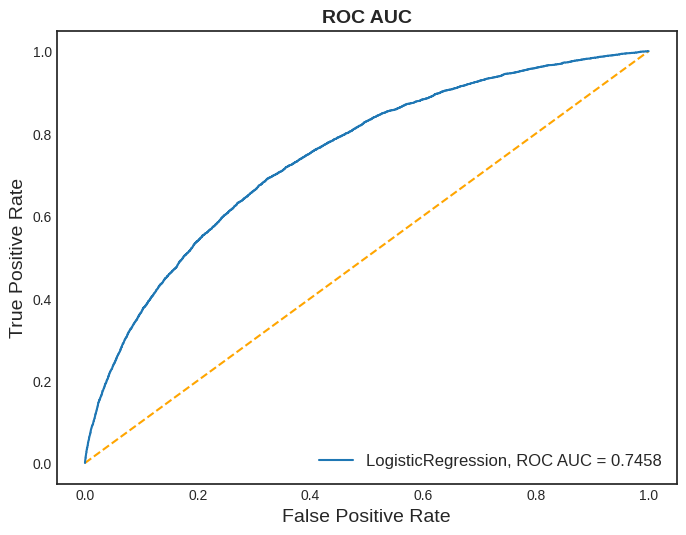

In [ ]:
# Построим ROC-кривую

fpr_lr, tpr_lr, _ = roc_curve(y_test, y_pred_prob_test_LR)

plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='orange', linestyle='--')
plt.plot(fpr_lr,
         tpr_lr,
         label=f'LogisticRegression, ROC AUC = {round(auc(fpr_lr, tpr_lr), 4)}')

plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)

plt.title('ROC AUC', fontweight='bold', fontsize=14)
plt.legend(prop={'size':12}, loc='lower right')

plt.show()

###RidgeClassifier

In [ ]:
# RidgeClassifier

# Содадим объект класса RidgeClassifier
model_RC = RidgeClassifier(alpha=1.0,
                           fit_intercept=True,
                           normalize=False,
                           copy_X=True,
                           max_iter=None,
                           tol=0.001,
                           solver='auto',
                           random_state=None)

# сделаем fit на обучающем датасете
model_RC.fit(X_train, y_train)

# получим предсказания
y_pred_test_RC = model_RC.predict(X_test)
y_pred_train_RC = model_RC.predict(X_train)

# получим вероятности
y_pred_dec_test_RC = model_RC.decision_function(X_test)
y_pred_dec_train_RC = model_RC.decision_function(X_train)

# вычислим частоту ложных срабатываний, 
# частоту истинных положительных результатов
# и пороговые значения для ROC кривой 
fpr_test_rc, tpr_test_rc, thresholds_test_rc = roc_curve(y_test, y_pred_dec_test_RC)
fpr_train_rc, tpr_train_rc, thresholds_train_rc = roc_curve(y_train, y_pred_dec_train_RC)

# вычислим площадь под кривой ROC
roc_auc_test = auc(fpr_test_rc, tpr_test_rc)
roc_auc_train = auc(fpr_train_rc, tpr_train_rc)

print('RidgeClassifier')
print(f'TEST:  ROC-AUC = {roc_auc_test}')
print(f'TRAIN: ROC-AUC = {roc_auc_train}')

RidgeClassifier
TEST:  ROC-AUC = 0.7449826768168519
TRAIN: ROC-AUC = 0.742220682632459


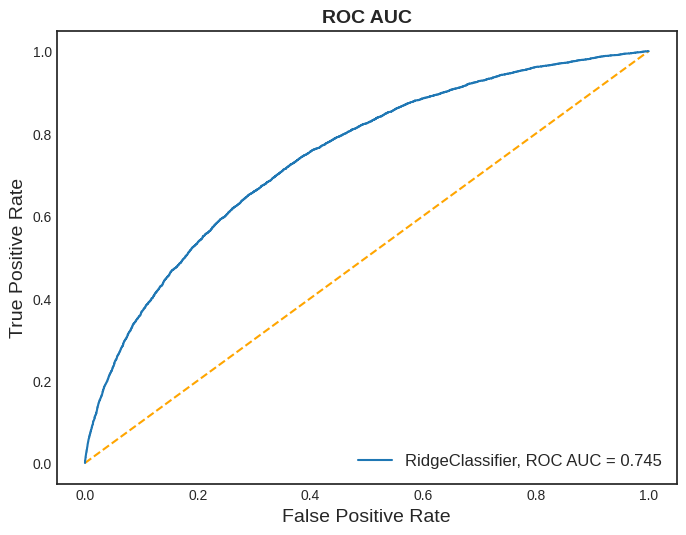

In [ ]:
# Построим ROC-кривую

fpr_rc, tpr_rc, _ = roc_curve(y_test, y_pred_dec_test_RC)

plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='orange', linestyle='--')
plt.plot(fpr_rc,
         tpr_rc,
         label=f'RidgeClassifier, ROC AUC = {round(auc(fpr_rc, tpr_rc), 4)}')

plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)

plt.title('ROC AUC', fontweight='bold', fontsize=14)
plt.legend(prop={'size':12}, loc='lower right')

plt.show()

###RandomForestClassifier

In [ ]:
# RandomForestClassifier

# Содадим объект класса RandomForestClassifier
model_RFC = RandomForestClassifier(n_estimators=100,
                                   max_depth=5,
                                   min_samples_split=2,
                                   min_samples_leaf=1,
                                   random_state=42)

# сделаем fit на обучающем датасете
model_RFC.fit(X_train, y_train)

# получим предсказания
y_pred_test_RFC = model_RFC.predict(X_test)
y_pred_train_RFC = model_RFC.predict(X_train)

In [ ]:
# Для ROC-AUC нам нужны вероятности принадлежности положительному классу

# Для получения вероятностей воспользуемся методом predict_proba
# нам нужен второй столбец

y_pred_prob_test_RFC = model_RFC.predict_proba(X_test)[:, 1]
y_pred_prob_train_RFC = model_RFC.predict_proba(X_train)[:, 1]

# вычислим ROC-AUC на обучении и тесте 

print('RandomForestClassifier')
print(f'TEST:  ROC-AUC = {roc_auc_score(y_test, y_pred_prob_test_RFC)}')
print(f'TRAIN: ROC-AUC = {roc_auc_score(y_train, y_pred_prob_train_RFC)}')

RandomForestClassifier
TEST:  ROC-AUC = 0.7377255340686182
TRAIN: ROC-AUC = 0.7389863450173901


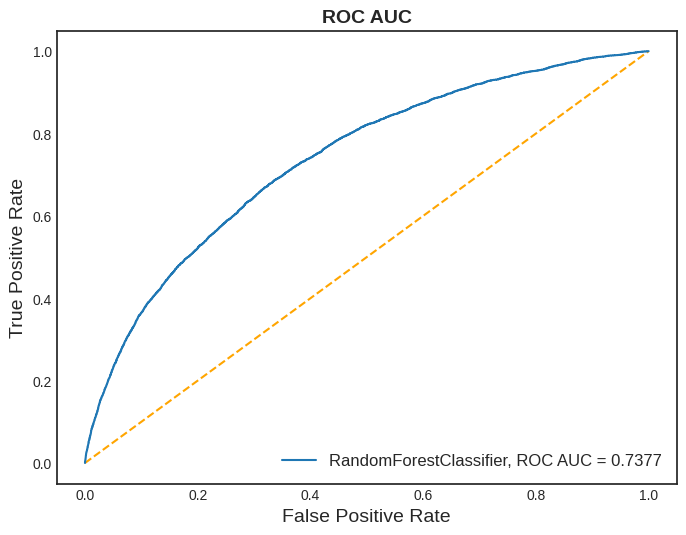

In [ ]:
# Построим ROC-кривую

fpr_rfc, tpr_rfc, _ = roc_curve(y_test, y_pred_prob_test_RFC)

plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='orange', linestyle='--')
plt.plot(fpr_rfc,
         tpr_rfc,
         label=f'RandomForestClassifier, ROC AUC = {round(auc(fpr_rfc, tpr_rfc), 4)}')

plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)

plt.title('ROC AUC', fontweight='bold', fontsize=14)
plt.legend(prop={'size':12}, loc='lower right')

plt.show()

###GradientBoostingClassifier

In [ ]:
# Подбор оптимальных гиперпараметров

param_gbc = {'learning_rate': [0.2, 0.1, 0.01, 0.05, 0.001],
             'max_depth': range(1, 6),
             'n_estimators': range(50, 300, 50)}

# Используем RandomizedSearchCV
RndSrch_Tune(GradientBoostingClassifier(random_state=100),
             X_train,
             y_train,
             param_gbc)

In [ ]:
# GradientBoostingClassifier

# Содадим объект класса GradientBoostingClassifier с подобранными параметрами
model_GBC = GradientBoostingClassifier(learning_rate=0.1, 
                                       max_depth=3,
                                       n_estimators=100, 
                                       random_state=100)

# сделаем fit на обучающем датасете
model_GBC.fit(X_train, y_train)

# получим предсказания
y_pred_test_ABC = model_GBC.predict(X_test)
y_pred_train_ABC = model_GBC.predict(X_train)

In [ ]:
# Для ROC-AUC нам нужны вероятности принадлежности положительному классу

# Для получения вероятностей воспользуемся методом predict_proba
# нам нужен второй столбец

y_pred_prob_test_GBC = model_GBC.predict_proba(X_test)[:, 1]
y_pred_prob_train_GBC = model_GBC.predict_proba(X_train)[:, 1]

# вычислим ROC-AUC на обучении и тесте 

print('GradientBoostingClassifier')
print(f'TEST:  ROC-AUC = {roc_auc_score(y_test, y_pred_prob_test_GBC)}')
print(f'TRAIN: ROC-AUC = {roc_auc_score(y_train, y_pred_prob_train_GBC)}')

GradientBoostingClassifier
TEST:  ROC-AUC = 0.7547991021431109
TRAIN: ROC-AUC = 0.7586182184843084


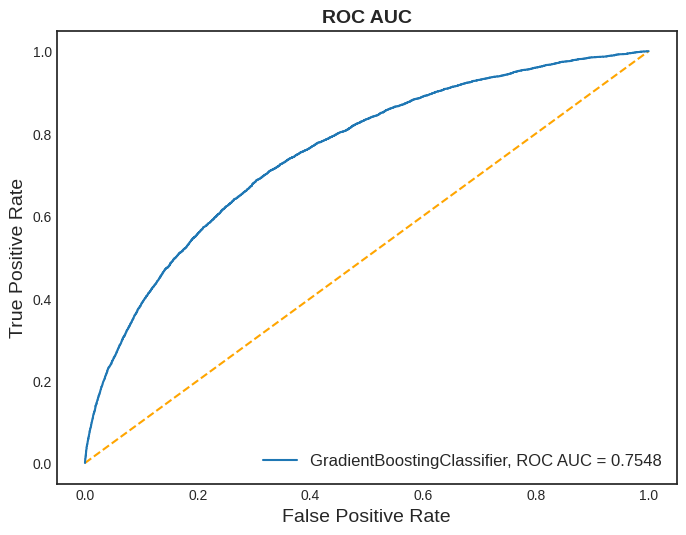

In [ ]:
# Построим ROC-кривую

fpr_gbc, tpr_gbc, _ = roc_curve(y_test, y_pred_prob_test_GBC)

plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='orange', linestyle='--')
plt.plot(fpr_gbc,
         tpr_gbc,
         label=f'GradientBoostingClassifier, ROC AUC = {round(auc(fpr_gbc, tpr_gbc), 4)}')

plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)

plt.title('ROC AUC', fontweight='bold', fontsize=14)
plt.legend(prop={'size':12}, loc='lower right')

plt.show()

###AdaBoostClassifier

In [ ]:
# Подбор оптимальных гиперпараметров

param_ada = {'learning_rate': [0.2, 0.1, 0.01, 0.05, 0.001],
             'algorithm': ['SAMME', 'SAMME.R'],
             'n_estimators': range(50, 300, 50)}

# Используем RandomizedSearchCV
RndSrch_Tune(AdaBoostClassifier(random_state=100),
             X_train,
             y_train,
             param_ada)

In [ ]:
# AdaBoostClassifier

# Содадим объект класса AdaBoostClassifier с подобранными параметрами
model_ABC = AdaBoostClassifier(learning_rate=0.2, 
                               algorithm ='SAMME.R',
                               n_estimators=200, 
                               random_state=100)

# сделаем fit на обучающем датасете
model_ABC.fit(X_train, y_train)

# получим предсказания
y_pred_test_ABC = model_ABC.predict(X_test)
y_pred_train_ABC = model_ABC.predict(X_train)

In [ ]:
# Для ROC-AUC нам нужны вероятности принадлежности положительному классу

# Для получения вероятностей воспользуемся методом predict_proba
# нам нужен второй столбец

y_pred_prob_test_ABC = model_ABC.predict_proba(X_test)[:, 1]
y_pred_prob_train_ABC = model_ABC.predict_proba(X_train)[:, 1]

# вычислим ROC-AUC на обучении и тесте 

print('AdaBoostClassifier')
print(f'TEST:  ROC-AUC = {roc_auc_score(y_test, y_pred_prob_test_ABC)}')
print(f'TRAIN: ROC-AUC = {roc_auc_score(y_train, y_pred_prob_train_ABC)}')

AdaBoostClassifier
TEST:  ROC-AUC = 0.7522531003545148
TRAIN: ROC-AUC = 0.751413778805883


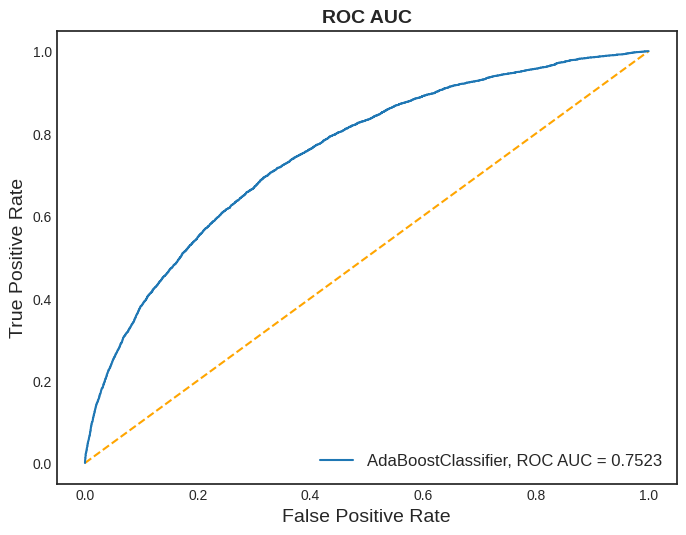

In [ ]:
# Построим ROC-кривую

fpr_abc, tpr_abc, _ = roc_curve(y_test, y_pred_prob_test_ABC)

plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='orange', linestyle='--')
plt.plot(fpr_abc,
         tpr_abc,
         label=f'AdaBoostClassifier, ROC AUC = {round(auc(fpr_abc, tpr_abc), 4)}')

plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)

plt.title('ROC AUC', fontweight='bold', fontsize=14)
plt.legend(prop={'size':12}, loc='lower right')

plt.show()

###XGBClassifier

In [ ]:
counter = Counter(y)
estimate = counter[0] / counter[1]
print(f'Estimate: {estimate}')

Estimate: 11.386988922457201


In [ ]:
# Подбор оптимальных гиперпараметров

param_xgbc = {'learning_rate': [0.2, 0.1, 0.01, 0.05, 0.001],
             'subsample': [1, 0.5, 0.2, 0.1],
             'max_depth': range(2, 11, 1),
             'n_estimators': range(50, 300, 50)}

# Используем RandomizedSearchCV
RndSrch_Tune(XGBClassifier(random_state=100,
                           n_jobs=-1,
                           scale_pos_weight=estimate), 
             X_train, y_train, param_xgbc)

In [ ]:
# XGBClassifier

# Содадим объект класса XGBClassifier с подобранными параметрами
model_XGB = XGBClassifier(learning_rate=0.2, 
                          max_depth=4, 
                          n_jobs=-1, 
                          random_state=100,
                          scale_pos_weight=11.386988922457201)

# сделаем fit на обучающем датасете
model_XGB.fit(X_train, y_train)

# получим предсказания
y_pred_test_XGB = model_XGB.predict(X_test)
y_pred_train_XGB = model_XGB.predict(X_train)

In [ ]:
# Для ROC-AUC нам нужны вероятности принадлежности положительному классу

# Для получения вероятностей воспользуемся методом predict_proba
# нам нужен второй столбец

y_pred_prob_test_XGB = model_XGB.predict_proba(X_test)[:, 1]
y_pred_prob_train_XGB = model_XGB.predict_proba(X_train)[:, 1]

# вычислим ROC-AUC на обучении и тесте 

print('XGBClassifier')
print(f'TEST:  ROC-AUC = {roc_auc_score(y_test, y_pred_prob_test_XGB)}')
print(f'TRAIN: ROC-AUC = {roc_auc_score(y_train, y_pred_prob_train_XGB)}')

XGBClassifier
TEST:  ROC-AUC = 0.7573356331756187
TRAIN: ROC-AUC = 0.7835886099555096


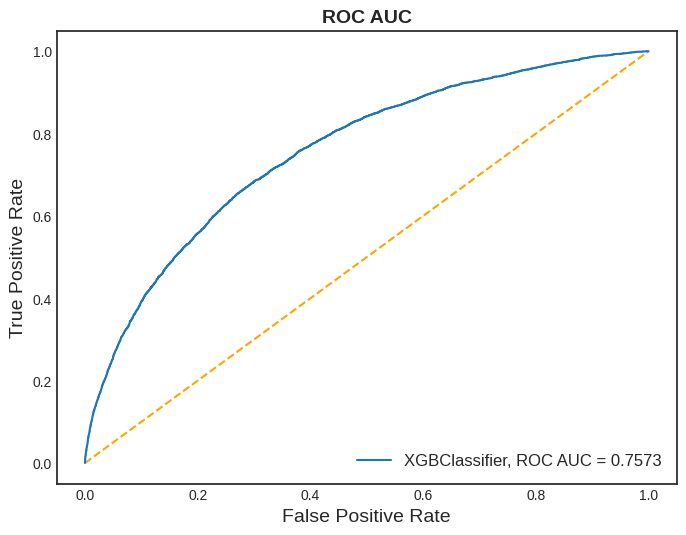

In [ ]:
# Построим ROC-кривую

fpr_xgb, tpr_xgb, _ = roc_curve(y_test, y_pred_prob_test_XGB)

plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='orange', linestyle='--')
plt.plot(fpr_xgb,
         tpr_xgb,
         label=f'XGBClassifier, ROC AUC = {round(auc(fpr_xgb, tpr_xgb), 4)}')

plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)

plt.title('ROC AUC', fontweight='bold', fontsize=14)
plt.legend(prop={'size':12}, loc='lower right')

plt.show()

###LGBMClassifier

In [ ]:
# Подбор оптимальных гиперпараметров

param_lgb = {'learning_rate': [0.2, 0.1, 0.01, 0.05, 0.001],
             'num_leaves': range(10, 100, 10),
             'min_child_samples': range(500, 1000, 100),
             'reg_alpha': [0.1, 0.01, 0.2, 0.3],
             'reg_lambda': [0.1, 0.01, 0.2, 0.3],
             'n_estimators': range(50, 300, 50),
             'max_bin': range(500, 1500, 100)}

# Используем RandomizedSearchCV
RndSrch_Tune(LGBMClassifier(random_state=100,
                            n_jobs=-1,
                            class_weight='balanced'), 
               X_train, y_train, param_lgb)

Best score is : 0.7512615058154211
Best estimator is : LGBMClassifier(class_weight='balanced', learning_rate=0.05, max_bin=500,
               min_child_samples=600, n_estimators=250, num_leaves=10,
               random_state=100, reg_alpha=0.1, reg_lambda=0.1)
Best Params is : {'reg_lambda': 0.1, 'reg_alpha': 0.1, 'num_leaves': 10, 'n_estimators': 250, 'min_child_samples': 600, 'max_bin': 500, 'learning_rate': 0.05}


0.7512615058154211

In [ ]:
# LGBMClassifier

# Содадим объект класса LGBMClassifier с подобранными параметрами
model_LGB = LGBMClassifier(**{'reg_lambda': 0.1, 
                              'reg_alpha': 0.2, 
                              'num_leaves': 70, 
                              'n_estimators': 250, 
                              'min_child_samples': 800, 
                              'learning_rate': 0.05,
                              'max_bin': 500,
                              'objective': 'binary',
                              'n_jobs': -1,
                              'class_weight':'balanced',
                              'random_state':100})

# сделаем fit на обучающем датасете
model_LGB.fit(X_train, y_train)

# получим предсказания
y_pred_test_LGB = model_LGB.predict(X_test)
y_pred_train_LGB = model_LGB.predict(X_train)

In [ ]:
# Для ROC-AUC нам нужны вероятности принадлежности положительному классу

# Для получения вероятностей воспользуемся методом predict_proba
# нам нужен второй столбец

y_pred_prob_test_LGB = model_LGB.predict_proba(X_test)[:, 1]
y_pred_prob_train_LGB = model_LGB.predict_proba(X_train)[:, 1]

# вычислим ROC-AUC на обучении и тесте 

print('LGBMClassifier')
print(f'TEST:  ROC-AUC = {roc_auc_score(y_test, y_pred_prob_test_LGB)}')
print(f'TRAIN: ROC-AUC = {roc_auc_score(y_train, y_pred_prob_train_LGB)}')

LGBMClassifier
TEST:  ROC-AUC = 0.7611103751696547
TRAIN: ROC-AUC = 0.8416428118944531


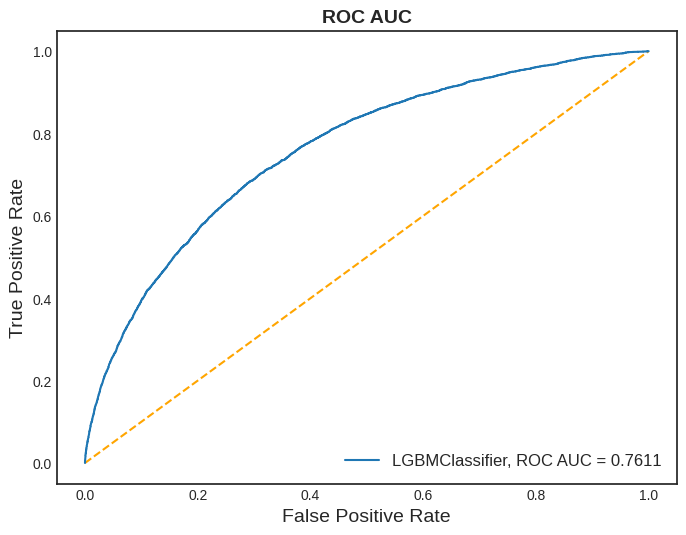

In [ ]:
# Построим ROC-кривую

fpr_lgb, tpr_lgb, _ = roc_curve(y_test, y_pred_prob_test_LGB)

plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='orange', linestyle='--')
plt.plot(fpr_lgb, tpr_lgb, label=f'LGBMClassifier, ROC AUC = {round(auc(fpr_lgb, tpr_lgb), 4)}')

plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)

plt.title('ROC AUC', fontweight='bold', fontsize=14)
plt.legend(prop={'size':12}, loc='lower right')

plt.show()

###4 x LGBMClassifier

In [ ]:
# 4 x LGBMClassifier

# Создадим 4 модели LGBMClassifier с разными гиперпараметрами
model1 = LGBMClassifier(**{'reg_lambda': 0.1, 
                           'reg_alpha': 0.2, 
                           'num_leaves': 70, 
                           'n_estimators': 250, 
                           'min_child_samples': 800, 
                           'learning_rate': 0.05,
                           'max_bin': 500,
                           'objective': 'binary',
                           'n_jobs': -1,
                           'class_weight':'balanced',
                           'random_state':100})
model2 = LGBMClassifier(**{'reg_lambda': 0.1, 
                           'reg_alpha': 0.2, 
                           'num_leaves': 70, 
                           'n_estimators': 500, 
                           'min_child_samples': 800, 
                           'learning_rate': 0.01,
                           'max_bin': 500,
                           'objective': 'binary',
                           'n_jobs': -1,
                           'class_weight':'balanced',
                           'random_state':100})
model3 = LGBMClassifier(**{'reg_lambda': 0.1, 
                           'reg_alpha': 0.2, 
                           'num_leaves': 70, 
                           'n_estimators': 1500, 
                           'min_child_samples': 800, 
                           'learning_rate': 0.1,
                           'max_bin': 500,
                           'objective': 'binary',
                           'n_jobs': -1,
                           'class_weight':'balanced',
                           'random_state':100})
model4 = LGBMClassifier(**{'reg_lambda': 0.1, 
                           'reg_alpha': 0.2, 
                           'num_leaves': 70, 
                           'n_estimators': 1000, 
                           'min_child_samples': 800, 
                           'learning_rate': 0.05,
                           'max_bin': 500,
                           'objective': 'binary',
                           'n_jobs': -1,
                           'class_weight':'balanced',
                           'random_state':100})

# сделаем fit на обучающем датасете
model1.fit(X_train, y_train)
model2.fit(X_train, y_train)
model3.fit(X_train, y_train)
model4.fit(X_train, y_train)

# получим предсказания
y_pred_test_model1 = model1.predict(X_test)
y_pred_train_model1 = model1.predict(X_train)
y_pred_test_model2 = model2.predict(X_test)
y_pred_train_model2 = model2.predict(X_train)
y_pred_test_model3 = model3.predict(X_test)
y_pred_train_model3 = model3.predict(X_train)
y_pred_test_model4 = model4.predict(X_test)
y_pred_train_model4 = model4.predict(X_train)

# получим вероятности
y_pred_prob_test_model1 = model1.predict_proba(X_test)[:, 1]
y_pred_prob_train_model1 = model1.predict_proba(X_train)[:, 1]
y_pred_prob_test_model2 = model2.predict_proba(X_test)[:, 1]
y_pred_prob_train_model2 = model2.predict_proba(X_train)[:, 1]
y_pred_prob_test_model3 = model3.predict_proba(X_test)[:, 1]
y_pred_prob_train_model3 = model3.predict_proba(X_train)[:, 1]
y_pred_prob_test_model4 = model4.predict_proba(X_test)[:, 1]
y_pred_prob_train_model4 = model4.predict_proba(X_train)[:, 1]

# объединим результаты 4 моделей
final_preds_test = (y_pred_prob_test_model1\
                  + y_pred_prob_test_model2\
                  + y_pred_prob_test_model3\
                  + y_pred_prob_test_model4) / 4
final_preds_train = (y_pred_prob_train_model1\
                   + y_pred_prob_train_model2\
                   + y_pred_prob_train_model3\
                   + y_pred_prob_train_model4) / 4

# вычислим ROC-AUC на обучении и тесте 
print('4 x LGBMClassifier')
print(f'TEST:  ROC-AUC = {roc_auc_score(y_test, final_preds_test)}')
print(f'TRAIN: ROC-AUC = {roc_auc_score(y_train, final_preds_train)}')

4 x LGBMClassifier
TEST:  ROC-AUC = 0.7607360906040534
TRAIN: ROC-AUC = 0.946838573323085


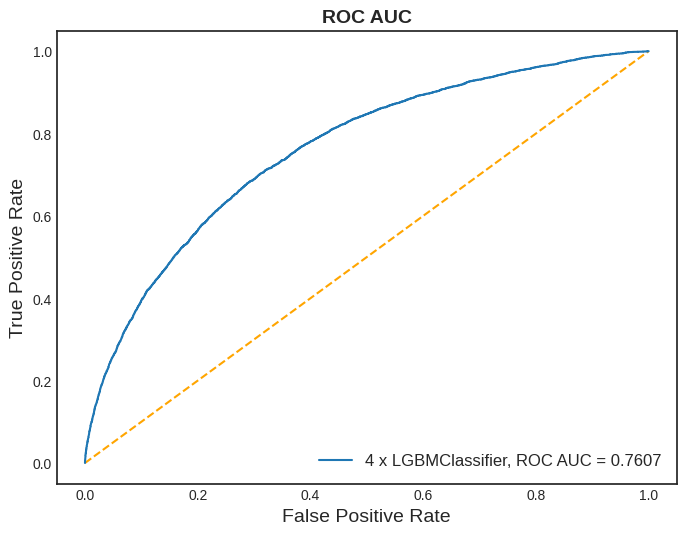

In [ ]:
# Построим ROC-кривую

fpr_4lgb, tpr_4lgb, _ = roc_curve(y_test, final_preds_test)

plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='orange', linestyle='--')
plt.plot(fpr_lgb,
         tpr_lgb,
         label=f'4 x LGBMClassifier, ROC AUC = {round(auc(fpr_4lgb, tpr_4lgb), 4)}')

plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)

plt.title('ROC AUC', fontweight='bold', fontsize=14)
plt.legend(prop={'size':12}, loc='lower right')

plt.show()

###Stacking

In [ ]:
# Определим базовые модели
stack_rfc = RandomForestClassifier(n_estimators=100, random_state=42)
stack_gbc = GradientBoostingClassifier(n_estimators=100, random_state=42)

# сделаем fit на обучающем датасете
stack_rfc.fit(X_train, y_train)
stack_gbc.fit(X_train, y_train)

# получим вероятности на тестовом наборе данных
stack_rfc_prob = stack_rfc.predict_proba(X_test)[:, 1]
stack_gbc_prob = stack_gbc.predict_proba(X_test)[:, 1]

# создадим метапризнаки
meta_features = np.column_stack((stack_rfc_prob, stack_gbc_prob))

# определим метамодель
meta_model = LogisticRegression()

# сделаем fit на метапризнаках
meta_model.fit(meta_features, y_test)

# получим вероятности на тестовом наборе данных
stacked_prob = meta_model.predict_proba(meta_features)[:, 1]

# вычислим ROC-AUC
print('Stacking')
print(f'TEST:  ROC-AUC = {roc_auc_score(y_test, stacked_prob)}')

Stacking
TEST:  ROC-AUC = 0.7509737075459376


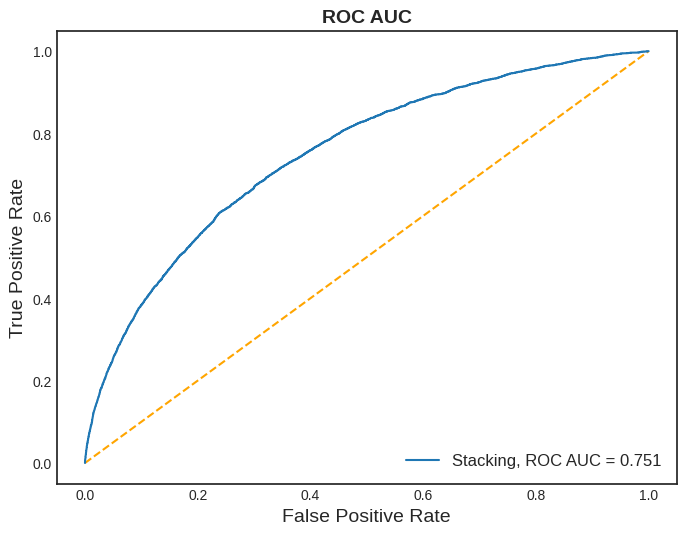

In [ ]:
# Построим ROC-кривую

fpr_stc, tpr_stc, _ = roc_curve(y_test, stacked_prob)

plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='orange', linestyle='--')
plt.plot(fpr_stc,
         tpr_stc,
         label=f'Stacking, ROC AUC = {round(auc(fpr_stc, tpr_stc), 4)}')

plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)

plt.title('ROC AUC', fontweight='bold', fontsize=14)
plt.legend(prop={'size':12}, loc='lower right')

plt.show()

##**Evaluation**

In [ ]:
# Результаты

print('RandomForestClassifier')
print(f'TEST:  ROC-AUC = {round(roc_auc_score(y_test, y_pred_prob_test_RFC), 5)}\n')

print('RidgeClassifier')
print(f'TEST:  ROC-AUC = {round(roc_auc_test, 5)}\n')

print('LogisticRegression')
print(f'TEST:  ROC-AUC = {round(roc_auc_score(y_test, y_pred_prob_test_LR), 5)}\n')

print('Stacking')
print(f'TEST:  ROC-AUC = {round(roc_auc_score(y_test, stacked_prob), 5)}\n')

print('AdaBoostClassifier')
print(f'TEST:  ROC-AUC = {round(roc_auc_score(y_test, y_pred_prob_test_ABC), 5)}\n')

print('GradientBoostingClassifier')
print(f'TEST:  ROC-AUC = {round(roc_auc_score(y_test, y_pred_prob_test_GBC), 5)}\n')

print('XGBClassifier')
print(f'TEST:  ROC-AUC = {round(roc_auc_score(y_test, y_pred_prob_test_XGB), 5)}\n')

print('4 x LGBMClassifier')
print(f'TEST:  ROC-AUC = {round(roc_auc_score(y_test, final_preds_test), 5)}\n')

print('LGBMClassifier')
print(f'TEST:  ROC-AUC = {round(roc_auc_score(y_test, y_pred_prob_test_LGB), 5)}')

RandomForestClassifier
TEST:  ROC-AUC = 0.73773

RidgeClassifier
TEST:  ROC-AUC = 0.74498

LogisticRegression
TEST:  ROC-AUC = 0.74585

Stacking
TEST:  ROC-AUC = 0.75097

AdaBoostClassifier
TEST:  ROC-AUC = 0.75225

GradientBoostingClassifier
TEST:  ROC-AUC = 0.7548

XGBClassifier
TEST:  ROC-AUC = 0.75734

4 x LGBMClassifier
TEST:  ROC-AUC = 0.76074

LGBMClassifier
TEST:  ROC-AUC = 0.76111


In [ ]:
# Лучшая модель   >>>   LGBMClassifier

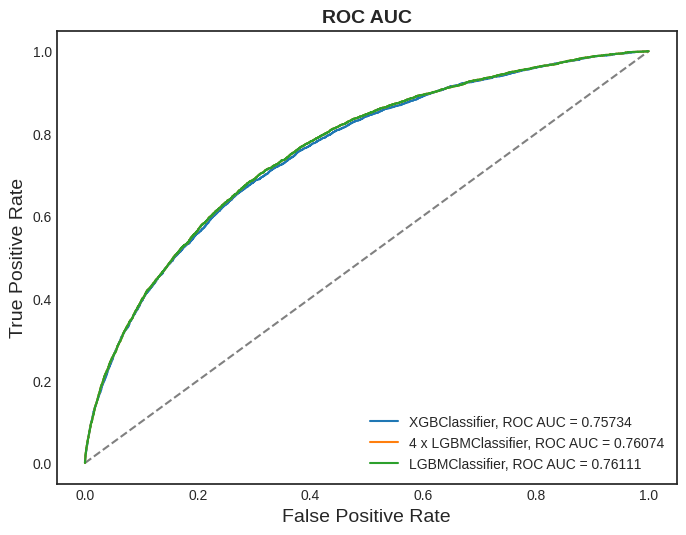

In [ ]:
# Построим ROC-кривые для лучших моделей

fpr_xgb, tpr_xgb, _ = roc_curve(y_test, y_pred_prob_test_XGB)
fpr_4lgb, tpr_4lgb, _ = roc_curve(y_test, final_preds_test)
fpr_lgb, tpr_lgb, _ = roc_curve(y_test, y_pred_prob_test_LGB)

plt.figure(figsize=(8, 6))

plt.plot([0, 1], [0, 1], color='grey', linestyle='--')
plt.plot(fpr_xgb,
         tpr_xgb,
         label=f'XGBClassifier, ROC AUC = {round(auc(fpr_xgb, tpr_xgb), 5)}')
plt.plot(fpr_lgb,
         tpr_lgb,
         label=f'4 x LGBMClassifier, ROC AUC = {round(auc(fpr_4lgb, tpr_4lgb), 5)}')
plt.plot(fpr_lgb,
         tpr_lgb,
         label=f'LGBMClassifier, ROC AUC = {round(auc(fpr_lgb, tpr_lgb), 5)}')

plt.ylabel('True Positive Rate', fontsize=14)
plt.xlabel('False Positive Rate', fontsize=14)

plt.title('ROC AUC', fontweight='bold', fontsize=14)
plt.legend(prop={'size':10}, loc='lower right')

plt.show()